# library

In [1]:
library(Seurat)
library(ggplot2)
library(dplyr)

Loading required package: SeuratObject

Loading required package: sp


Attaching package: ‘SeuratObject’


The following object is masked from ‘package:base’:

    intersect



Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union




# load data

In [9]:
load('/newdatc/home/wanglab41/opto_fMRI_ST/total32_reg20240630.RDA')

In [7]:
ls()

[1] "PrL_con_caudal1_th"   "PrL_con_caudal2_th"   "PrL_con_caudal3_th"  
 [4] "PrL_con_caudal4_th"   "PrL_con_rostral1_th"  "PrL_con_rostral2_th" 
 [7] "PrL_con_rostral3_th"  "PrL_con_rostral4_th"  "PrL_test_caudal1_th" 
[10] "PrL_test_caudal2_th"  "PrL_test_caudal3_th"  "PrL_test_caudal4_th" 
[13] "PrL_test_caudal5_th"  "PrL_test_rostral1_th" "PrL_test_rostral2_th"
[16] "PrL_test_rostral3_th" "PrL_test_rostral4_th" "PrL_test_rostral5_th"
[19] "SUB_con_caudal1_th"   "SUB_con_caudal2_th"   "SUB_con_caudal3_th"  
[22] "SUB_con_rostral1_th"  "SUB_con_rostral2_th"  "SUB_con_rostral3_th" 
[25] "SUB_test_caudal1_th"  "SUB_test_caudal2_th"  "SUB_test_caudal3_th" 
[28] "SUB_test_caudal4_th"  "SUB_test_rostral1_th" "SUB_test_rostral2_th"
[31] "SUB_test_rostral3_th" "SUB_test_rostral4_th"

In [ ]:
## sample info
PrL_con_rostral1 -- 176 con_3
PrL_con_rostral2 -- 176 con_4
PrL_con_caudal1 -- 176 con_1
PrL_con_caudal2 -- 176 con_2
PrL_test_rostral1 -- 168 test_3
PrL_test_rostral2 -- 168 test_4
PrL_test_caudal1 -- 168 test_1
PrL_test_caudal2 -- 168 test_2
SUB_con_rostral1 -- 190 con_7
SUB_con_rostral2 -- 190 con_8
SUB_con_caudal1 -- 190 con_5
SUB_con_caudal2 -- 190 con_6
SUB_test_rostral1 -- 191 test_7
SUB_test_rostral2 -- 191 test_8
SUB_test_caudal1 -- 191 test_5
SUB_test_caudal2 -- 191 test_6
PrL_test_rostral3 -- 201 test_11
PrL_test_rostral4 -- 201 test_12
PrL_test_caudal3 -- 201 test_9
PrL_test_caudal4 -- 201 test_10
PrL_test_rostral5 -- 186 test_14
PrL_test_caudal5 -- 186 test_13
PrL_con_rostral3 -- 182 con_10
PrL_con_caudal3 -- 182 con_9
SUB_con_rostral3 -- 194 con_12
SUB_con_caudal3 -- 194 con_11
PrL_con_rostral4 -- 178 con_14
PrL_con_caudal4 -- 178 con_13
SUB_test_rostral3 -- 193 test_17
SUB_test_rostral4 -- 193 test_18
SUB_test_caudal3 -- 193 test_15
SUB_test_caudal4 -- 193 test_16

# meta from registration

## PrL_con_rostral1

In [12]:
PrL_con_rostral1$CCF_atlas <- NULL
PrL_con_rostral1$PL_activation <- NULL
PrL_con_rostral1$thalamus <- NULL
PrL_con_rostral1$`SCT_snn_res.1` <- NULL
PrL_con_rostral1$seurat_clusters <- NULL
PrL_con_rostral1$thalamus_combined <- NULL

In [13]:
head(PrL_con_rostral1@meta.data)

,orig.ident,nCount_Spatial,nFeature_Spatial,sample,case,nCount_SCT,nFeature_SCT,design,position
,<fct>,<dbl>,<int>,<chr>,<chr>,<dbl>,<int>,<chr>,<chr>
AAACAAGTATCTCCCA-1,SeuratProject,13400,4267,PrL_con_rostral1,PrL,16413,4267,control,rostral
AAACAATCTACTAGCA-1,SeuratProject,6374,2748,PrL_con_rostral1,PrL,15620,3669,control,rostral
AAACAGAGCGACTCCT-1,SeuratProject,10019,3665,PrL_con_rostral1,PrL,16338,3788,control,rostral
AAACATTTCCCGGATT-1,SeuratProject,32863,7049,PrL_con_rostral1,PrL,19007,6047,control,rostral
AAACCACTACACAGAT-1,SeuratProject,16143,4876,PrL_con_rostral1,PrL,16844,4873,control,rostral
AAACCGGGTAGGTACC-1,SeuratProject,7930,3078,PrL_con_rostral1,PrL,16182,3616,control,rostral


In [14]:
meta <- read.csv('/date/home/wanglab33/02Thalamus/save_10x_info_624/176_PFCcon_10X/Image_32_con_3.csv',
                 row.names=1)

In [28]:
meta_ <- meta[meta$in_tissue == 1,]
meta_ <- meta_[,c('CCF_atlas','ofmri_activation','ofmri_10x_activation')]

In [31]:
PrL_con_rostral1

An object of class Seurat 
50401 features across 2874 samples within 2 assays 
Active assay: SCT (18108 features, 3000 variable features)
 1 other assay present: Spatial
 1 dimensional reduction calculated: pca
 1 image present: slice1

In [33]:
PrL_con_rostral1 <- AddMetaData(PrL_con_rostral1,meta_)

In [18]:
tha <- read.csv('/date/home/wanglab33/02Thalamus/picture/allen_CCF_thalamus_LandR_white0710.csv',row.names=1)

In [39]:
PrL_con_rostral1$thalamus <- 'others'
PrL_con_rostral1$thalamus[PrL_con_rostral1$CCF_atlas %in% tha$ACR_name] <- 'thalamus'

## PrL_con_rostral2

In [42]:
PrL_con_rostral2$CCF_atlas <- NULL
PrL_con_rostral2$PL_activation <- NULL
PrL_con_rostral2$thalamus <- NULL
PrL_con_rostral2$`SCT_snn_res.1` <- NULL
PrL_con_rostral2$seurat_clusters <- NULL
PrL_con_rostral2$thalamus_combined <- NULL

In [43]:
meta <- read.csv('/date/home/wanglab33/02Thalamus/save_10x_info_624/176_PFCcon_10X/Image_31_con_4.csv',
                 row.names=1)

In [44]:
meta_ <- meta[meta$in_tissue == 1,]
meta_ <- meta_[,c('CCF_atlas','ofmri_activation','ofmri_10x_activation')]

In [45]:
PrL_con_rostral2

An object of class Seurat 
50438 features across 2648 samples within 2 assays 
Active assay: SCT (18145 features, 3000 variable features)
 1 other assay present: Spatial
 1 dimensional reduction calculated: pca
 1 image present: slice1

In [46]:
dim(meta_)

[1] 2648    3

In [47]:
PrL_con_rostral2 <- AddMetaData(PrL_con_rostral2,meta_)

In [48]:
PrL_con_rostral2$thalamus <- 'others'
PrL_con_rostral2$thalamus[PrL_con_rostral2$CCF_atlas %in% tha$ACR_name] <- 'thalamus'

## PrL_con_rostral3

In [49]:
PrL_con_rostral3$CCF_atlas <- NULL
PrL_con_rostral3$PL_activation <- NULL
PrL_con_rostral3$thalamus <- NULL
PrL_con_rostral3$`SCT_snn_res.1` <- NULL
PrL_con_rostral3$seurat_clusters <- NULL
PrL_con_rostral3$thalamus_combined <- NULL

In [50]:
meta <- read.csv('/date/home/wanglab33/02Thalamus/save_10x_info_624/182_PFCcon_10X/Image_02_con_10.csv',
                 row.names=1)

In [51]:
meta_ <- meta[meta$in_tissue == 1,]
meta_ <- meta_[,c('CCF_atlas','ofmri_activation','ofmri_10x_activation')]

In [52]:
PrL_con_rostral3

An object of class Seurat 
50249 features across 3197 samples within 2 assays 
Active assay: SCT (17956 features, 3000 variable features)
 1 other assay present: Spatial
 1 dimensional reduction calculated: pca
 1 image present: slice1

In [53]:
dim(meta_)

[1] 3197    3

In [54]:
PrL_con_rostral3 <- AddMetaData(PrL_con_rostral3,meta_)

In [55]:
PrL_con_rostral3$thalamus <- 'others'
PrL_con_rostral3$thalamus[PrL_con_rostral3$CCF_atlas %in% tha$ACR_name] <- 'thalamus'

## PrL_con_rostral4

In [56]:
PrL_con_rostral4$CCF_atlas <- NULL
PrL_con_rostral4$PL_activation <- NULL
PrL_con_rostral4$thalamus <- NULL
PrL_con_rostral4$`SCT_snn_res.1` <- NULL
PrL_con_rostral4$seurat_clusters <- NULL
PrL_con_rostral4$thalamus_combined <- NULL

In [57]:
meta <- read.csv('/date/home/wanglab33/02Thalamus/save_10x_info_624/178_PFCcon_10X/Image_04_con_14.csv',
                 row.names=1)

In [58]:
meta_ <- meta[meta$in_tissue == 1,]
meta_ <- meta_[,c('CCF_atlas','ofmri_activation','ofmri_10x_activation')]

In [59]:
PrL_con_rostral4

An object of class Seurat 
50255 features across 2824 samples within 2 assays 
Active assay: SCT (17962 features, 3000 variable features)
 1 other assay present: Spatial
 1 dimensional reduction calculated: pca
 1 image present: slice1

In [60]:
dim(meta_)

[1] 2824    3

In [61]:
PrL_con_rostral4 <- AddMetaData(PrL_con_rostral4,meta_)

In [62]:
PrL_con_rostral4$thalamus <- 'others'
PrL_con_rostral4$thalamus[PrL_con_rostral4$CCF_atlas %in% tha$ACR_name] <- 'thalamus'

## PrL_con_caudal1

In [63]:
PrL_con_caudal1$CCF_atlas <- NULL
PrL_con_caudal1$PL_activation <- NULL
PrL_con_caudal1$thalamus <- NULL
PrL_con_caudal1$`SCT_snn_res.1` <- NULL
PrL_con_caudal1$seurat_clusters <- NULL
PrL_con_caudal1$thalamus_combined <- NULL

In [64]:
meta <- read.csv('/date/home/wanglab33/02Thalamus/save_10x_info_624/176_PFCcon_10X/Image_34_con_1.csv',
                 row.names=1)

In [65]:
meta_ <- meta[meta$in_tissue == 1,]
meta_ <- meta_[,c('CCF_atlas','ofmri_activation','ofmri_10x_activation')]

In [66]:
PrL_con_caudal1

An object of class Seurat 
50017 features across 2807 samples within 2 assays 
Active assay: SCT (17724 features, 3000 variable features)
 1 other assay present: Spatial
 1 dimensional reduction calculated: pca
 1 image present: slice1

In [67]:
dim(meta_)

[1] 2807    3

In [68]:
PrL_con_caudal1 <- AddMetaData(PrL_con_caudal1,meta_)

In [69]:
PrL_con_caudal1$thalamus <- 'others'
PrL_con_caudal1$thalamus[PrL_con_caudal1$CCF_atlas %in% tha$ACR_name] <- 'thalamus'

## PrL_con_caudal2

In [70]:
PrL_con_caudal2$CCF_atlas <- NULL
PrL_con_caudal2$PL_activation <- NULL
PrL_con_caudal2$thalamus <- NULL
PrL_con_caudal2$`SCT_snn_res.1` <- NULL
PrL_con_caudal2$seurat_clusters <- NULL
PrL_con_caudal2$thalamus_combined <- NULL

In [71]:
meta <- read.csv('/date/home/wanglab33/02Thalamus/save_10x_info_624/176_PFCcon_10X/Image_33_con_2.csv',
                 row.names=1)

In [72]:
meta_ <- meta[meta$in_tissue == 1,]
meta_ <- meta_[,c('CCF_atlas','ofmri_activation','ofmri_10x_activation')]

In [73]:
PrL_con_caudal2

An object of class Seurat 
50390 features across 3436 samples within 2 assays 
Active assay: SCT (18097 features, 3000 variable features)
 1 other assay present: Spatial
 1 dimensional reduction calculated: pca
 1 image present: slice1

In [74]:
dim(meta_)

[1] 3436    3

In [75]:
PrL_con_caudal2 <- AddMetaData(PrL_con_caudal2,meta_)

In [76]:
PrL_con_caudal2$thalamus <- 'others'
PrL_con_caudal2$thalamus[PrL_con_caudal2$CCF_atlas %in% tha$ACR_name] <- 'thalamus'

## PrL_con_caudal3

In [77]:
PrL_con_caudal3$CCF_atlas <- NULL
PrL_con_caudal3$PL_activation <- NULL
PrL_con_caudal3$thalamus <- NULL
PrL_con_caudal3$`SCT_snn_res.1` <- NULL
PrL_con_caudal3$seurat_clusters <- NULL
PrL_con_caudal3$thalamus_combined <- NULL

In [78]:
meta <- read.csv('/date/home/wanglab33/02Thalamus/save_10x_info_624/182_PFCcon_10X/Image_03_con_9.csv',
                 row.names=1)

In [79]:
meta_ <- meta[meta$in_tissue == 1,]
meta_ <- meta_[,c('CCF_atlas','ofmri_activation','ofmri_10x_activation')]

In [80]:
PrL_con_caudal3

An object of class Seurat 
50154 features across 3300 samples within 2 assays 
Active assay: SCT (17861 features, 3000 variable features)
 1 other assay present: Spatial
 1 dimensional reduction calculated: pca
 1 image present: slice1

In [81]:
dim(meta_)

[1] 3300    3

In [82]:
PrL_con_caudal3 <- AddMetaData(PrL_con_caudal3,meta_)

In [83]:
PrL_con_caudal3$thalamus <- 'others'
PrL_con_caudal3$thalamus[PrL_con_caudal3$CCF_atlas %in% tha$ACR_name] <- 'thalamus'

## PrL_con_caudal4

In [84]:
PrL_con_caudal4$CCF_atlas <- NULL
PrL_con_caudal4$PL_activation <- NULL
PrL_con_caudal4$thalamus <- NULL
PrL_con_caudal4$`SCT_snn_res.1` <- NULL
PrL_con_caudal4$seurat_clusters <- NULL
PrL_con_caudal4$thalamus_combined <- NULL

In [85]:
meta <- read.csv('/date/home/wanglab33/02Thalamus/save_10x_info_624/178_PFCcon_10X/Image_05_con_13.csv',
                 row.names=1)

In [86]:
meta_ <- meta[meta$in_tissue == 1,]
meta_ <- meta_[,c('CCF_atlas','ofmri_activation','ofmri_10x_activation')]

In [87]:
PrL_con_caudal4

An object of class Seurat 
50187 features across 3342 samples within 2 assays 
Active assay: SCT (17894 features, 3000 variable features)
 1 other assay present: Spatial
 1 dimensional reduction calculated: pca
 1 image present: slice1

In [88]:
dim(meta_)

[1] 3342    3

In [89]:
PrL_con_caudal4 <- AddMetaData(PrL_con_caudal4,meta_)

In [90]:
PrL_con_caudal4$thalamus <- 'others'
PrL_con_caudal4$thalamus[PrL_con_caudal4$CCF_atlas %in% tha$ACR_name] <- 'thalamus'

## PrL_test_rostral1

In [91]:
PrL_test_rostral1$CCF_atlas <- NULL
PrL_test_rostral1$PL_activation <- NULL
PrL_test_rostral1$thalamus <- NULL
PrL_test_rostral1$`SCT_snn_res.1` <- NULL
PrL_test_rostral1$seurat_clusters <- NULL
PrL_test_rostral1$thalamus_combined <- NULL

In [92]:
meta <- read.csv('/date/home/wanglab33/02Thalamus/save_10x_info_624/168_PFCtest_10X/Image_37_test_3.csv',
                 row.names=1)

In [93]:
meta_ <- meta[meta$in_tissue == 1,]
meta_ <- meta_[,c('CCF_atlas','ofmri_activation','ofmri_10x_activation')]

In [94]:
PrL_test_rostral1

An object of class Seurat 
50282 features across 3264 samples within 2 assays 
Active assay: SCT (17989 features, 3000 variable features)
 1 other assay present: Spatial
 1 dimensional reduction calculated: pca
 1 image present: slice1

In [95]:
dim(meta_)

[1] 3264    3

In [96]:
PrL_test_rostral1 <- AddMetaData(PrL_test_rostral1,meta_)

In [97]:
PrL_test_rostral1$thalamus <- 'others'
PrL_test_rostral1$thalamus[PrL_test_rostral1$CCF_atlas %in% tha$ACR_name] <- 'thalamus'

## PrL_test_rostral2

In [98]:
PrL_test_rostral2$CCF_atlas <- NULL
PrL_test_rostral2$PL_activation <- NULL
PrL_test_rostral2$thalamus <- NULL
PrL_test_rostral2$`SCT_snn_res.1` <- NULL
PrL_test_rostral2$seurat_clusters <- NULL
PrL_test_rostral2$thalamus_combined <- NULL

In [99]:
meta <- read.csv('/date/home/wanglab33/02Thalamus/save_10x_info_624/168_PFCtest_10X/Image_36_test_4.csv',
                 row.names=1)

In [100]:
meta_ <- meta[meta$in_tissue == 1,]
meta_ <- meta_[,c('CCF_atlas','ofmri_activation','ofmri_10x_activation')]

In [101]:
PrL_test_rostral2

An object of class Seurat 
50243 features across 3211 samples within 2 assays 
Active assay: SCT (17950 features, 3000 variable features)
 1 other assay present: Spatial
 1 dimensional reduction calculated: pca
 1 image present: slice1

In [102]:
dim(meta_)

[1] 3211    3

In [103]:
PrL_test_rostral2 <- AddMetaData(PrL_test_rostral2,meta_)

In [104]:
PrL_test_rostral2$thalamus <- 'others'
PrL_test_rostral2$thalamus[PrL_test_rostral2$CCF_atlas %in% tha$ACR_name] <- 'thalamus'

## PrL_test_rostral3

In [105]:
PrL_test_rostral3$CCF_atlas <- NULL
PrL_test_rostral3$PL_activation <- NULL
PrL_test_rostral3$thalamus <- NULL
PrL_test_rostral3$`SCT_snn_res.1` <- NULL
PrL_test_rostral3$seurat_clusters <- NULL
PrL_test_rostral3$thalamus_combined <- NULL

In [106]:
meta <- read.csv('/date/home/wanglab33/02Thalamus/save_10x_info_624/201_PFCtest_10X/Image_07_test_11.csv',
                 row.names=1)

In [107]:
meta_ <- meta[meta$in_tissue == 1,]
meta_ <- meta_[,c('CCF_atlas','ofmri_activation','ofmri_10x_activation')]

In [108]:
PrL_test_rostral3

An object of class Seurat 
50280 features across 2841 samples within 2 assays 
Active assay: SCT (17987 features, 3000 variable features)
 1 other assay present: Spatial
 1 dimensional reduction calculated: pca
 1 image present: slice1

In [109]:
dim(meta_)

[1] 2841    3

In [110]:
PrL_test_rostral3 <- AddMetaData(PrL_test_rostral3,meta_)

In [111]:
PrL_test_rostral3$thalamus <- 'others'
PrL_test_rostral3$thalamus[PrL_test_rostral3$CCF_atlas %in% tha$ACR_name] <- 'thalamus'

## PrL_test_rostral4

In [112]:
PrL_test_rostral4$CCF_atlas <- NULL
PrL_test_rostral4$PL_activation <- NULL
PrL_test_rostral4$thalamus <- NULL
PrL_test_rostral4$`SCT_snn_res.1` <- NULL
PrL_test_rostral4$seurat_clusters <- NULL
PrL_test_rostral4$thalamus_combined <- NULL

In [113]:
meta <- read.csv('/date/home/wanglab33/02Thalamus/save_10x_info_624/201_PFCtest_10X/Image_06_test_12.csv',
                 row.names=1)

In [114]:
meta_ <- meta[meta$in_tissue == 1,]
meta_ <- meta_[,c('CCF_atlas','ofmri_activation','ofmri_10x_activation')]

In [115]:
PrL_test_rostral4

An object of class Seurat 
50029 features across 2852 samples within 2 assays 
Active assay: SCT (17736 features, 3000 variable features)
 1 other assay present: Spatial
 1 dimensional reduction calculated: pca
 1 image present: slice1

In [116]:
dim(meta_)

[1] 2852    3

In [117]:
PrL_test_rostral4 <- AddMetaData(PrL_test_rostral4,meta_)

In [118]:
PrL_test_rostral4$thalamus <- 'others'
PrL_test_rostral4$thalamus[PrL_test_rostral4$CCF_atlas %in% tha$ACR_name] <- 'thalamus'

## PrL_test_rostral5

In [119]:
PrL_test_rostral5$CCF_atlas <- NULL
PrL_test_rostral5$PL_activation <- NULL
PrL_test_rostral5$thalamus <- NULL
PrL_test_rostral5$`SCT_snn_res.1` <- NULL
PrL_test_rostral5$seurat_clusters <- NULL
PrL_test_rostral5$thalamus_combined <- NULL

In [120]:
meta <- read.csv('/date/home/wanglab33/02Thalamus/save_10x_info_624/186_PFCtest_10X/Image_04_test_14.csv',
                 row.names=1)

In [121]:
meta_ <- meta[meta$in_tissue == 1,]
meta_ <- meta_[,c('CCF_atlas','ofmri_activation','ofmri_10x_activation')]

In [122]:
PrL_test_rostral5

An object of class Seurat 
50322 features across 3369 samples within 2 assays 
Active assay: SCT (18029 features, 3000 variable features)
 1 other assay present: Spatial
 1 dimensional reduction calculated: pca
 1 image present: slice1

In [123]:
dim(meta_)

[1] 3369    3

In [124]:
PrL_test_rostral5 <- AddMetaData(PrL_test_rostral5,meta_)

In [125]:
PrL_test_rostral5$thalamus <- 'others'
PrL_test_rostral5$thalamus[PrL_test_rostral5$CCF_atlas %in% tha$ACR_name] <- 'thalamus'

## PrL_test_caudal1

In [126]:
PrL_test_caudal1$CCF_atlas <- NULL
PrL_test_caudal1$PL_activation <- NULL
PrL_test_caudal1$thalamus <- NULL
PrL_test_caudal1$`SCT_snn_res.1` <- NULL
PrL_test_caudal1$seurat_clusters <- NULL
PrL_test_caudal1$thalamus_combined <- NULL

In [127]:
meta <- read.csv('/date/home/wanglab33/02Thalamus/save_10x_info_624/168_PFCtest_10X/Image_39_test_1.csv',
                 row.names=1)

In [128]:
meta_ <- meta[meta$in_tissue == 1,]
meta_ <- meta_[,c('CCF_atlas','ofmri_activation','ofmri_10x_activation')]

In [129]:
PrL_test_caudal1

An object of class Seurat 
50191 features across 3133 samples within 2 assays 
Active assay: SCT (17898 features, 3000 variable features)
 1 other assay present: Spatial
 1 dimensional reduction calculated: pca
 1 image present: slice1

In [130]:
dim(meta_)

[1] 3133    3

In [131]:
PrL_test_caudal1 <- AddMetaData(PrL_test_caudal1,meta_)

In [132]:
PrL_test_caudal1$thalamus <- 'others'
PrL_test_caudal1$thalamus[PrL_test_caudal1$CCF_atlas %in% tha$ACR_name] <- 'thalamus'

## PrL_test_caudal2

In [133]:
PrL_test_caudal2$CCF_atlas <- NULL
PrL_test_caudal2$PL_activation <- NULL
PrL_test_caudal2$thalamus <- NULL
PrL_test_caudal2$`SCT_snn_res.1` <- NULL
PrL_test_caudal2$seurat_clusters <- NULL
PrL_test_caudal2$thalamus_combined <- NULL

In [134]:
meta <- read.csv('/date/home/wanglab33/02Thalamus/save_10x_info_624/168_PFCtest_10X/Image_38_test_2.csv',
                 row.names=1)

In [135]:
meta_ <- meta[meta$in_tissue == 1,]
meta_ <- meta_[,c('CCF_atlas','ofmri_activation','ofmri_10x_activation')]

In [136]:
PrL_test_caudal2

An object of class Seurat 
50500 features across 3665 samples within 2 assays 
Active assay: SCT (18207 features, 3000 variable features)
 1 other assay present: Spatial
 1 dimensional reduction calculated: pca
 1 image present: slice1

In [137]:
dim(meta_)

[1] 3665    3

In [138]:
PrL_test_caudal2 <- AddMetaData(PrL_test_caudal2,meta_)

In [139]:
PrL_test_caudal2$thalamus <- 'others'
PrL_test_caudal2$thalamus[PrL_test_caudal2$CCF_atlas %in% tha$ACR_name] <- 'thalamus'

## PrL_test_caudal3

In [140]:
PrL_test_caudal3$CCF_atlas <- NULL
PrL_test_caudal3$PL_activation <- NULL
PrL_test_caudal3$thalamus <- NULL
PrL_test_caudal3$`SCT_snn_res.1` <- NULL
PrL_test_caudal3$seurat_clusters <- NULL
PrL_test_caudal3$thalamus_combined <- NULL

In [141]:
meta <- read.csv('/date/home/wanglab33/02Thalamus/save_10x_info_624/201_PFCtest_10X/Image_09_test_9.csv',
                 row.names=1)

In [142]:
meta_ <- meta[meta$in_tissue == 1,]
meta_ <- meta_[,c('CCF_atlas','ofmri_activation','ofmri_10x_activation')]

In [143]:
PrL_test_caudal3

An object of class Seurat 
50445 features across 3522 samples within 2 assays 
Active assay: SCT (18152 features, 3000 variable features)
 1 other assay present: Spatial
 1 dimensional reduction calculated: pca
 1 image present: slice1

In [144]:
dim(meta_)

[1] 3522    3

In [145]:
PrL_test_caudal3 <- AddMetaData(PrL_test_caudal3,meta_)

In [146]:
PrL_test_caudal3$thalamus <- 'others'
PrL_test_caudal3$thalamus[PrL_test_caudal3$CCF_atlas %in% tha$ACR_name] <- 'thalamus'

## PrL_test_caudal4

In [147]:
PrL_test_caudal4$CCF_atlas <- NULL
PrL_test_caudal4$PL_activation <- NULL
PrL_test_caudal4$thalamus <- NULL
PrL_test_caudal4$`SCT_snn_res.1` <- NULL
PrL_test_caudal4$seurat_clusters <- NULL
PrL_test_caudal4$thalamus_combined <- NULL

In [148]:
meta <- read.csv('/date/home/wanglab33/02Thalamus/save_10x_info_624/201_PFCtest_10X/Image_08_test_10.csv',
                 row.names=1)

In [149]:
meta_ <- meta[meta$in_tissue == 1,]
meta_ <- meta_[,c('CCF_atlas','ofmri_activation','ofmri_10x_activation')]

In [150]:
PrL_test_caudal4

An object of class Seurat 
50374 features across 3281 samples within 2 assays 
Active assay: SCT (18081 features, 3000 variable features)
 1 other assay present: Spatial
 1 dimensional reduction calculated: pca
 1 image present: slice1

In [151]:
dim(meta_)

[1] 3281    3

In [152]:
PrL_test_caudal4 <- AddMetaData(PrL_test_caudal4,meta_)

In [153]:
PrL_test_caudal4$thalamus <- 'others'
PrL_test_caudal4$thalamus[PrL_test_caudal4$CCF_atlas %in% tha$ACR_name] <- 'thalamus'

## PrL_test_caudal5

In [154]:
PrL_test_caudal5$CCF_atlas <- NULL
PrL_test_caudal5$PL_activation <- NULL
PrL_test_caudal5$thalamus <- NULL
PrL_test_caudal5$`SCT_snn_res.1` <- NULL
PrL_test_caudal5$seurat_clusters <- NULL
PrL_test_caudal5$thalamus_combined <- NULL

In [155]:
meta <- read.csv('/date/home/wanglab33/02Thalamus/save_10x_info_624/186_PFCtest_10X/Image_05_test_13.csv',
                 row.names=1)

In [156]:
meta_ <- meta[meta$in_tissue == 1,]
meta_ <- meta_[,c('CCF_atlas','ofmri_activation','ofmri_10x_activation')]

In [157]:
PrL_test_caudal5

An object of class Seurat 
50407 features across 3571 samples within 2 assays 
Active assay: SCT (18114 features, 3000 variable features)
 1 other assay present: Spatial
 1 dimensional reduction calculated: pca
 1 image present: slice1

In [158]:
dim(meta_)

[1] 3571    3

In [159]:
PrL_test_caudal5 <- AddMetaData(PrL_test_caudal5,meta_)

In [160]:
PrL_test_caudal5$thalamus <- 'others'
PrL_test_caudal5$thalamus[PrL_test_caudal5$CCF_atlas %in% tha$ACR_name] <- 'thalamus'

## SUB_con_rostral1

In [181]:
SUB_con_rostral1$CCF_atlas <- NULL
SUB_con_rostral1$Sub_activation <- NULL
SUB_con_rostral1$thalamus <- NULL
SUB_con_rostral1$`SCT_snn_res.1` <- NULL
SUB_con_rostral1$seurat_clusters <- NULL
SUB_con_rostral1$thalamus_combined <- NULL
SUB_con_rostral1$result <- NULL
SUB_con_rostral1$th <- NULL
SUB_con_rostral1$result2 <- NULL
SUB_con_rostral1$th2 <- NULL

In [183]:
meta <- read.csv('/date/home/wanglab33/02Thalamus/save_10x_info_624/190_SUBcon_10X/Image_07_con_7.csv',
                 row.names=1)

In [184]:
meta_ <- meta[meta$in_tissue == 1,]
meta_ <- meta_[,c('CCF_atlas','ofmri_activation','ofmri_10x_activation')]

In [185]:
SUB_con_rostral1

An object of class Seurat 
50412 features across 3079 samples within 2 assays 
Active assay: SCT (18119 features, 3000 variable features)
 1 other assay present: Spatial
 1 dimensional reduction calculated: pca
 1 image present: slice1

In [186]:
dim(meta_)

[1] 3079    3

In [187]:
SUB_con_rostral1 <- AddMetaData(SUB_con_rostral1,meta_)

In [188]:
SUB_con_rostral1$thalamus <- 'others'
SUB_con_rostral1$thalamus[SUB_con_rostral1$CCF_atlas %in% tha$ACR_name] <- 'thalamus'

## SUB_con_rostral2

In [168]:
SUB_con_rostral2$CCF_atlas <- NULL
SUB_con_rostral2$PL_activation <- NULL
SUB_con_rostral2$thalamus <- NULL
SUB_con_rostral2$`SCT_snn_res.1` <- NULL
SUB_con_rostral2$seurat_clusters <- NULL
SUB_con_rostral2$thalamus_combined <- NULL

In [169]:
meta <- read.csv('/date/home/wanglab33/02Thalamus/save_10x_info_624/190_SUBcon_10X/Image_06_con_8.csv',
                 row.names=1)

In [170]:
meta_ <- meta[meta$in_tissue == 1,]
meta_ <- meta_[,c('CCF_atlas','ofmri_activation','ofmri_10x_activation')]

In [171]:
SUB_con_rostral2

An object of class Seurat 
50562 features across 3058 samples within 2 assays 
Active assay: SCT (18269 features, 3000 variable features)
 1 other assay present: Spatial
 1 dimensional reduction calculated: pca
 1 image present: slice1

In [172]:
dim(meta_)

[1] 3058    3

In [173]:
SUB_con_rostral2 <- AddMetaData(SUB_con_rostral2,meta_)

In [174]:
SUB_con_rostral2$thalamus <- 'others'
SUB_con_rostral2$thalamus[SUB_con_rostral2$CCF_atlas %in% tha$ACR_name] <- 'thalamus'

In [190]:
SUB_con_rostral2$Sub_activation <- NULL
#SUB_con_rostral2$thalamus <- NULL
#SUB_con_rostral2$`SCT_snn_res.1` <- NULL
#SUB_con_rostral2$seurat_clusters <- NULL
#SUB_con_rostral2$thalamus_combined <- NULL
SUB_con_rostral2$result <- NULL
SUB_con_rostral2$th <- NULL
SUB_con_rostral2$result2 <- NULL
SUB_con_rostral2$th2 <- NULL

ERROR: Error: Cannot find object result2


In [191]:
SUB_con_rostral2@meta.data

,orig.ident,nCount_Spatial,nFeature_Spatial,sample,case,nCount_SCT,nFeature_SCT,design,position,CCF_atlas,ofmri_activation,ofmri_10x_activation,thalamus
,<fct>,<dbl>,<int>,<chr>,<chr>,<dbl>,<int>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<chr>
AAACAAGTATCTCCCA-1,SeuratProject,16874,4980,SUB_con_rostral2,SUB,16070,4977,control,rostral,LHA_rh,-0.076996386,-0.10247395,others
AAACAGAGCGACTCCT-1,SeuratProject,13964,4656,SUB_con_rostral2,SUB,14642,4654,control,rostral,PAL_lh,-0.039576754,-0.06747454,others
AAACATTTCCCGGATT-1,SeuratProject,18167,4978,SUB_con_rostral2,SUB,16330,4977,control,rostral,CEAm_rh,0.194622130,0.29527032,others
AAACCACTACACAGAT-1,SeuratProject,52018,8495,SUB_con_rostral2,SUB,16026,5128,control,rostral,COAa_lh,-0.121664930,-0.25635988,others
AAACCCGAACGAAATC-1,SeuratProject,21321,5607,SUB_con_rostral2,SUB,16517,5549,control,rostral,HY_rh,-0.467412950,-0.64482564,others
AAACCGGGTAGGTACC-1,SeuratProject,30444,6867,SUB_con_rostral2,SUB,16417,5632,control,rostral,ACAd5_rh,-0.053172477,0.30194977,others
AAACCGTTCGTCCAGG-1,SeuratProject,5525,2336,SUB_con_rostral2,SUB,13668,3230,control,rostral,VL_rh,0.050358485,0.05006289,others
AAACCTAAGCAGCCGG-1,SeuratProject,17920,4955,SUB_con_rostral2,SUB,16295,4952,control,rostral,GPe_rh,-0.167700130,-0.11904494,others
AAACGAAGAACATACC-1,SeuratProject,10126,3434,SUB_con_rostral2,SUB,14216,3471,control,rostral,int_lh,0.154754790,0.34917474,others


## SUB_con_rostral3

In [10]:
#SUB_con_rostral3$CCF_atlas <- NULL
SUB_con_rostral3$Sub_activation <- NULL
SUB_con_rostral3$thalamus <- NULL
SUB_con_rostral3$`SCT_snn_res.1` <- NULL
SUB_con_rostral3$seurat_clusters <- NULL
SUB_con_rostral3$thalamus_combined <- NULL
SUB_con_rostral3$result <- NULL
SUB_con_rostral3$th <- NULL
SUB_con_rostral3$result2 <- NULL
SUB_con_rostral3$th2 <- NULL

ERROR: Error: Cannot find object result2


In [11]:
SUB_con_rostral3@meta.data

,orig.ident,nCount_Spatial,nFeature_Spatial,sample,case,nCount_SCT,nFeature_SCT,CCF_atlas,design,position
,<fct>,<dbl>,<int>,<chr>,<chr>,<dbl>,<int>,<chr>,<chr>,<chr>
AAACAGAGCGACTCCT-1,SeuratProject,28373,6854,SUB_con_rostral3,SUB,18270,6280,STR_lh,control,rostral
AAACCGGGTAGGTACC-1,SeuratProject,46360,8300,SUB_con_rostral3,SUB,17854,5467,DG-po_rh,control,rostral
AAACCGTTCGTCCAGG-1,SeuratProject,12296,3713,SUB_con_rostral3,SUB,15060,3717,RT_rh,control,rostral
AAACCTAAGCAGCCGG-1,SeuratProject,21003,5926,SUB_con_rostral3,SUB,17868,5922,STR_rh,control,rostral
AAACCTCATGAAGTTG-1,SeuratProject,21799,6078,SUB_con_rostral3,SUB,17971,6064,dhc_lh,control,rostral
AAACGAAGAACATACC-1,SeuratProject,19356,5355,SUB_con_rostral3,SUB,17659,5353,CP_lh,control,rostral
AAACGAGACGGTTGAT-1,SeuratProject,46909,7942,SUB_con_rostral3,SUB,17703,4693,AMv_lh,control,rostral
AAACGGGCGTACGGGT-1,SeuratProject,15812,4833,SUB_con_rostral3,SUB,16015,4830,BMAa_rh,control,rostral
AAACGGTTGCGAACTG-1,SeuratProject,10504,4124,SUB_con_rostral3,SUB,14848,4154,CP_rh,control,rostral


In [50]:
meta <- read.csv('/date/home/wanglab33/02Thalamus/analysis20240613/folder/Image_06_con_12240704_.csv',
                 row.names=1)

In [51]:
meta_ <- meta[meta$in_tissue == 1,]
meta_ <- meta_[,c('barcode','CCF_atlas','ofmri_activation','ofmri_10x_activation')]

In [14]:
SUB_con_rostral3

An object of class Seurat 
50223 features across 2528 samples within 2 assays 
Active assay: SCT (17930 features, 3000 variable features)
 1 other assay present: Spatial
 1 dimensional reduction calculated: pca
 1 image present: slice1

In [52]:
rownames(meta_) <- meta_$barcode
meta_$barcode <- NULL

In [53]:
head(meta_)

,CCF_atlas,ofmri_activation,ofmri_10x_activation
,<chr>,<dbl>,<dbl>
AAGGAGAACTTATAAG-1,CP_lh,0.01220504,0.23871070
ACTGTTTAGTGTAGGC-1,CP_lh,-0.01336368,0.12559071
GCGTGTATGTCGTATT-1,CP_lh,-0.04619516,-0.02388272
CAGCCCTCACAGGCAG-1,CP_lh,-0.06690644,-0.15369049
GAAGACTTCAATGCCG-1,CP_lh,-0.06363089,-0.21926543
ACCAAACTAGAAATCC-1,CP_lh,-0.03276177,-0.19820026


In [54]:
dim(meta_)

[1] 2528    3

In [55]:
SUB_con_rostral3 <- AddMetaData(SUB_con_rostral3,meta_)

In [56]:
SUB_con_rostral3$thalamus <- 'others'
SUB_con_rostral3$thalamus[SUB_con_rostral3$CCF_atlas %in% tha$ACR_name] <- 'thalamus'

In [21]:
library(ggplot2)

In [57]:
unique(SUB_con_rostral3$CCF_atlas)

[1] "MEA_lh"          "DG-po_rh"        "RT_rh"           "STR_rh"         
  [5] "dhc_lh"          "GPe_lh"          "PVH_rh"          "BMAa_rh"        
  [9] "CP_rh"           "CA1_rh"          "int_lh"          "CA1_lh"         
 [13] "GPe_rh"          "RT_lh"           "CA3_lh"          "CA3_rh"         
 [17] "HY_rh"           "RCH_rh"          "SI_rh"           "VAL_rh"         
 [21] "VL_lh"           "SI_lh"           "alv_rh"          "CM_lh"          
 [25] "RH_lh"           "PAL_lh"          "fi_rh"           "COAa_lh"        
 [29] "LD_rh"           "AV_lh"           "MEA_rh"          "CA2_rh"         
 [33] "CP_lh"           "VL_rh"           "DG-mo_lh"        "och_lh"         
 [37] "fi_lh"           "STR_lh"          "ZI_lh"           "LHA_rh"         
 [41] "CEAm_rh"         "PAL_rh"          "HY_lh"           "ccb_lh"         
 [45] "NLOT2_rh"        "LD_lh"           "AAA_lh"          "RE_rh"          
 [49] "int_rh"          "MD_rh"           "COAa_rh"         "NLOT1_lh"       
 [53] "SBPV_rh"         "PAA_lh"          "chpl_lh"         "DG-mo_rh"       
 [57] "fiber tracts_rh" "AHN_lh"          "OLF_lh"          "IAD_lh"         
 [61] "VAL_lh"          "AAA_rh"          "VPL_rh"          "em_lh"          
 [65] "PVa_lh"          "IAD_rh"          "RE_lh"           "AD_lh"          
 [69] "VPL_lh"          "alv_lh"          "None"            "AMv_rh"         
 [73] "sm_rh"           "CEAm_lh"         "AMd_lh"          "SO_rh"          
 [77] "AMd_rh"          "PVT_rh"          "VM_lh"           "AHN_rh"         
 [81] "DG-sg_lh"        "LHA_lh"          "ZI_rh"           "fiber tracts_lh"
 [85] "PR_rh"           "st_rh"           "fx_rh"           "IAM_lh"         
 [89] "PR_lh"           "fx_lh"           "SCH_lh"          "CA2_lh"         
 [93] "MD_lh"           "LH_rh"           "IAM_rh"          "sm_lh"          
 [97] "ccb_rh"          "PeF_rh"          "Xi_rh"           "PVa_rh"         
[101] "BMAa_lh"         "chpl_rh"         "NLOT3_lh"        "V3_lh"          
[105] "AV_rh"           "VM_rh"           "SCH_rh"          "AD_rh"          
[109] "CTXsp_lh"        "PVH_lh"          "NLOT2_lh"        "PVT_lh"         
[113] "TH_lh"           "NLOT1_rh"        "SO_lh"           "NLOT3_rh"       
[117] "CM_rh"           "em_rh"           "DG-po_lh"        "TH_rh"          
[121] "DG-sg_rh"        "MH_rh"           "dhc_rh"          "RCH_lh"         
[125] "opt_lh"          "MH_lh"           "CTXsp_rh"        "PeF_lh"         
[129] "opt_rh"          "LH_lh"           "SBPV_lh"         "RH_rh"          
[133] "V3_rh"           "Xi_lh"           "AMv_lh"          "EPv_rh"         
[137] "nst_rh"          "IMD_rh"          "IMD_lh"          "lot_rh"         
[141] "OLF_rh"          "st_lh"           "nst_lh"          "och_rh"         
[145] "CL_lh"           "lot_lh"          "CL_rh"

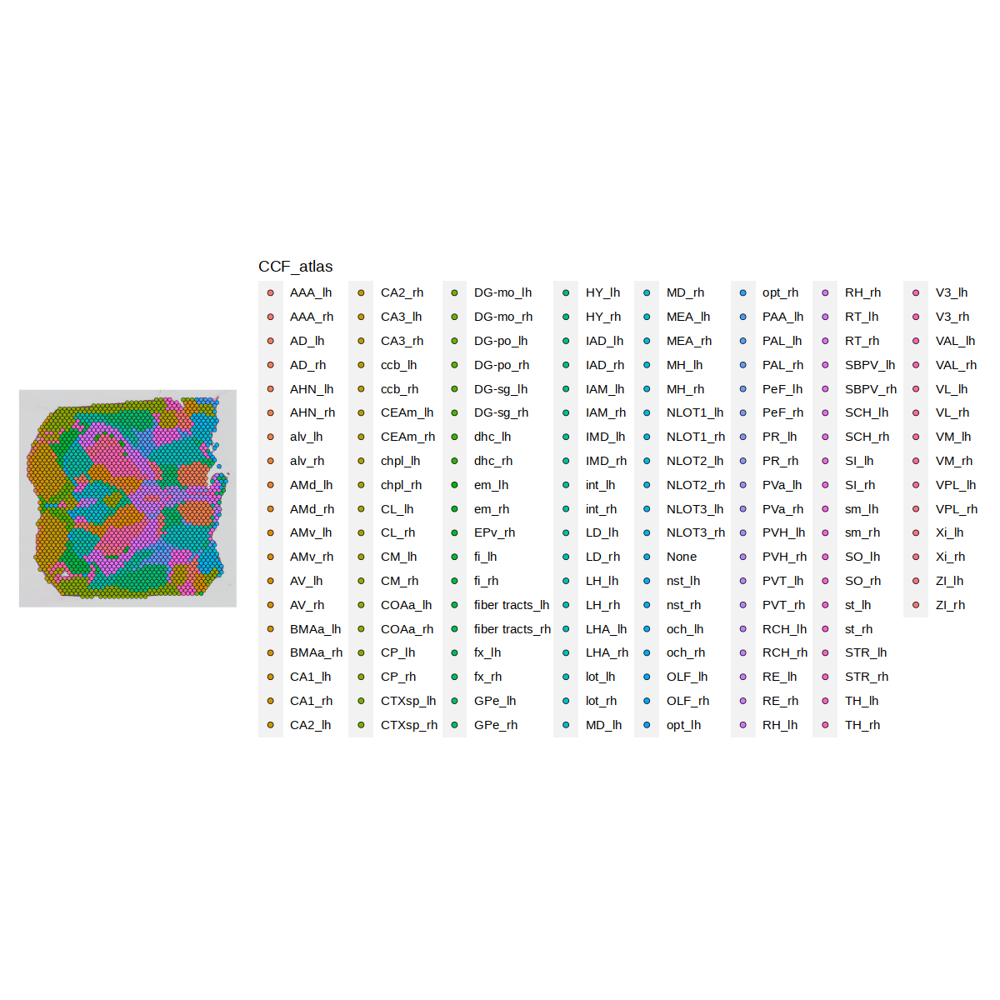

In [58]:
SpatialPlot(SUB_con_rostral3,group.by='CCF_atlas')

## SUB_con_caudal1

In [203]:
SUB_con_caudal1$CCF_atlas <- NULL
SUB_con_caudal1$PL_activation <- NULL
SUB_con_caudal1$Sub_activation <- NULL
SUB_con_caudal1$thalamus <- NULL
SUB_con_caudal1$`SCT_snn_res.1` <- NULL
SUB_con_caudal1$seurat_clusters <- NULL
SUB_con_caudal1$thalamus_combined <- NULL
SUB_con_caudal1$result <- NULL
SUB_con_caudal1$th <- NULL
SUB_con_caudal1$result2 <- NULL
SUB_con_caudal1$th2 <- NULL

ERROR: Error: Cannot find object Sub_activation


In [204]:
SUB_con_caudal1@meta.data

,orig.ident,nCount_Spatial,nFeature_Spatial,sample,case,nCount_SCT,nFeature_SCT,design,position
,<fct>,<dbl>,<int>,<chr>,<chr>,<dbl>,<int>,<chr>,<chr>
AAACAAGTATCTCCCA-1,SeuratProject,32435,6931,SUB_con_caudal1,SUB,20961,6450,control,caudal
AAACAATCTACTAGCA-1,SeuratProject,26299,5986,SUB_con_caudal1,SUB,21055,5959,control,caudal
AAACACCAATAACTGC-1,SeuratProject,46065,7782,SUB_con_caudal1,SUB,20598,5741,control,caudal
AAACAGAGCGACTCCT-1,SeuratProject,10599,3912,SUB_con_caudal1,SUB,18992,4276,control,caudal
AAACATTTCCCGGATT-1,SeuratProject,23417,5932,SUB_con_caudal1,SUB,21034,5931,control,caudal
AAACCGGGTAGGTACC-1,SeuratProject,42354,7452,SUB_con_caudal1,SUB,20750,5808,control,caudal
AAACCGTTCGTCCAGG-1,SeuratProject,39999,7522,SUB_con_caudal1,SUB,20757,6077,control,caudal
AAACCTAAGCAGCCGG-1,SeuratProject,44351,7326,SUB_con_caudal1,SUB,20621,5464,control,caudal
AAACCTCATGAAGTTG-1,SeuratProject,33644,6713,SUB_con_caudal1,SUB,20977,6008,control,caudal


In [205]:
meta <- read.csv('/date/home/wanglab33/02Thalamus/save_10x_info_624/190_SUBcon_10X/Image_09_con_5.csv',
                 row.names=1)

In [206]:
meta_ <- meta[meta$in_tissue == 1,]
meta_ <- meta_[,c('CCF_atlas','ofmri_activation','ofmri_10x_activation')]

In [207]:
SUB_con_caudal1

An object of class Seurat 
50724 features across 3575 samples within 2 assays 
Active assay: SCT (18431 features, 3000 variable features)
 1 other assay present: Spatial
 1 dimensional reduction calculated: pca
 1 image present: slice1

In [208]:
dim(meta_)

[1] 3575    3

In [209]:
SUB_con_caudal1 <- AddMetaData(SUB_con_caudal1,meta_)

In [210]:
SUB_con_caudal1$thalamus <- 'others'
SUB_con_caudal1$thalamus[SUB_con_caudal1$CCF_atlas %in% tha$ACR_name] <- 'thalamus'

## SUB_con_caudal2

In [211]:
SUB_con_caudal2$CCF_atlas <- NULL
SUB_con_caudal2$PL_activation <- NULL
SUB_con_caudal2$Sub_activation <- NULL
SUB_con_caudal2$thalamus <- NULL
SUB_con_caudal2$`SCT_snn_res.1` <- NULL
SUB_con_caudal2$seurat_clusters <- NULL
SUB_con_caudal2$thalamus_combined <- NULL
SUB_con_caudal2$result <- NULL
SUB_con_caudal2$th <- NULL
SUB_con_caudal2$result2 <- NULL
SUB_con_caudal2$th2 <- NULL

In [351]:
SUB_con_caudal2@meta.data

,orig.ident,nCount_Spatial,nFeature_Spatial,sample,case,nCount_SCT,nFeature_SCT,design,position,CCF_atlas,ofmri_activation,ofmri_10x_activation,thalamus
,<fct>,<dbl>,<int>,<chr>,<chr>,<dbl>,<int>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<chr>
AAACAAGTATCTCCCA-1,SeuratProject,32824,7099,SUB_con_caudal2,SUB,22887,6839,control,caudal,BMAp_rh,-0.14366952,-0.251567500,others
AAACAATCTACTAGCA-1,SeuratProject,44594,8043,SUB_con_caudal2,SUB,22844,6525,control,caudal,DG-po_lh,0.06349768,0.131747980,others
AAACAGAGCGACTCCT-1,SeuratProject,9042,3105,SUB_con_caudal2,SUB,20143,4054,control,caudal,MB_lh,0.17664966,0.062105015,others
AAACCCGAACGAAATC-1,SeuratProject,11963,3781,SUB_con_caudal2,SUB,20495,4111,control,caudal,COApm_rh,-0.08093378,0.258705620,others
AAACCGGGTAGGTACC-1,SeuratProject,23985,5630,SUB_con_caudal2,SUB,22696,5630,control,caudal,CA1_rh,-0.28931427,-0.062231930,others
AAACCGTTCGTCCAGG-1,SeuratProject,18386,4890,SUB_con_caudal2,SUB,20743,4890,control,caudal,CA3_rh,-0.12692547,-0.022387646,others
AAACCTCATGAAGTTG-1,SeuratProject,39275,7531,SUB_con_caudal2,SUB,22770,6563,control,caudal,SSp-tr6a_rh,-0.29875687,-0.020669278,others
AAACGAAGAACATACC-1,SeuratProject,20573,5589,SUB_con_caudal2,SUB,21125,5587,control,caudal,PO_lh,-0.01783048,0.042962573,others
AAACGAGACGGTTGAT-1,SeuratProject,11639,4152,SUB_con_caudal2,SUB,20673,4522,control,caudal,ml_rh,-0.01524721,-0.156013680,others


In [339]:
meta <- read.csv('/date/home/wanglab33/02Thalamus/save_10x_info_624/190_SUBcon_10X/Image_08_con_6.csv',
                 row.names=1)

In [347]:
meta_ <- meta[meta$in_tissue == 1,]
meta_ <- meta_[,c('CCF_atlas','ofmri_activation','ofmri_10x_activation')]

In [345]:
rownames(meta) <- meta$barcode

In [346]:
head(meta)

,Unnamed..0,barcode,in_tissue,array_row,array_col,pxl_row_in_fullres,pxl_col_in_fullres,CCF_atlas,ofmri_activation,ofmri_10x_activation,CCF_atlas_index,allen,X10x_img
,<int>,<chr>,<int>,<int>,<int>,<int>,<int>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<int>
ACGCCTGACACGCGCT-1,0,ACGCCTGACACGCGCT-1,0,0,0,1094,1987,None,2.725049e-08,-5.534564e-09,0,0.0000,216
TACCGATCCAACACTT-1,1,TACCGATCCAACACTT-1,0,1,1,1230,2065,None,1.415614e-06,-6.700308e-07,0,0.0000,215
ATTAAAGCGGACGAGC-1,2,ATTAAAGCGGACGAGC-1,0,0,2,1094,2143,None,-1.262661e-05,3.389924e-06,0,0.0000,215
GATAAGGGACGATTAG-1,3,GATAAGGGACGATTAG-1,0,1,3,1230,2221,None,-5.933295e-03,2.834743e-03,0,0.0000,217
GTGCAAATCACCAATA-1,4,GTGCAAATCACCAATA-1,0,0,4,1094,2299,VISa1_lh,-5.217378e-03,-1.764460e-03,347,180.2137,215
TGTTGGCTGGCGGAAG-1,5,TGTTGGCTGGCGGAAG-1,0,1,5,1230,2376,VISa1_lh,-2.975061e-02,-3.903606e-03,347,198.6339,218


In [348]:
SUB_con_caudal2

An object of class Seurat 
50705 features across 2945 samples within 2 assays 
Active assay: SCT (18412 features, 3000 variable features)
 1 other assay present: Spatial
 1 dimensional reduction calculated: pca
 1 image present: slice1

In [349]:
dim(meta_)

[1] 2945    3

In [350]:
SUB_con_caudal2 <- AddMetaData(SUB_con_caudal2,meta_)

In [352]:
SUB_con_caudal2$thalamus <- 'others'
SUB_con_caudal2$thalamus[SUB_con_caudal2$CCF_atlas %in% tha$ACR_name] <- 'thalamus'

## SUB_con_caudal3

In [221]:
#SUB_con_caudal3$CCF_atlas <- NULL
#SUB_con_caudal3$PL_activation <- NULL
SUB_con_caudal3$Sub_activation <- NULL
SUB_con_caudal3$thalamus <- NULL
SUB_con_caudal3$`SCT_snn_res.1` <- NULL
SUB_con_caudal3$seurat_clusters <- NULL
SUB_con_caudal3$thalamus_combined <- NULL
SUB_con_caudal3$result <- NULL
SUB_con_caudal3$th <- NULL
SUB_con_caudal3$result2 <- NULL
SUB_con_caudal3$th2 <- NULL

ERROR: Error: Cannot find object result


In [222]:
SUB_con_caudal3@meta.data

,orig.ident,nCount_Spatial,nFeature_Spatial,sample,case,nCount_SCT,nFeature_SCT,design,position
,<fct>,<dbl>,<int>,<chr>,<chr>,<dbl>,<int>,<chr>,<chr>
AAACAACGAATAGTTC-1,SeuratProject,16819,4674,SUB_con_caudal3,SUB,14416,4671,control,caudal
AAACAATCTACTAGCA-1,SeuratProject,4917,2331,SUB_con_caudal3,SUB,11714,2946,control,caudal
AAACACCAATAACTGC-1,SeuratProject,13352,4460,SUB_con_caudal3,SUB,13351,4459,control,caudal
AAACAGCTTTCAGAAG-1,SeuratProject,26717,6366,SUB_con_caudal3,SUB,14366,4965,control,caudal
AAACAGGGTCTATATT-1,SeuratProject,16774,5056,SUB_con_caudal3,SUB,14446,5050,control,caudal
AAACCGGGTAGGTACC-1,SeuratProject,14502,4755,SUB_con_caudal3,SUB,14002,4753,control,caudal
AAACCGTTCGTCCAGG-1,SeuratProject,12414,3942,SUB_con_caudal3,SUB,12816,3941,control,caudal
AAACCTAAGCAGCCGG-1,SeuratProject,34525,7404,SUB_con_caudal3,SUB,13770,4812,control,caudal
AAACCTCATGAAGTTG-1,SeuratProject,39265,8198,SUB_con_caudal3,SUB,13643,5098,control,caudal


In [223]:
meta <- read.csv('/date/home/wanglab33/02Thalamus/save_10x_info_624/194_SUBcon_10X/Image_07_con_11.csv',
                 row.names=1)

In [224]:
meta_ <- meta[meta$in_tissue == 1,]
meta_ <- meta_[,c('CCF_atlas','ofmri_activation','ofmri_10x_activation')]

In [225]:
SUB_con_caudal3

An object of class Seurat 
50080 features across 2944 samples within 2 assays 
Active assay: SCT (17787 features, 3000 variable features)
 1 other assay present: Spatial
 1 dimensional reduction calculated: pca
 1 image present: slice1

In [226]:
dim(meta_)

[1] 2944    3

In [227]:
SUB_con_caudal3 <- AddMetaData(SUB_con_caudal3,meta_)

In [228]:
SUB_con_caudal3$thalamus <- 'others'
SUB_con_caudal3$thalamus[SUB_con_caudal3$CCF_atlas %in% tha$ACR_name] <- 'thalamus'

## SUB_test_rostral1

In [231]:
#SUB_test_rostral1$CCF_atlas <- NULL
#SUB_test_rostral1$PL_activation <- NULL
SUB_test_rostral1$Sub_activation <- NULL
SUB_test_rostral1$thalamus <- NULL
SUB_test_rostral1$`SCT_snn_res.1` <- NULL
SUB_test_rostral1$seurat_clusters <- NULL
SUB_test_rostral1$thalamus_combined <- NULL
SUB_test_rostral1$result <- NULL
SUB_test_rostral1$th <- NULL
SUB_test_rostral1$result2 <- NULL
SUB_test_rostral1$th2 <- NULL

ERROR: Error: Cannot find object result2


In [232]:
SUB_test_rostral1@meta.data

,orig.ident,nCount_Spatial,nFeature_Spatial,sample,case,nCount_SCT,nFeature_SCT,design,position
,<fct>,<dbl>,<int>,<chr>,<chr>,<dbl>,<int>,<chr>,<chr>
AAACAAGTATCTCCCA-1,SeuratProject,25228,6017,SUB_test_rostral1,SUB,19774,5984,test,rostral
AAACAATCTACTAGCA-1,SeuratProject,13344,4301,SUB_test_rostral1,SUB,17540,4327,test,rostral
AAACACCAATAACTGC-1,SeuratProject,43716,7731,SUB_test_rostral1,SUB,19561,5714,test,rostral
AAACAGAGCGACTCCT-1,SeuratProject,20461,5583,SUB_test_rostral1,SUB,19465,5581,test,rostral
AAACCACTACACAGAT-1,SeuratProject,28912,6334,SUB_test_rostral1,SUB,19702,6045,test,rostral
AAACCCGAACGAAATC-1,SeuratProject,35941,6864,SUB_test_rostral1,SUB,19707,5530,test,rostral
AAACCGGGTAGGTACC-1,SeuratProject,17720,4919,SUB_test_rostral1,SUB,18132,4918,test,rostral
AAACCGTTCGTCCAGG-1,SeuratProject,27644,6408,SUB_test_rostral1,SUB,19721,6189,test,rostral
AAACCTCATGAAGTTG-1,SeuratProject,27101,6369,SUB_test_rostral1,SUB,19674,6208,test,rostral


In [233]:
meta <- read.csv('/date/home/wanglab33/02Thalamus/save_10x_info_624/191_SUBtest_10X/Image_03_test_7.csv',
                 row.names=1)

In [234]:
meta_ <- meta[meta$in_tissue == 1,]
meta_ <- meta_[,c('CCF_atlas','ofmri_activation','ofmri_10x_activation')]

In [235]:
SUB_test_rostral1

An object of class Seurat 
50657 features across 3199 samples within 2 assays 
Active assay: SCT (18364 features, 3000 variable features)
 1 other assay present: Spatial
 1 dimensional reduction calculated: pca
 1 image present: slice1

In [236]:
dim(meta_)

[1] 3199    3

In [237]:
SUB_test_rostral1 <- AddMetaData(SUB_test_rostral1,meta_)

In [238]:
SUB_test_rostral1$thalamus <- 'others'
SUB_test_rostral1$thalamus[SUB_test_rostral1$CCF_atlas %in% tha$ACR_name] <- 'thalamus'

## SUB_test_rostral2

In [239]:
SUB_test_rostral2$CCF_atlas <- NULL
SUB_test_rostral2$Sub_activation <- NULL
SUB_test_rostral2$thalamus <- NULL
SUB_test_rostral2$`SCT_snn_res.1` <- NULL
SUB_test_rostral2$seurat_clusters <- NULL
SUB_test_rostral2$thalamus_combined <- NULL
SUB_test_rostral2$result <- NULL
SUB_test_rostral2$th <- NULL
SUB_test_rostral2$result2 <- NULL
SUB_test_rostral2$th2 <- NULL
SUB_test_rostral2$PL_activation <- NULL

ERROR: Error: Cannot find object result


In [240]:
SUB_test_rostral2@meta.data

,orig.ident,nCount_Spatial,nFeature_Spatial,sample,case,nCount_SCT,nFeature_SCT,design,position
,<fct>,<dbl>,<int>,<chr>,<chr>,<dbl>,<int>,<chr>,<chr>
AAACAAGTATCTCCCA-1,SeuratProject,10203,3541,SUB_test_rostral2,SUB,20124,4035,test,rostral
AAACAGAGCGACTCCT-1,SeuratProject,7576,3156,SUB_test_rostral2,SUB,19259,4329,test,rostral
AAACATTTCCCGGATT-1,SeuratProject,37886,7208,SUB_test_rostral2,SUB,22891,6415,test,rostral
AAACCCGAACGAAATC-1,SeuratProject,38569,7350,SUB_test_rostral2,SUB,22936,6480,test,rostral
AAACCGGAAATGTTAA-1,SeuratProject,23650,6016,SUB_test_rostral2,SUB,22444,6013,test,rostral
AAACCTAAGCAGCCGG-1,SeuratProject,30623,6651,SUB_test_rostral2,SUB,22846,6478,test,rostral
AAACGAGACGGTTGAT-1,SeuratProject,43988,7929,SUB_test_rostral2,SUB,23160,6484,test,rostral
AAACGCTGGGCACGAC-1,SeuratProject,40670,7689,SUB_test_rostral2,SUB,22980,6601,test,rostral
AAACGGGCGTACGGGT-1,SeuratProject,17084,4697,SUB_test_rostral2,SUB,20262,4697,test,rostral


In [241]:
meta <- read.csv('/date/home/wanglab33/02Thalamus/save_10x_info_624/191_SUBtest_10X/Image_02_test_8.csv',
                 row.names=1)

In [242]:
meta_ <- meta[meta$in_tissue == 1,]
meta_ <- meta_[,c('CCF_atlas','ofmri_activation','ofmri_10x_activation')]

In [243]:
SUB_test_rostral2

An object of class Seurat 
50500 features across 2478 samples within 2 assays 
Active assay: SCT (18207 features, 3000 variable features)
 1 other assay present: Spatial
 1 dimensional reduction calculated: pca
 1 image present: slice1

In [244]:
dim(meta_)

[1] 2478    3

In [245]:
SUB_test_rostral2 <- AddMetaData(SUB_test_rostral2,meta_)

In [246]:
SUB_test_rostral2$thalamus <- 'others'
SUB_test_rostral2$thalamus[SUB_test_rostral2$CCF_atlas %in% tha$ACR_name] <- 'thalamus'

## SUB_test_rostral3

In [247]:
SUB_test_rostral3$CCF_atlas <- NULL
SUB_test_rostral3$Sub_activation <- NULL
SUB_test_rostral3$thalamus <- NULL
SUB_test_rostral3$`SCT_snn_res.1` <- NULL
SUB_test_rostral3$seurat_clusters <- NULL
SUB_test_rostral3$thalamus_combined <- NULL
SUB_test_rostral3$result <- NULL
SUB_test_rostral3$th <- NULL
SUB_test_rostral3$result2 <- NULL
SUB_test_rostral3$th2 <- NULL
SUB_test_rostral3$PL_activation <- NULL

ERROR: Error: Cannot find object result


In [248]:
SUB_test_rostral3@meta.data

,orig.ident,nCount_Spatial,nFeature_Spatial,sample,case,nCount_SCT,nFeature_SCT,design,position
,<fct>,<dbl>,<int>,<chr>,<chr>,<dbl>,<int>,<chr>,<chr>
AAACAAGTATCTCCCA-1,SeuratProject,69368,8708,SUB_test_rostral3,SUB,21454,5008,test,rostral
AAACACCAATAACTGC-1,SeuratProject,22119,5852,SUB_test_rostral3,SUB,20103,5850,test,rostral
AAACAGAGCGACTCCT-1,SeuratProject,29378,7154,SUB_test_rostral3,SUB,20404,6971,test,rostral
AAACAGCTTTCAGAAG-1,SeuratProject,20640,5602,SUB_test_rostral3,SUB,19775,5599,test,rostral
AAACAGGGTCTATATT-1,SeuratProject,18849,5377,SUB_test_rostral3,SUB,18850,5376,test,rostral
AAACATTTCCCGGATT-1,SeuratProject,31085,7071,SUB_test_rostral3,SUB,20538,6739,test,rostral
AAACCGGGTAGGTACC-1,SeuratProject,49961,7781,SUB_test_rostral3,SUB,20753,5376,test,rostral
AAACCGTTCGTCCAGG-1,SeuratProject,16564,4750,SUB_test_rostral3,SUB,17879,4749,test,rostral
AAACCTAAGCAGCCGG-1,SeuratProject,35532,8001,SUB_test_rostral3,SUB,20959,7213,test,rostral


In [249]:
meta <- read.csv('/date/home/wanglab33/02Thalamus/save_10x_info_624/193_SUBtest_10X/Image_10_test_17.csv',
                 row.names=1)

In [250]:
meta_ <- meta[meta$in_tissue == 1,]
meta_ <- meta_[,c('CCF_atlas','ofmri_activation','ofmri_10x_activation')]

In [251]:
SUB_test_rostral3

An object of class Seurat 
50717 features across 3167 samples within 2 assays 
Active assay: SCT (18424 features, 3000 variable features)
 1 other assay present: Spatial
 1 dimensional reduction calculated: pca
 1 image present: slice1

In [252]:
dim(meta_)

[1] 3167    3

In [253]:
SUB_test_rostral3 <- AddMetaData(SUB_test_rostral3,meta_)

In [254]:
SUB_test_rostral3$thalamus <- 'others'
SUB_test_rostral3$thalamus[SUB_test_rostral3$CCF_atlas %in% tha$ACR_name] <- 'thalamus'

## SUB_test_rostral4

In [255]:
SUB_test_rostral4$CCF_atlas <- NULL
SUB_test_rostral4$Sub_activation <- NULL
SUB_test_rostral4$thalamus <- NULL
SUB_test_rostral4$`SCT_snn_res.1` <- NULL
SUB_test_rostral4$seurat_clusters <- NULL
SUB_test_rostral4$thalamus_combined <- NULL
SUB_test_rostral4$result <- NULL
SUB_test_rostral4$th <- NULL
SUB_test_rostral4$result2 <- NULL
SUB_test_rostral4$th2 <- NULL
SUB_test_rostral4$PL_activation <- NULL

ERROR: Error: Cannot find object result


In [256]:
SUB_test_rostral4@meta.data

,orig.ident,nCount_Spatial,nFeature_Spatial,sample,case,nCount_SCT,nFeature_SCT,design,position
,<fct>,<dbl>,<int>,<chr>,<chr>,<dbl>,<int>,<chr>,<chr>
AAACAAGTATCTCCCA-1,SeuratProject,53488,8238,SUB_test_rostral4,SUB,18526,4690,test,rostral
AAACACCAATAACTGC-1,SeuratProject,21026,5718,SUB_test_rostral4,SUB,18688,5715,test,rostral
AAACAGAGCGACTCCT-1,SeuratProject,34039,7366,SUB_test_rostral4,SUB,18921,6288,test,rostral
AAACAGCTTTCAGAAG-1,SeuratProject,24570,6056,SUB_test_rostral4,SUB,18868,5984,test,rostral
AAACAGGGTCTATATT-1,SeuratProject,19561,5556,SUB_test_rostral4,SUB,18435,5556,test,rostral
AAACATTTCCCGGATT-1,SeuratProject,29674,6789,SUB_test_rostral4,SUB,18957,6330,test,rostral
AAACCGGGTAGGTACC-1,SeuratProject,54763,7975,SUB_test_rostral4,SUB,18640,5082,test,rostral
AAACCGTTCGTCCAGG-1,SeuratProject,21083,5727,SUB_test_rostral4,SUB,18698,5723,test,rostral
AAACCTAAGCAGCCGG-1,SeuratProject,47839,8655,SUB_test_rostral4,SUB,18801,5855,test,rostral


In [257]:
meta <- read.csv('/date/home/wanglab33/02Thalamus/save_10x_info_624/193_SUBtest_10X/Image_08_test_18.csv',
                 row.names=1)

In [258]:
meta_ <- meta[meta$in_tissue == 1,]
meta_ <- meta_[,c('CCF_atlas','ofmri_activation','ofmri_10x_activation')]

In [259]:
SUB_test_rostral4

An object of class Seurat 
50480 features across 3153 samples within 2 assays 
Active assay: SCT (18187 features, 3000 variable features)
 1 other assay present: Spatial
 1 dimensional reduction calculated: pca
 1 image present: slice1

In [260]:
dim(meta_)

[1] 3153    3

In [261]:
SUB_test_rostral4 <- AddMetaData(SUB_test_rostral4,meta_)

In [262]:
SUB_test_rostral4$thalamus <- 'others'
SUB_test_rostral4$thalamus[SUB_test_rostral4$CCF_atlas %in% tha$ACR_name] <- 'thalamus'

## SUB_test_caudal1

In [263]:
SUB_test_caudal1$CCF_atlas <- NULL
SUB_test_caudal1$Sub_activation <- NULL
SUB_test_caudal1$thalamus <- NULL
SUB_test_caudal1$`SCT_snn_res.1` <- NULL
SUB_test_caudal1$seurat_clusters <- NULL
SUB_test_caudal1$thalamus_combined <- NULL
SUB_test_caudal1$result <- NULL
SUB_test_caudal1$th <- NULL
SUB_test_caudal1$result2 <- NULL
SUB_test_caudal1$th2 <- NULL
SUB_test_caudal1$PL_activation <- NULL

ERROR: Error: Cannot find object result


In [264]:
SUB_test_caudal1@meta.data

,orig.ident,nCount_Spatial,nFeature_Spatial,sample,case,nCount_SCT,nFeature_SCT,design,position
,<fct>,<dbl>,<int>,<chr>,<chr>,<dbl>,<int>,<chr>,<chr>
AAACAAGTATCTCCCA-1,SeuratProject,15122,4213,SUB_test_caudal1,SUB,15969,4211,test,caudal
AAACAATCTACTAGCA-1,SeuratProject,43563,7605,SUB_test_caudal1,SUB,18195,5333,test,caudal
AAACACCAATAACTGC-1,SeuratProject,23068,5815,SUB_test_caudal1,SUB,18200,5751,test,caudal
AAACAGAGCGACTCCT-1,SeuratProject,5720,2363,SUB_test_caudal1,SUB,14409,3331,test,caudal
AAACAGGGTCTATATT-1,SeuratProject,17906,5009,SUB_test_caudal1,SUB,17393,5006,test,caudal
AAACAGTGTTCCTGGG-1,SeuratProject,60395,8354,SUB_test_caudal1,SUB,18164,5184,test,caudal
AAACATTTCCCGGATT-1,SeuratProject,15220,4532,SUB_test_caudal1,SUB,15967,4532,test,caudal
AAACCACTACACAGAT-1,SeuratProject,32922,6757,SUB_test_caudal1,SUB,18355,5489,test,caudal
AAACCCGAACGAAATC-1,SeuratProject,39430,7046,SUB_test_caudal1,SUB,18161,5026,test,caudal


In [265]:
meta <- read.csv('/date/home/wanglab33/02Thalamus/save_10x_info_624/191_SUBtest_10X/Image_05_test_5.csv',
                 row.names=1)

In [266]:
meta_ <- meta[meta$in_tissue == 1,]
meta_ <- meta_[,c('CCF_atlas','ofmri_activation','ofmri_10x_activation')]

In [267]:
SUB_test_caudal1

An object of class Seurat 
51043 features across 3943 samples within 2 assays 
Active assay: SCT (18750 features, 3000 variable features)
 1 other assay present: Spatial
 1 dimensional reduction calculated: pca
 1 image present: slice1

In [268]:
dim(meta_)

[1] 3943    3

In [269]:
SUB_test_caudal1 <- AddMetaData(SUB_test_caudal1,meta_)

In [270]:
SUB_test_caudal1$thalamus <- 'others'
SUB_test_caudal1$thalamus[SUB_test_caudal1$CCF_atlas %in% tha$ACR_name] <- 'thalamus'

## SUB_test_caudal2

In [271]:
SUB_test_caudal2$CCF_atlas <- NULL
SUB_test_caudal2$Sub_activation <- NULL
SUB_test_caudal2$thalamus <- NULL
SUB_test_caudal2$`SCT_snn_res.1` <- NULL
SUB_test_caudal2$seurat_clusters <- NULL
SUB_test_caudal2$thalamus_combined <- NULL
SUB_test_caudal2$result <- NULL
SUB_test_caudal2$th <- NULL
SUB_test_caudal2$result2 <- NULL
SUB_test_caudal2$th2 <- NULL
SUB_test_caudal2$PL_activation <- NULL

ERROR: Error: Cannot find object result


In [272]:
SUB_test_caudal2@meta.data

,orig.ident,nCount_Spatial,nFeature_Spatial,sample,case,nCount_SCT,nFeature_SCT,design,position
,<fct>,<dbl>,<int>,<chr>,<chr>,<dbl>,<int>,<chr>,<chr>
AAACAAGTATCTCCCA-1,SeuratProject,14095,4405,SUB_test_caudal2,SUB,14815,4403,test,caudal
AAACAATCTACTAGCA-1,SeuratProject,37947,7296,SUB_test_caudal2,SUB,16541,5541,test,caudal
AAACACCAATAACTGC-1,SeuratProject,12676,4117,SUB_test_caudal2,SUB,14502,4116,test,caudal
AAACAGAGCGACTCCT-1,SeuratProject,39529,7319,SUB_test_caudal2,SUB,16584,5172,test,caudal
AAACAGCTTTCAGAAG-1,SeuratProject,25158,6151,SUB_test_caudal2,SUB,16775,5871,test,caudal
AAACAGGGTCTATATT-1,SeuratProject,15262,4687,SUB_test_caudal2,SUB,15308,4687,test,caudal
AAACAGTGTTCCTGGG-1,SeuratProject,22359,5870,SUB_test_caudal2,SUB,16678,5776,test,caudal
AAACATTTCCCGGATT-1,SeuratProject,24429,5934,SUB_test_caudal2,SUB,16797,5684,test,caudal
AAACCACTACACAGAT-1,SeuratProject,23892,5538,SUB_test_caudal2,SUB,16839,5302,test,caudal


In [273]:
meta <- read.csv('/date/home/wanglab33/02Thalamus/save_10x_info_624/191_SUBtest_10X/Image_04_test_6.csv',
                 row.names=1)

In [274]:
meta_ <- meta[meta$in_tissue == 1,]
meta_ <- meta_[,c('CCF_atlas','ofmri_activation','ofmri_10x_activation')]

In [275]:
SUB_test_caudal2

An object of class Seurat 
51036 features across 4173 samples within 2 assays 
Active assay: SCT (18743 features, 3000 variable features)
 1 other assay present: Spatial
 1 dimensional reduction calculated: pca
 1 image present: slice1

In [276]:
dim(meta_)

[1] 4173    3

In [277]:
SUB_test_caudal2 <- AddMetaData(SUB_test_caudal2,meta_)

In [278]:
SUB_test_caudal2$thalamus <- 'others'
SUB_test_caudal2$thalamus[SUB_test_caudal2$CCF_atlas %in% tha$ACR_name] <- 'thalamus'

## SUB_test_caudal3

In [279]:
SUB_test_caudal3$CCF_atlas <- NULL
SUB_test_caudal3$Sub_activation <- NULL
SUB_test_caudal3$thalamus <- NULL
SUB_test_caudal3$`SCT_snn_res.1` <- NULL
SUB_test_caudal3$seurat_clusters <- NULL
SUB_test_caudal3$thalamus_combined <- NULL
SUB_test_caudal3$result <- NULL
SUB_test_caudal3$th <- NULL
SUB_test_caudal3$result2 <- NULL
SUB_test_caudal3$th2 <- NULL
SUB_test_caudal3$PL_activation <- NULL

ERROR: Error: Cannot find object result


In [280]:
SUB_test_caudal3@meta.data

,orig.ident,nCount_Spatial,nFeature_Spatial,sample,case,nCount_SCT,nFeature_SCT,design,position
,<fct>,<dbl>,<int>,<chr>,<chr>,<dbl>,<int>,<chr>,<chr>
AAACAATCTACTAGCA-1,SeuratProject,9897,3756,SUB_test_caudal3,SUB,9914,3753,test,caudal
AAACACCAATAACTGC-1,SeuratProject,24073,6368,SUB_test_caudal3,SUB,11113,4627,test,caudal
AAACAGTGTTCCTGGG-1,SeuratProject,1442,938,SUB_test_caudal3,SUB,7773,2541,test,caudal
AAACATTTCCCGGATT-1,SeuratProject,18649,5045,SUB_test_caudal3,SUB,11434,4445,test,caudal
AAACCGGGTAGGTACC-1,SeuratProject,6289,2716,SUB_test_caudal3,SUB,8900,2761,test,caudal
AAACCGTTCGTCCAGG-1,SeuratProject,10018,3304,SUB_test_caudal3,SUB,10027,3303,test,caudal
AAACCTAAGCAGCCGG-1,SeuratProject,22845,5809,SUB_test_caudal3,SUB,11217,4257,test,caudal
AAACCTCATGAAGTTG-1,SeuratProject,28396,6768,SUB_test_caudal3,SUB,10917,4225,test,caudal
AAACGAAGAACATACC-1,SeuratProject,746,484,SUB_test_caudal3,SUB,7579,2738,test,caudal


In [281]:
meta <- read.csv('/date/home/wanglab33/02Thalamus/save_10x_info_624/193_SUBtest_10X/Image_12_test_15.csv',
                 row.names=1)

In [282]:
meta_ <- meta[meta$in_tissue == 1,]
meta_ <- meta_[,c('CCF_atlas','ofmri_activation','ofmri_10x_activation')]

In [283]:
SUB_test_caudal3

An object of class Seurat 
49765 features across 2977 samples within 2 assays 
Active assay: SCT (17472 features, 3000 variable features)
 1 other assay present: Spatial
 1 dimensional reduction calculated: pca
 1 image present: slice1

In [284]:
dim(meta_)

[1] 2977    3

In [285]:
SUB_test_caudal3 <- AddMetaData(SUB_test_caudal3,meta_)

In [286]:
SUB_test_caudal3$thalamus <- 'others'
SUB_test_caudal3$thalamus[SUB_test_caudal3$CCF_atlas %in% tha$ACR_name] <- 'thalamus'

## SUB_test_caudal4

In [287]:
SUB_test_caudal4$CCF_atlas <- NULL
SUB_test_caudal4$Sub_activation <- NULL
SUB_test_caudal4$thalamus <- NULL
SUB_test_caudal4$`SCT_snn_res.1` <- NULL
SUB_test_caudal4$seurat_clusters <- NULL
SUB_test_caudal4$thalamus_combined <- NULL
SUB_test_caudal4$result <- NULL
SUB_test_caudal4$th <- NULL
SUB_test_caudal4$result2 <- NULL
SUB_test_caudal4$th2 <- NULL
SUB_test_caudal4$PL_activation <- NULL

ERROR: Error: Cannot find object result


In [288]:
SUB_test_caudal4@meta.data

,orig.ident,nCount_Spatial,nFeature_Spatial,sample,case,nCount_SCT,nFeature_SCT,design,position
,<fct>,<dbl>,<int>,<chr>,<chr>,<dbl>,<int>,<chr>,<chr>
AAACAATCTACTAGCA-1,SeuratProject,21800,4771,SUB_test_caudal4,SUB,14246,4169,test,caudal
AAACACCAATAACTGC-1,SeuratProject,30906,6843,SUB_test_caudal4,SUB,13782,4764,test,caudal
AAACAGCTTTCAGAAG-1,SeuratProject,9180,3672,SUB_test_caudal4,SUB,12114,3701,test,caudal
AAACAGGGTCTATATT-1,SeuratProject,36101,7218,SUB_test_caudal4,SUB,13481,4636,test,caudal
AAACAGTGTTCCTGGG-1,SeuratProject,3778,1697,SUB_test_caudal4,SUB,11289,2877,test,caudal
AAACATGGTGAGAGGA-1,SeuratProject,15909,4957,SUB_test_caudal4,SUB,14153,4954,test,caudal
AAACCGGGTAGGTACC-1,SeuratProject,18051,5549,SUB_test_caudal4,SUB,14308,5522,test,caudal
AAACCGTTCGTCCAGG-1,SeuratProject,13402,4466,SUB_test_caudal4,SUB,13374,4465,test,caudal
AAACCTAAGCAGCCGG-1,SeuratProject,44096,7728,SUB_test_caudal4,SUB,13734,4464,test,caudal


In [289]:
meta <- read.csv('/date/home/wanglab33/02Thalamus/save_10x_info_624/193_SUBtest_10X/Image_11_test_16.csv',
                 row.names=1)

In [290]:
meta_ <- meta[meta$in_tissue == 1,]
meta_ <- meta_[,c('CCF_atlas','ofmri_activation','ofmri_10x_activation')]

In [291]:
SUB_test_caudal4

An object of class Seurat 
50410 features across 3555 samples within 2 assays 
Active assay: SCT (18117 features, 3000 variable features)
 1 other assay present: Spatial
 1 dimensional reduction calculated: pca
 1 image present: slice1

In [292]:
dim(meta_)

[1] 3555    3

In [293]:
SUB_test_caudal4 <- AddMetaData(SUB_test_caudal4,meta_)

In [294]:
SUB_test_caudal4$thalamus <- 'others'
SUB_test_caudal4$thalamus[SUB_test_caudal4$CCF_atlas %in% tha$ACR_name] <- 'thalamus'

# save slices

In [358]:
save(PrL_con_rostral1,PrL_con_rostral2,PrL_con_rostral3,PrL_con_rostral4,
     PrL_con_caudal1,PrL_con_caudal2,PrL_con_caudal3,PrL_con_caudal4,
     PrL_test_rostral1,PrL_test_rostral2,PrL_test_rostral3,PrL_test_rostral4,PrL_test_rostral5,
     PrL_test_caudal1,PrL_test_caudal2,PrL_test_caudal3,PrL_test_caudal4,PrL_test_caudal5,
     SUB_con_rostral1,SUB_con_rostral2,SUB_con_rostral3,SUB_con_caudal1,SUB_con_caudal2,SUB_con_caudal3,
     SUB_test_rostral1,SUB_test_rostral2,SUB_test_rostral3,SUB_test_rostral4,
     SUB_test_caudal1,SUB_test_caudal2,SUB_test_caudal3,SUB_test_caudal4,file='../folder/total32_reg20240630.RDA')

# subset thalamus

In [355]:
Idents(PrL_con_rostral1) <- 'thalamus'
PrL_con_rostral1_th <- subset(PrL_con_rostral1,idents='thalamus')

Idents(PrL_con_rostral2) <- 'thalamus'
PrL_con_rostral2_th <- subset(PrL_con_rostral2,idents='thalamus')

Idents(PrL_con_rostral3) <- 'thalamus'
PrL_con_rostral3_th <- subset(PrL_con_rostral3,idents='thalamus')

Idents(PrL_con_rostral4) <- 'thalamus'
PrL_con_rostral4_th <- subset(PrL_con_rostral4,idents='thalamus')

Idents(PrL_test_rostral1) <- 'thalamus'
PrL_test_rostral1_th <- subset(PrL_test_rostral1,idents='thalamus')

Idents(PrL_test_rostral2) <- 'thalamus'
PrL_test_rostral2_th <- subset(PrL_test_rostral2,idents='thalamus')

Idents(PrL_test_rostral3) <- 'thalamus'
PrL_test_rostral3_th <- subset(PrL_test_rostral3,idents='thalamus')

Idents(PrL_test_rostral4) <- 'thalamus'
PrL_test_rostral4_th <- subset(PrL_test_rostral4,idents='thalamus')

Idents(PrL_test_rostral5) <- 'thalamus'
PrL_test_rostral5_th <- subset(PrL_test_rostral5,idents='thalamus')

Idents(PrL_con_caudal1) <- 'thalamus'
PrL_con_caudal1_th <- subset(PrL_con_caudal1,idents='thalamus')

Idents(PrL_con_caudal2) <- 'thalamus'
PrL_con_caudal2_th <- subset(PrL_con_caudal2,idents='thalamus')

Idents(PrL_con_caudal3) <- 'thalamus'
PrL_con_caudal3_th <- subset(PrL_con_caudal3,idents='thalamus')

Idents(PrL_con_caudal4) <- 'thalamus'
PrL_con_caudal4_th <- subset(PrL_con_caudal4,idents='thalamus')

Idents(PrL_test_caudal1) <- 'thalamus'
PrL_test_caudal1_th <- subset(PrL_test_caudal1,idents='thalamus')

Idents(PrL_test_caudal2) <- 'thalamus'
PrL_test_caudal2_th <- subset(PrL_test_caudal2,idents='thalamus')

Idents(PrL_test_caudal3) <- 'thalamus'
PrL_test_caudal3_th <- subset(PrL_test_caudal3,idents='thalamus')

Idents(PrL_test_caudal4) <- 'thalamus'
PrL_test_caudal4_th <- subset(PrL_test_caudal4,idents='thalamus')

Idents(PrL_test_caudal5) <- 'thalamus'
PrL_test_caudal5_th <- subset(PrL_test_caudal5,idents='thalamus')

In [356]:
Idents(SUB_con_rostral1) <- 'thalamus'
SUB_con_rostral1_th <- subset(SUB_con_rostral1,idents='thalamus')

Idents(SUB_con_rostral2) <- 'thalamus'
SUB_con_rostral2_th <- subset(SUB_con_rostral2,idents='thalamus')

Idents(SUB_con_rostral3) <- 'thalamus'
SUB_con_rostral3_th <- subset(SUB_con_rostral3,idents='thalamus')

#Idents(SUB_con_rostral4) <- 'thalamus'
#SUB_con_rostral4_th <- subset(SUB_con_rostral4,idents='thalamus')

Idents(SUB_test_rostral1) <- 'thalamus'
SUB_test_rostral1_th <- subset(SUB_test_rostral1,idents='thalamus')

Idents(SUB_test_rostral2) <- 'thalamus'
SUB_test_rostral2_th <- subset(SUB_test_rostral2,idents='thalamus')

Idents(SUB_test_rostral3) <- 'thalamus'
SUB_test_rostral3_th <- subset(SUB_test_rostral3,idents='thalamus')

Idents(SUB_test_rostral4) <- 'thalamus'
SUB_test_rostral4_th <- subset(SUB_test_rostral4,idents='thalamus')

#Idents(SUB_test_rostral5) <- 'thalamus'
#SUB_test_rostral5_th <- subset(SUB_test_rostral5,idents='thalamus')

Idents(SUB_con_caudal1) <- 'thalamus'
SUB_con_caudal1_th <- subset(SUB_con_caudal1,idents='thalamus')

Idents(SUB_con_caudal2) <- 'thalamus'
SUB_con_caudal2_th <- subset(SUB_con_caudal2,idents='thalamus')

Idents(SUB_con_caudal3) <- 'thalamus'
SUB_con_caudal3_th <- subset(SUB_con_caudal3,idents='thalamus')

#Idents(SUB_con_caudal4) <- 'thalamus'
#SUB_con_caudal4_th <- subset(SUB_con_caudal4,idents='thalamus')

Idents(SUB_test_caudal1) <- 'thalamus'
SUB_test_caudal1_th <- subset(SUB_test_caudal1,idents='thalamus')

Idents(SUB_test_caudal2) <- 'thalamus'
SUB_test_caudal2_th <- subset(SUB_test_caudal2,idents='thalamus')

Idents(SUB_test_caudal3) <- 'thalamus'
SUB_test_caudal3_th <- subset(SUB_test_caudal3,idents='thalamus')

Idents(SUB_test_caudal4) <- 'thalamus'
SUB_test_caudal4_th <- subset(SUB_test_caudal4,idents='thalamus')

#Idents(SUB_test_caudal5) <- 'thalamus'
#SUB_test_caudal5_th <- subset(SUB_test_caudal5,idents='thalamus')

In [59]:
Idents(SUB_con_rostral3) <- 'thalamus'
SUB_con_rostral3_th <- subset(SUB_con_rostral3,idents='thalamus')

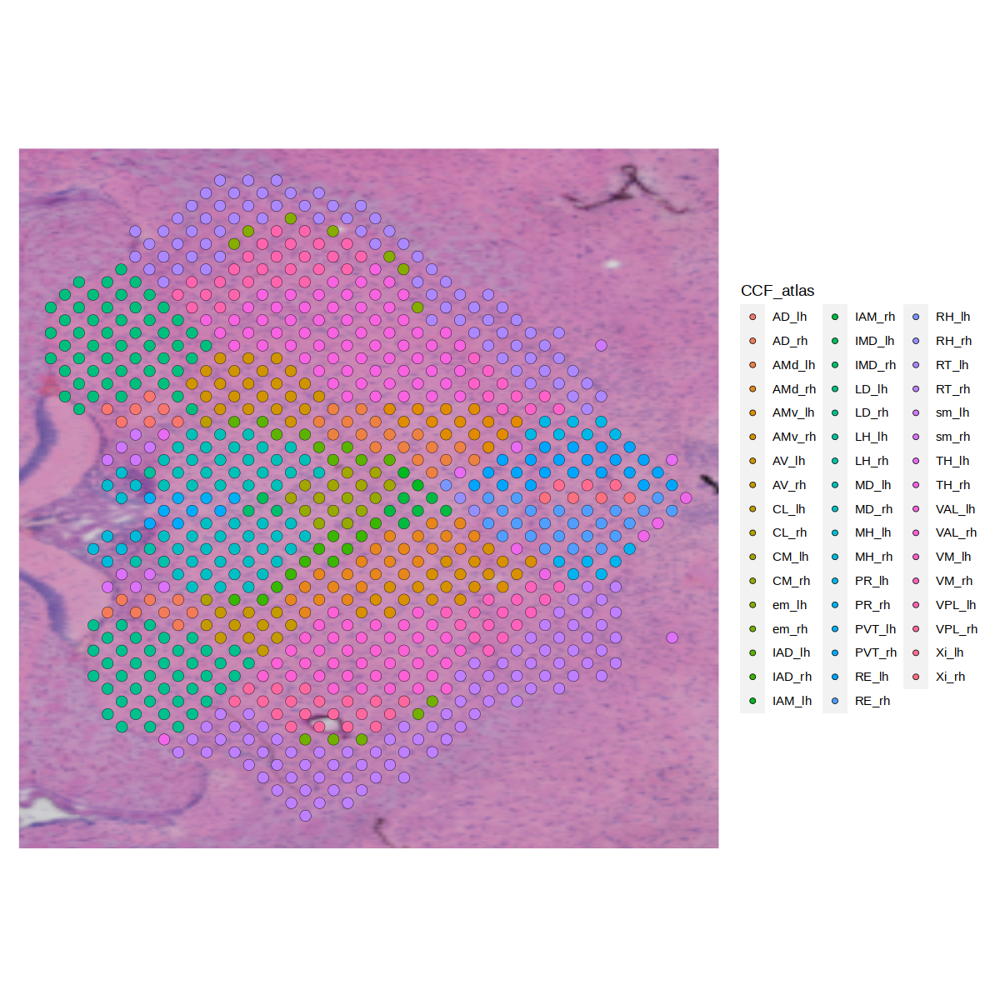

In [60]:
SpatialPlot(SUB_con_rostral3_th,group.by='CCF_atlas')

# save thalamus

In [770]:
save(PrL_con_rostral1_th,PrL_con_rostral2_th,PrL_con_rostral3_th,PrL_con_rostral4_th,
     PrL_con_caudal1_th,PrL_con_caudal2_th,PrL_con_caudal3_th,PrL_con_caudal4_th,
     PrL_test_rostral1_th,PrL_test_rostral2_th,PrL_test_rostral3_th,PrL_test_rostral4_th,PrL_test_rostral5_th,
     PrL_test_caudal1_th,PrL_test_caudal2_th,PrL_test_caudal3_th,PrL_test_caudal4_th,PrL_test_caudal5_th,
     SUB_con_rostral1_th,SUB_con_rostral2_th,SUB_con_rostral3_th,SUB_con_caudal1_th,SUB_con_caudal2_th,SUB_con_caudal3_th,
     SUB_test_rostral1_th,SUB_test_rostral2_th,SUB_test_rostral3_th,SUB_test_rostral4_th,
     SUB_test_caudal1_th,SUB_test_caudal2_th,SUB_test_caudal3_th,SUB_test_caudal4_th,
     file='../folder/total32_th_reg20240702.RDA')

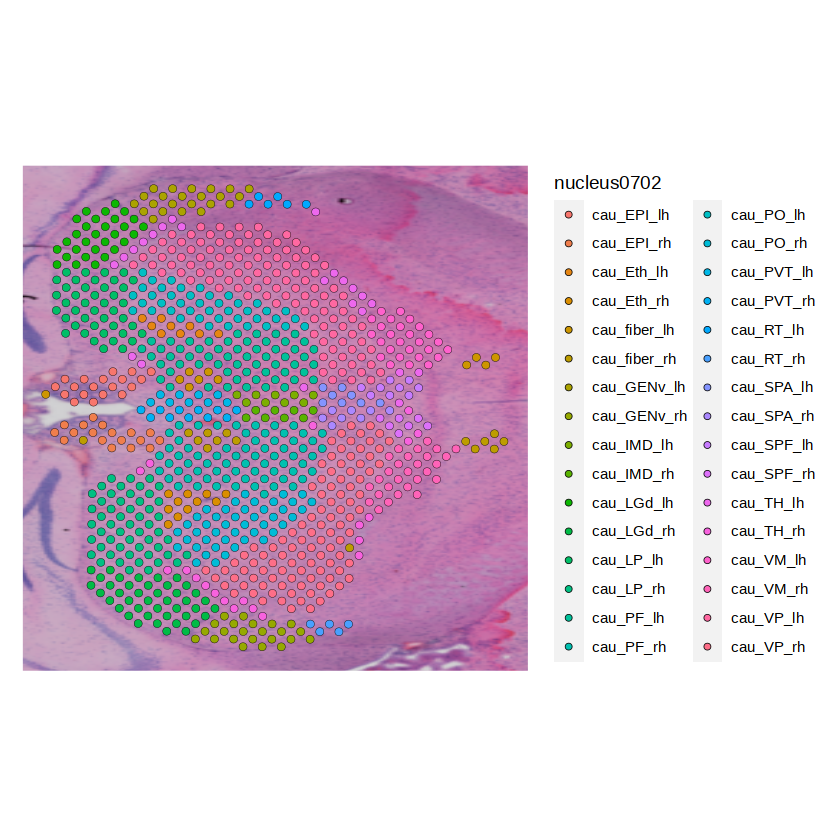

In [769]:
SpatialDimPlot(SUB_test_caudal4_th,group.by='nucleus0702')

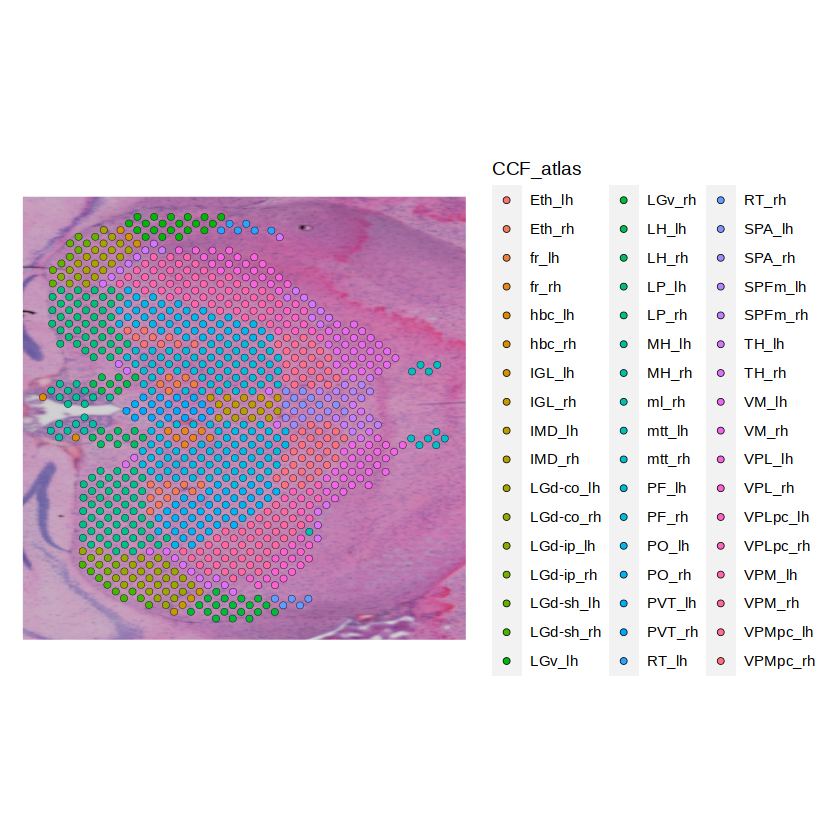

In [357]:
SpatialDimPlot(SUB_test_caudal4_th,group.by='CCF_atlas')

In [570]:
ros_nucleus <- Reduce(union,
                      list(unique(PrL_con_rostral1_th$CCF_atlas),unique(PrL_con_rostral2_th$CCF_atlas),
                           unique(PrL_con_rostral3_th$CCF_atlas),unique(PrL_con_rostral4_th$CCF_atlas),
                           unique(PrL_test_rostral1_th$CCF_atlas),unique(PrL_test_rostral2_th$CCF_atlas),
                           unique(PrL_test_rostral3_th$CCF_atlas),unique(PrL_test_rostral4_th$CCF_atlas),
                           unique(PrL_test_rostral5_th$CCF_atlas),unique(SUB_con_rostral1_th$CCF_atlas),
                           unique(SUB_con_rostral2_th$CCF_atlas),unique(SUB_con_rostral3_th$CCF_atlas),
                           unique(SUB_test_rostral1_th$CCF_atlas),unique(SUB_test_rostral2_th$CCF_atlas),
                           unique(SUB_test_rostral3_th$CCF_atlas),unique(SUB_test_rostral4_th$CCF_atlas)))

In [571]:
ros_nucleus <- unique(ros_nucleus)

In [572]:
ros_nucleus

[1] "TH_rh"  "VAL_rh" "RT_rh"  "AV_lh"  "VPL_lh" "MD_rh"  "em_lh"  "VAL_lh"
 [9] "VPL_rh" "LD_lh"  "AMv_rh" "IAD_rh" "SMT_rh" "VM_lh"  "AMd_rh" "MH_lh" 
[17] "VM_rh"  "RT_lh"  "RE_lh"  "MD_lh"  "AD_rh"  "CM_rh"  "SMT_lh" "CL_lh" 
[25] "AD_lh"  "CM_lh"  "AMd_lh" "PVT_lh" "CL_rh"  "LD_rh"  "IAD_lh" "IAM_lh"
[33] "RE_rh"  "AMv_lh" "Xi_lh"  "PR_rh"  "LH_rh"  "PR_lh"  "sm_lh"  "AV_rh" 
[41] "PVT_rh" "mtt_lh" "IMD_rh" "MH_rh"  "sm_rh"  "IAM_rh" "mtt_rh" "LH_lh" 
[49] "TH_lh"  "em_rh"  "RH_rh"  "RH_lh"  "Xi_rh"  "IMD_lh" "VPM_lh" "PT_rh" 
[57] "PT_lh"  "VPM_rh" "PCN_lh" "PCN_rh"

In [37]:
ros_map <- read.csv('../folder/th_data/rostral_nucleus_map.csv',row.names=1)

In [61]:
SUB_con_rostral3_th$nucleus0702 <- plyr::mapvalues(SUB_con_rostral3_th$CCF_atlas,
                                                   from=ros_map$nucleus,to=ros_map$map)

The following `from` values were not present in `x`: SMT_rh, SMT_lh, mtt_lh, mtt_rh, VPM_lh, PT_rh, PT_lh, VPM_rh, PCN_lh, PCN_rh



In [62]:
nucleus <- SUB_con_rostral3_th$nucleus0702
nucleus_ <- c()
for (n in nucleus){
    t <- strsplit(n,'_')[[1]][2]
    nucleus_ <- c(nucleus_,t)
}

SUB_con_rostral3_th$nucleus0702_ <-nucleus_

In [63]:
cols_ros <- c('EPI'='#E41A1C','PVT'='#A65628','fiber'='grey','TH'='grey','IMD'='#FF7F00','VP'='#FF63B6',
              'RT'='#F781BF','VM'='#EDB48E','MD'='#a7bc4b','ILM'='#4DAF4A','LD'='#9999CC','AD'='#377EB8',
              'IAD'='#2EC9FF',
              'AM'='#984EA3','IAM'='#00FFFF','AV'='#4C00FF','VAL'='#DEE585','RE'='#66CC99','SMT'='#FFFF33')

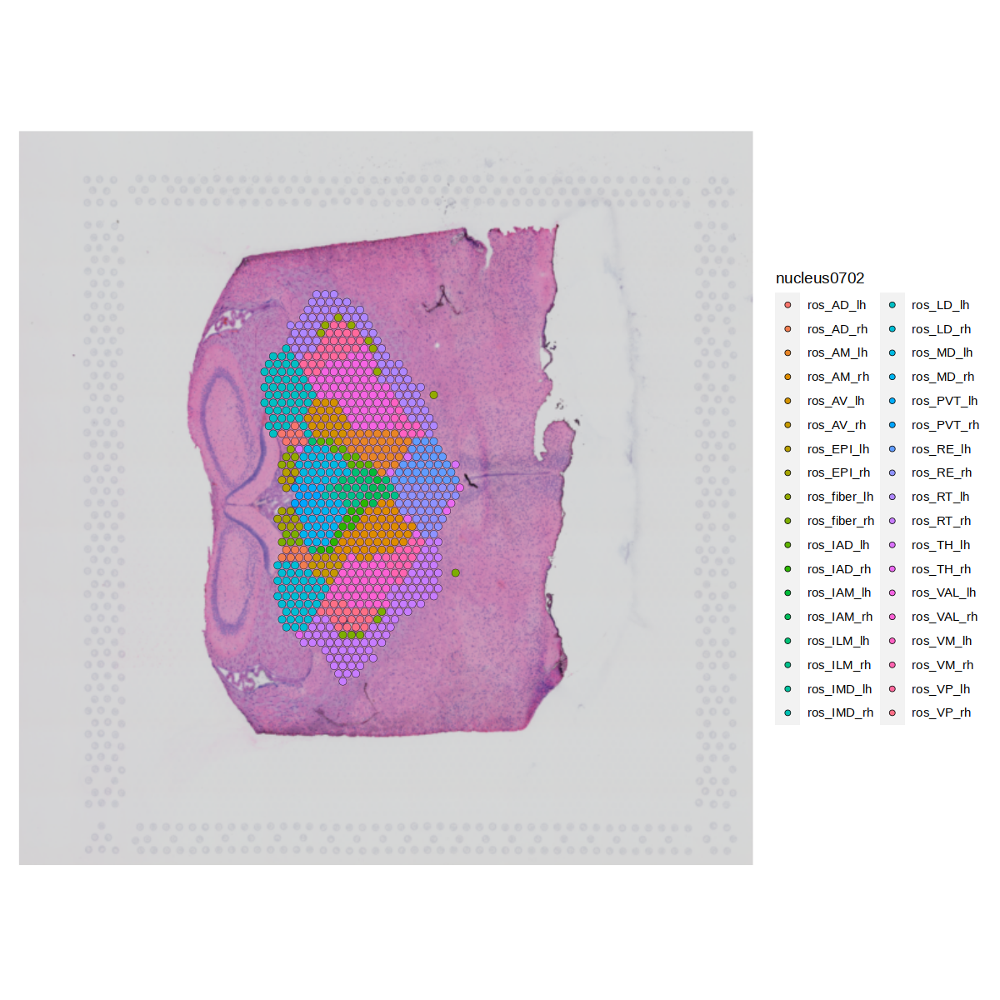

In [64]:
SpatialPlot(SUB_con_rostral3_th,group.by='nucleus0702',crop=FALSE,pt.size.factor = 1)

In [69]:
saveRDS(SUB_con_rostral3_th,'../folder/th_data/SUB_con_rostral3_th240704.rds')

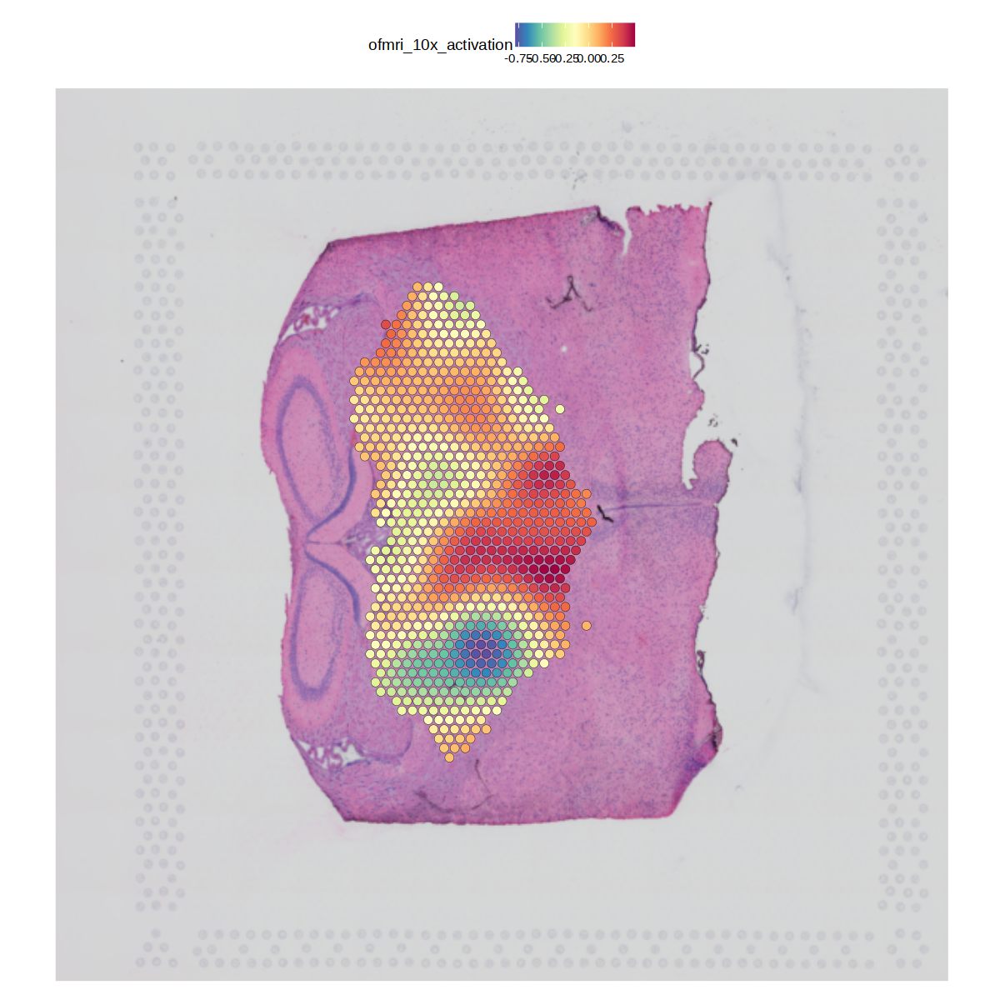

In [68]:
SpatialPlot(SUB_con_rostral3_th,features='ofmri_10x_activation',crop=FALSE,pt.size.factor = 1)

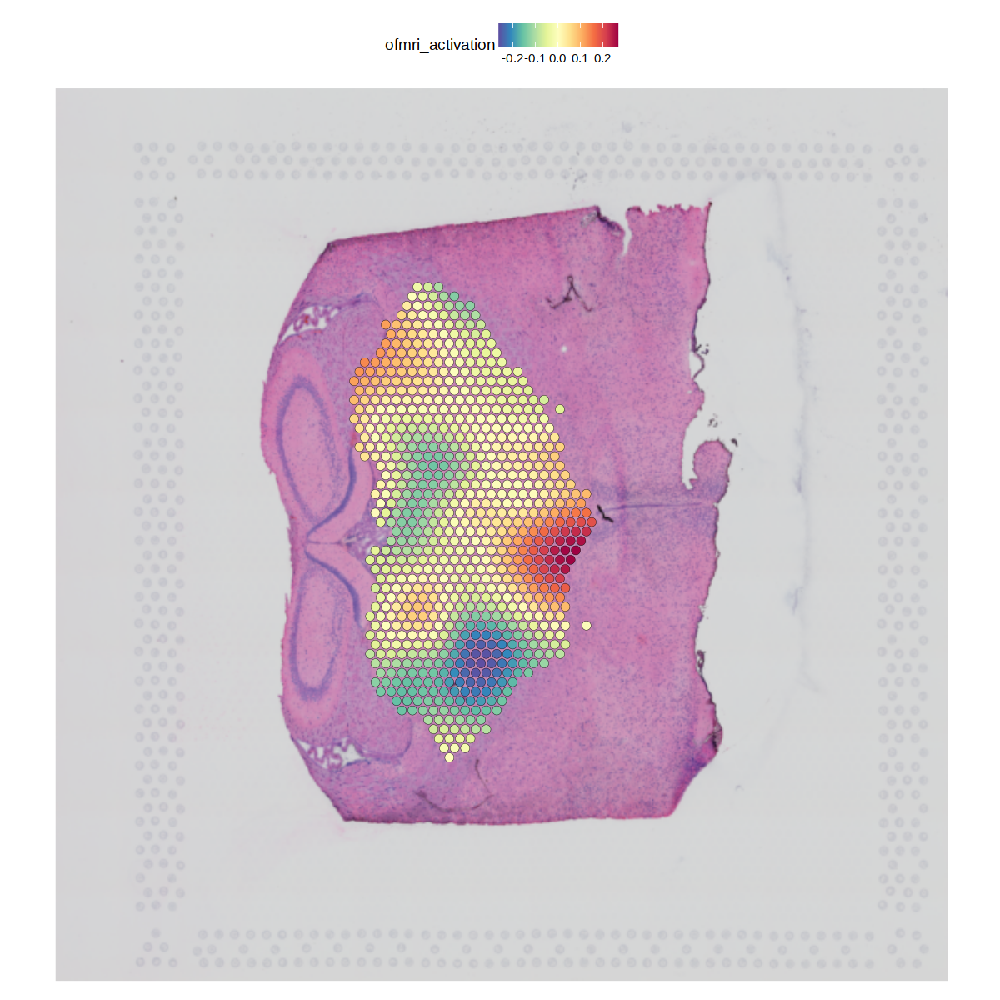

In [67]:
SpatialPlot(SUB_con_rostral3_th,features='ofmri_activation',crop=FALSE,pt.size.factor = 1)

Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.


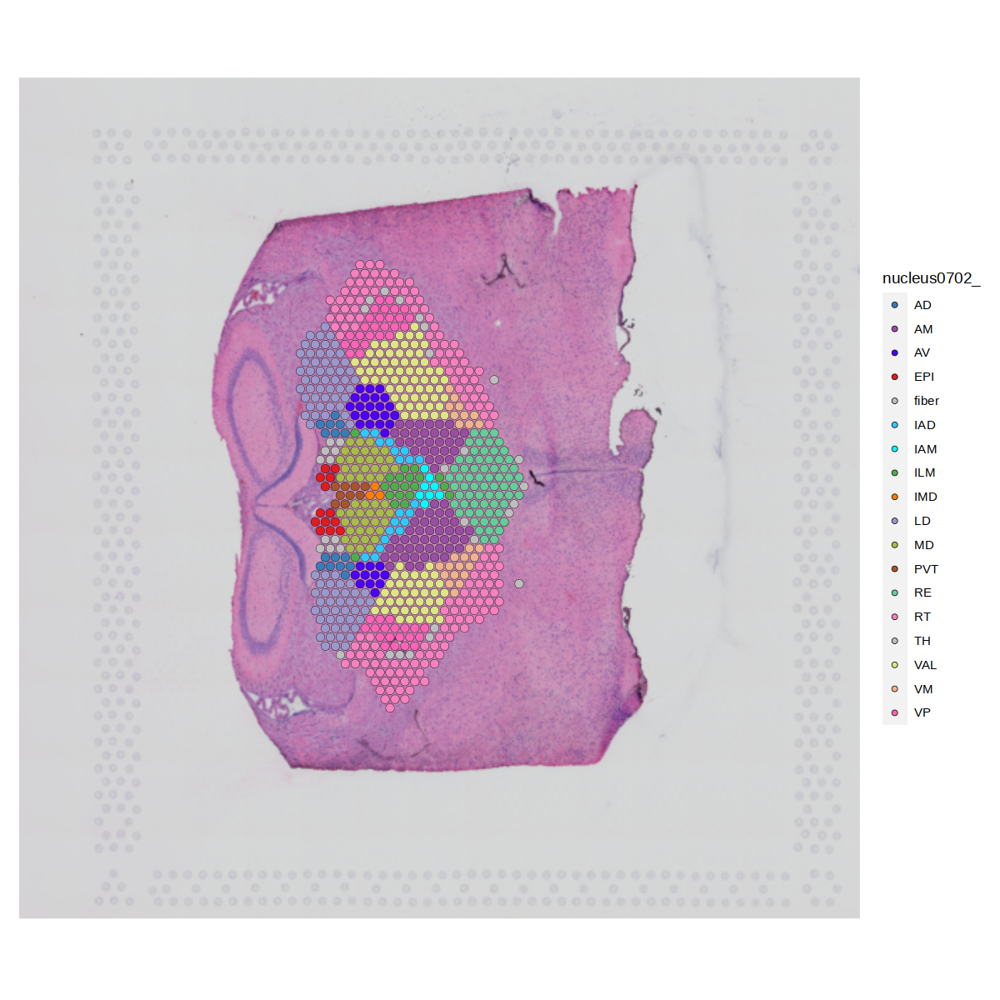

In [66]:
SpatialPlot(SUB_con_rostral3_th,group.by='nucleus0702_',crop=FALSE,pt.size.factor = 1)+
scale_fill_manual(values=cols_ros)

In [45]:
csv_old <- read.csv('/date/home/wanglab33/02Thalamus/save_10x_info_624/194_SUBcon_10X/Image_06_con_12.csv',row.names=1)
csv_new <- read.csv('/date/home/wanglab33/02Thalamus/analysis20240613/folder/Image_06_con_12_240704.csv',row.names=1)

In [46]:
unique(csv_old$CCF_atlas == csv_new$CCF_atlas)

[1] TRUE

In [47]:
unique(csv_old$ofmri_activation == csv_new$ofmri_activation)

[1] FALSE  TRUE

In [48]:
unique(csv_old$ofmri_10x_activation == csv_new$ofmri_10x_activation)

[1] FALSE  TRUE

Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.


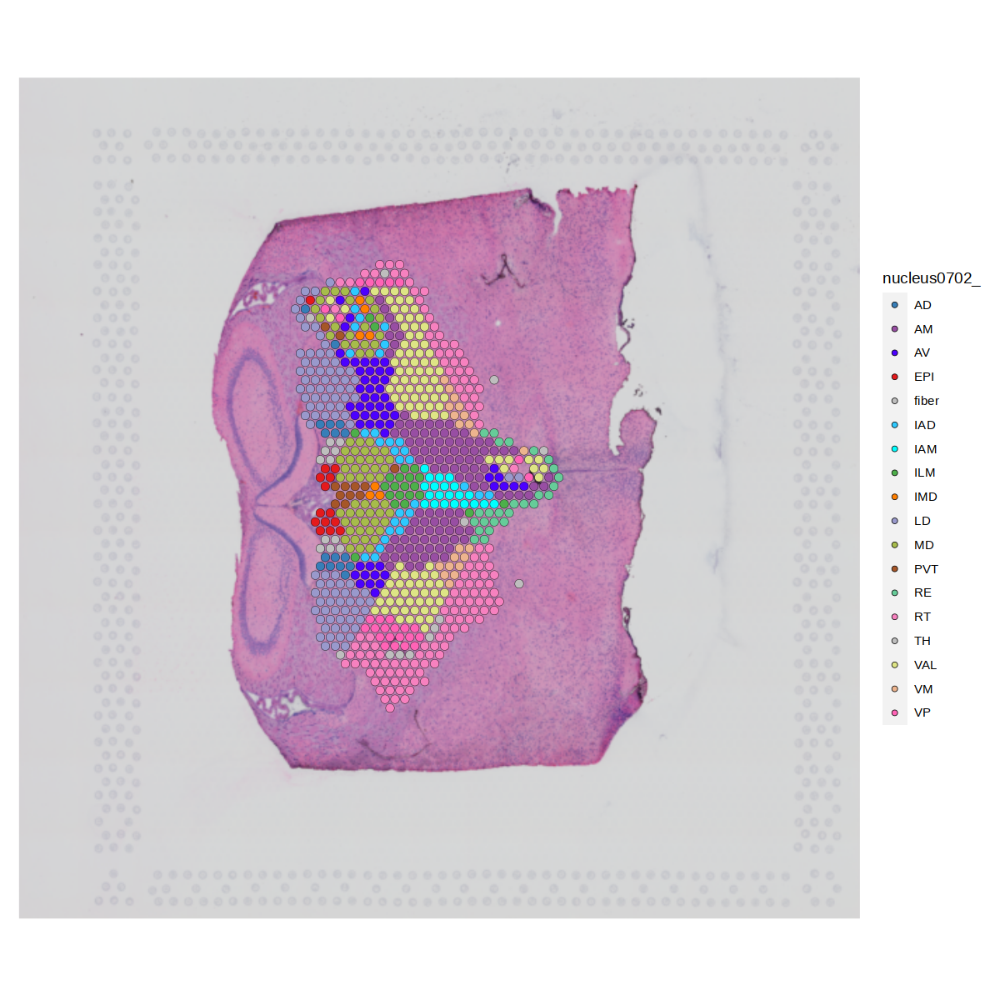

In [43]:
SpatialPlot(SUB_con_rostral3_th,group.by='nucleus0702_',crop=FALSE,pt.size.factor = 1)+
scale_fill_manual(values=cols_ros)

In [573]:
ros_map <- data.frame(nucleus=ros_nucleus)
ros_map$map <- paste0('ros_',ros_map$nucleus)

In [595]:
ros_map$map[ros_map$nucleus %in% c('em_lh','sm_lh','mtt_lh')] <- 'ros_fiber_lh'
ros_map$map[ros_map$nucleus %in% c('em_rh','sm_rh','mtt_rh')] <- 'ros_fiber_rh'

In [596]:
ros_map$map[ros_map$nucleus %in% c('VPL_lh','VPM_lh')] <- 'ros_VP_lh'
ros_map$map[ros_map$nucleus %in% c('VPL_rh','VPM_rh')] <- 'ros_VP_rh'

In [597]:
ros_map$map[ros_map$nucleus %in% c('AMv_lh','AMd_lh')] <- 'ros_AM_lh'
ros_map$map[ros_map$nucleus %in% c('AMv_rh','AMd_rh')] <- 'ros_AM_rh'

In [598]:
ros_map$map[ros_map$nucleus %in% c('RH_lh','CM_lh','PCN_lh','CL_lh')] <- 'ros_ILM_lh'
ros_map$map[ros_map$nucleus %in% c('RH_rh','CM_rh','PCN_rh','CL_rh')] <- 'ros_ILM_rh'

In [599]:
ros_map$map[ros_map$nucleus %in% c('PT_lh')] <- 'ros_PVT_lh'
ros_map$map[ros_map$nucleus %in% c('PT_rh')] <- 'ros_PVT_rh'

In [600]:
ros_map$map[ros_map$nucleus %in% c('Xi_lh','PR_lh')] <- 'ros_RE_lh'
ros_map$map[ros_map$nucleus %in% c('Xi_rh','PR_rh')] <- 'ros_RE_rh'

In [601]:
ros_map$map[ros_map$nucleus %in% c('MH_lh','LH_lh')] <- 'ros_EPI_lh'
ros_map$map[ros_map$nucleus %in% c('MH_rh','LH_rh')] <- 'ros_EPI_rh'

In [602]:
unique(ros_map$map)

[1] "ros_TH_rh"    "ros_VAL_rh"   "ros_RT_rh"    "ros_AV_lh"    "ros_VP_lh"   
 [6] "ros_MD_rh"    "ros_fiber_lh" "ros_VAL_lh"   "ros_VP_rh"    "ros_LD_lh"   
[11] "ros_AM_rh"    "ros_IAD_rh"   "ros_SMT_rh"   "ros_VM_lh"    "ros_EPI_lh"  
[16] "ros_VM_rh"    "ros_RT_lh"    "ros_RE_lh"    "ros_MD_lh"    "ros_AD_rh"   
[21] "ros_ILM_rh"   "ros_SMT_lh"   "ros_ILM_lh"   "ros_AD_lh"    "ros_AM_lh"   
[26] "ros_PVT_lh"   "ros_LD_rh"    "ros_IAD_lh"   "ros_IAM_lh"   "ros_RE_rh"   
[31] "ros_EPI_rh"   "ros_AV_rh"    "ros_PVT_rh"   "ros_IMD_rh"   "ros_fiber_rh"
[36] "ros_IAM_rh"   "ros_TH_lh"    "ros_IMD_lh"

In [606]:
PrL_con_rostral1_th$nucleus0702 <- plyr::mapvalues(PrL_con_rostral1_th$CCF_atlas,
                                                   from=ros_map$nucleus,to=ros_map$map)
PrL_con_rostral2_th$nucleus0702 <- plyr::mapvalues(PrL_con_rostral2_th$CCF_atlas,
                                                   from=ros_map$nucleus,to=ros_map$map)
PrL_con_rostral3_th$nucleus0702 <- plyr::mapvalues(PrL_con_rostral3_th$CCF_atlas,
                                                   from=ros_map$nucleus,to=ros_map$map)
PrL_con_rostral4_th$nucleus0702 <- plyr::mapvalues(PrL_con_rostral4_th$CCF_atlas,
                                                   from=ros_map$nucleus,to=ros_map$map)
PrL_test_rostral1_th$nucleus0702 <- plyr::mapvalues(PrL_test_rostral1_th$CCF_atlas,
                                                   from=ros_map$nucleus,to=ros_map$map)
PrL_test_rostral2_th$nucleus0702 <- plyr::mapvalues(PrL_test_rostral2_th$CCF_atlas,
                                                   from=ros_map$nucleus,to=ros_map$map)
PrL_test_rostral3_th$nucleus0702 <- plyr::mapvalues(PrL_test_rostral3_th$CCF_atlas,
                                                   from=ros_map$nucleus,to=ros_map$map)
PrL_test_rostral4_th$nucleus0702 <- plyr::mapvalues(PrL_test_rostral4_th$CCF_atlas,
                                                   from=ros_map$nucleus,to=ros_map$map)
PrL_test_rostral5_th$nucleus0702 <- plyr::mapvalues(PrL_test_rostral5_th$CCF_atlas,
                                                   from=ros_map$nucleus,to=ros_map$map)
SUB_con_rostral1_th$nucleus0702 <- plyr::mapvalues(SUB_con_rostral1_th$CCF_atlas,
                                                   from=ros_map$nucleus,to=ros_map$map)
SUB_con_rostral2_th$nucleus0702 <- plyr::mapvalues(SUB_con_rostral2_th$CCF_atlas,
                                                   from=ros_map$nucleus,to=ros_map$map)
SUB_con_rostral3_th$nucleus0702 <- plyr::mapvalues(SUB_con_rostral3_th$CCF_atlas,
                                                   from=ros_map$nucleus,to=ros_map$map)
SUB_test_rostral1_th$nucleus0702 <- plyr::mapvalues(SUB_test_rostral1_th$CCF_atlas,
                                                   from=ros_map$nucleus,to=ros_map$map)
SUB_test_rostral2_th$nucleus0702 <- plyr::mapvalues(SUB_test_rostral2_th$CCF_atlas,
                                                   from=ros_map$nucleus,to=ros_map$map)
SUB_test_rostral3_th$nucleus0702 <- plyr::mapvalues(SUB_test_rostral3_th$CCF_atlas,
                                                   from=ros_map$nucleus,to=ros_map$map)
SUB_test_rostral4_th$nucleus0702 <- plyr::mapvalues(SUB_test_rostral4_th$CCF_atlas,
                                                   from=ros_map$nucleus,to=ros_map$map)

The following `from` values were not present in `x`: VPM_lh, PT_rh, PT_lh, VPM_rh, PCN_lh, PCN_rh

The following `from` values were not present in `x`: PT_rh, PT_lh, VPM_rh, PCN_lh, PCN_rh

The following `from` values were not present in `x`: CL_lh, CL_rh, LH_lh, VPM_lh, PT_rh, PT_lh, VPM_rh, PCN_lh, PCN_rh

The following `from` values were not present in `x`: CL_lh, CL_rh, LH_rh, IMD_rh, LH_lh, IMD_lh, VPM_lh, PT_lh, VPM_rh, PCN_lh, PCN_rh

The following `from` values were not present in `x`: VPM_lh, PT_rh, PT_lh, VPM_rh, PCN_lh, PCN_rh

The following `from` values were not present in `x`: VPM_lh, PT_rh, PT_lh, VPM_rh, PCN_lh, PCN_rh

The following `from` values were not present in `x`: VPL_lh, VPL_rh, SMT_rh, SMT_lh, CL_lh, CL_rh, mtt_lh, IMD_rh, mtt_rh, LH_lh, IMD_lh, VPM_lh, VPM_rh, PCN_lh, PCN_rh

The following `from` values were not present in `x`: VPL_lh, VPL_rh, SMT_rh, SMT_lh, CL_lh, CL_rh, LH_rh, mtt_lh, IMD_rh, mtt_rh, LH_lh, IMD_lh, VPM_lh, VPM_rh, PCN_lh, PCN_rh

The follo

In [607]:
cau_nucleus <- Reduce(union,
                      list(unique(PrL_con_caudal1_th$CCF_atlas),unique(PrL_con_caudal2_th$CCF_atlas),
                           unique(PrL_con_caudal3_th$CCF_atlas),unique(PrL_con_caudal4_th$CCF_atlas),
                           unique(PrL_test_caudal1_th$CCF_atlas),unique(PrL_test_caudal2_th$CCF_atlas),
                           unique(PrL_test_caudal3_th$CCF_atlas),unique(PrL_test_caudal4_th$CCF_atlas),
                           unique(PrL_test_caudal5_th$CCF_atlas),unique(SUB_con_caudal1_th$CCF_atlas),
                           unique(SUB_con_caudal2_th$CCF_atlas),unique(SUB_con_caudal3_th$CCF_atlas),
                           unique(SUB_test_caudal1_th$CCF_atlas),unique(SUB_test_caudal2_th$CCF_atlas),
                           unique(SUB_test_caudal3_th$CCF_atlas),unique(SUB_test_caudal4_th$CCF_atlas)))

In [608]:
cau_nucleus <- unique(cau_nucleus)

In [609]:
cau_map <- data.frame(nucleus=cau_nucleus)
cau_map$map <- paste0('cau_',cau_map$nucleus)

In [611]:
cau_map$map[cau_map$nucleus %in% c('ml_lh','fr_lh','mtt_lh','hbc_lh')] <- 'cau_fiber_lh'
cau_map$map[cau_map$nucleus %in% c('ml_rh','fr_rh','mtt_rh','hbc_rh')] <- 'cau_fiber_rh'

In [613]:
cau_map$map[cau_map$nucleus %in% c('MH_lh','LH_lh')] <- 'cau_EPI_lh'
cau_map$map[cau_map$nucleus %in% c('MH_rh','LH_rh')] <- 'cau_EPI_rh'

In [615]:
cau_map$map[cau_map$nucleus %in% c('LGd-co_lh','LGd-sh_lh','LGd-ip_lh')] <- 'cau_LGd_lh'
cau_map$map[cau_map$nucleus %in% c('LGd-co_rh','LGd-sh_rh','LGd-ip_rh')] <- 'cau_LGd_rh'

In [617]:
cau_map$map[cau_map$nucleus %in% c('VPM_lh','VPMpc_lh','VPL_lh','VPLpc_lh')] <- 'cau_VP_lh'
cau_map$map[cau_map$nucleus %in% c('VPM_rh','VPMpc_rh','VPL_rh','VPLpc_rh')] <- 'cau_VP_rh'

In [619]:
cau_map$map[cau_map$nucleus %in% c('LGv_lh','IGL_lh','SubG_lh')] <- 'cau_GENv_lh'
cau_map$map[cau_map$nucleus %in% c('LGv_rh','IGL_rh','SubG_rh')] <- 'cau_GENv_rh'

In [621]:
cau_map$map[cau_map$nucleus %in% c('SPFm_lh','SPFp_lh')] <- 'cau_SPF_lh'
cau_map$map[cau_map$nucleus %in% c('SPFm_rh','SPFp_rh')] <- 'cau_SPF_rh'

In [627]:
cau_map$map[cau_map$nucleus %in% c('PF_lh','CL_lh','MD_lh')] <- 'cau_PF_lh'
cau_map$map[cau_map$nucleus %in% c('PF_rh','CL_rh','MD_rh')] <- 'cau_PF_rh'

In [628]:
unique(cau_map$map)

[1] "cau_PO_rh"    "cau_PO_lh"    "cau_fiber_rh" "cau_EPI_lh"   "cau_PVT_rh"  
 [6] "cau_VP_rh"    "cau_LGd_lh"   "cau_SPF_lh"   "cau_PF_rh"    "cau_EPI_rh"  
[11] "cau_GENv_lh"  "cau_SPF_rh"   "cau_SPA_lh"   "cau_TH_rh"    "cau_PVT_lh"  
[16] "cau_IMD_rh"   "cau_TH_lh"    "cau_GENv_rh"  "cau_PF_lh"    "cau_IMD_lh"  
[21] "cau_VP_lh"    "cau_LGd_rh"   "cau_SPA_rh"   "cau_LP_lh"    "cau_LP_rh"   
[26] "cau_Eth_rh"   "cau_fiber_lh" "cau_RT_lh"    "cau_RT_rh"    "cau_Eth_lh"  
[31] "cau_VM_rh"    "cau_VM_lh"

In [629]:
PrL_con_caudal1_th$nucleus0702 <- plyr::mapvalues(PrL_con_caudal1_th$CCF_atlas,
                                                   from=cau_map$nucleus,to=cau_map$map)
PrL_con_caudal2_th$nucleus0702 <- plyr::mapvalues(PrL_con_caudal2_th$CCF_atlas,
                                                   from=cau_map$nucleus,to=cau_map$map)
PrL_con_caudal3_th$nucleus0702 <- plyr::mapvalues(PrL_con_caudal3_th$CCF_atlas,
                                                   from=cau_map$nucleus,to=cau_map$map)
PrL_con_caudal4_th$nucleus0702 <- plyr::mapvalues(PrL_con_caudal4_th$CCF_atlas,
                                                   from=cau_map$nucleus,to=cau_map$map)
PrL_test_caudal1_th$nucleus0702 <- plyr::mapvalues(PrL_test_caudal1_th$CCF_atlas,
                                                   from=cau_map$nucleus,to=cau_map$map)
PrL_test_caudal2_th$nucleus0702 <- plyr::mapvalues(PrL_test_caudal2_th$CCF_atlas,
                                                   from=cau_map$nucleus,to=cau_map$map)
PrL_test_caudal3_th$nucleus0702 <- plyr::mapvalues(PrL_test_caudal3_th$CCF_atlas,
                                                   from=cau_map$nucleus,to=cau_map$map)
PrL_test_caudal4_th$nucleus0702 <- plyr::mapvalues(PrL_test_caudal4_th$CCF_atlas,
                                                   from=cau_map$nucleus,to=cau_map$map)
PrL_test_caudal5_th$nucleus0702 <- plyr::mapvalues(PrL_test_caudal5_th$CCF_atlas,
                                                   from=cau_map$nucleus,to=cau_map$map)
SUB_con_caudal1_th$nucleus0702 <- plyr::mapvalues(SUB_con_caudal1_th$CCF_atlas,
                                                   from=cau_map$nucleus,to=cau_map$map)
SUB_con_caudal2_th$nucleus0702 <- plyr::mapvalues(SUB_con_caudal2_th$CCF_atlas,
                                                   from=cau_map$nucleus,to=cau_map$map)
SUB_con_caudal3_th$nucleus0702 <- plyr::mapvalues(SUB_con_caudal3_th$CCF_atlas,
                                                   from=cau_map$nucleus,to=cau_map$map)
SUB_test_caudal1_th$nucleus0702 <- plyr::mapvalues(SUB_test_caudal1_th$CCF_atlas,
                                                   from=cau_map$nucleus,to=cau_map$map)
SUB_test_caudal2_th$nucleus0702 <- plyr::mapvalues(SUB_test_caudal2_th$CCF_atlas,
                                                   from=cau_map$nucleus,to=cau_map$map)
SUB_test_caudal3_th$nucleus0702 <- plyr::mapvalues(SUB_test_caudal3_th$CCF_atlas,
                                                   from=cau_map$nucleus,to=cau_map$map)
SUB_test_caudal4_th$nucleus0702 <- plyr::mapvalues(SUB_test_caudal4_th$CCF_atlas,
                                                   from=cau_map$nucleus,to=cau_map$map)

The following `from` values were not present in `x`: SubG_lh, IGL_rh, VM_rh, VM_lh, IGL_lh

The following `from` values were not present in `x`: IGL_rh, VM_rh, VM_lh, IGL_lh

The following `from` values were not present in `x`: IGL_rh, VM_rh, VM_lh, IGL_lh

The following `from` values were not present in `x`: IGL_rh, VM_rh, VM_lh, IGL_lh

The following `from` values were not present in `x`: CL_rh, CL_lh, MD_lh, MD_rh, SubG_rh, SubG_lh

The following `from` values were not present in `x`: CL_rh, CL_lh, MD_lh, MD_rh, SubG_rh, SubG_lh

The following `from` values were not present in `x`: hbc_rh, CL_rh, CL_lh, MD_lh, MD_rh, SubG_rh, SubG_lh

The following `from` values were not present in `x`: CL_rh, CL_lh, MD_lh, MD_rh, SubG_rh, ml_lh, SubG_lh

The following `from` values were not present in `x`: IGL_rh, VM_rh, VM_lh, IGL_lh

The following `from` values were not present in `x`: mtt_lh, mtt_rh, IGL_rh, VM_rh, VM_lh, IGL_lh

The following `from` values were not present in `x`: LGv_lh, LGd-s

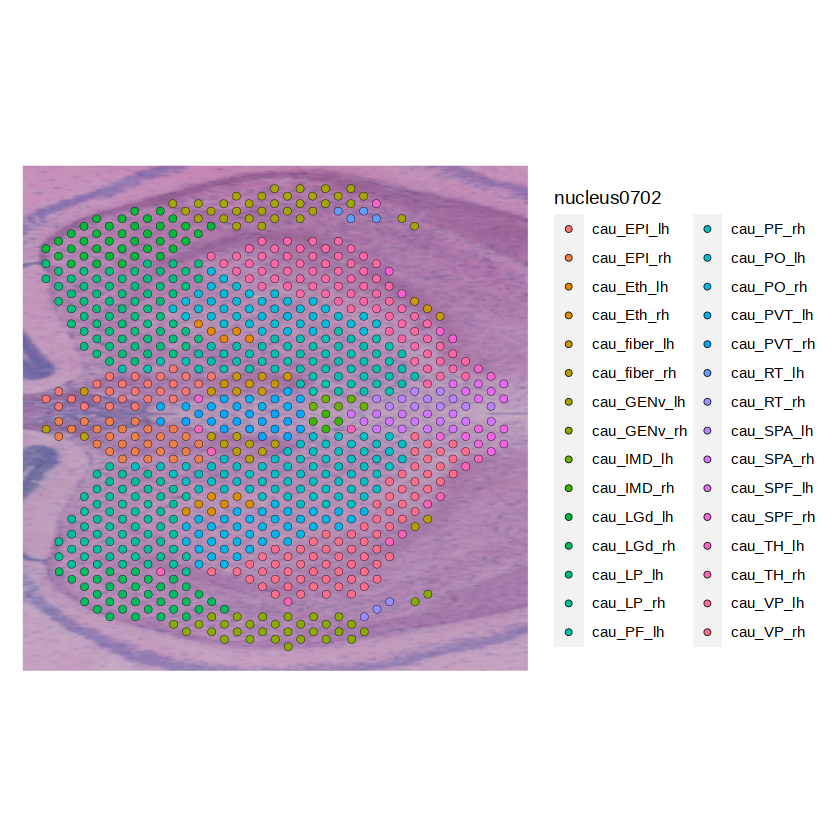

In [630]:
SpatialPlot(SUB_con_caudal1_th,group.by='nucleus0702')

In [631]:
write.csv(ros_map,'../folder/rostral_nucleus_map.csv')
write.csv(cau_map,'../folder/caudal_nucleus_map.csv')

# spot PLS

In [1]:
load('../folder/th_data/total32_th_reg20240702.RDA')

In [3]:
library(Seurat)
library(ggplot2)

Attaching SeuratObject

Warning message:
“package ‘ggplot2’ was built under R version 4.2.3”


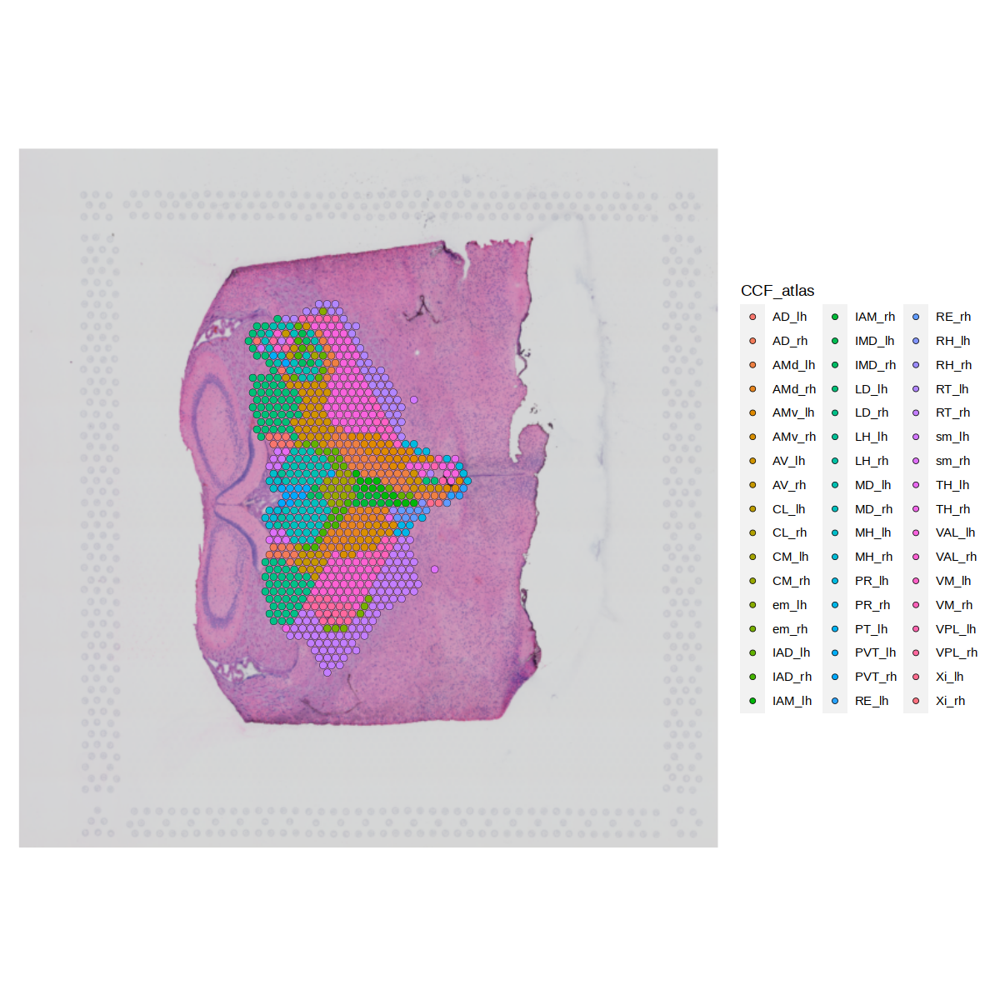

In [5]:
options(repr.plot.width=10,repr.plot.height=10)
SpatialPlot(SUB_con_rostral3_th,group.by='CCF_atlas',crop=FALSE,pt.size.factor = 1)

# region PLS

## region PLS PrL

In [360]:
DefaultAssay(PrL_con_rostral1_th)

[1] "SCT"

In [669]:
PrL_con_rostral_th <- merge(PrL_con_rostral1_th,c(PrL_con_rostral2_th,PrL_con_rostral3_th,
                                                  PrL_con_rostral4_th))

PrL_test_rostral_th <- merge(PrL_test_rostral1_th,c(PrL_test_rostral2_th,PrL_test_rostral3_th,
                                                    PrL_test_rostral4_th,PrL_test_rostral5_th))

SUB_con_rostral_th <- merge(SUB_con_rostral1_th,c(SUB_con_rostral2_th,SUB_con_rostral3_th))

SUB_test_rostral_th <- merge(SUB_test_rostral1_th,c(SUB_test_rostral2_th,SUB_test_rostral3_th,
                                                    SUB_test_rostral4_th))

PrL_con_caudal_th <- merge(PrL_con_caudal1_th,c(PrL_con_caudal2_th,PrL_con_caudal3_th,PrL_con_caudal4_th))

PrL_test_caudal_th <- merge(PrL_test_caudal1_th,c(PrL_test_caudal2_th,PrL_test_caudal3_th,
                                                  PrL_test_caudal4_th,PrL_test_caudal5_th))

SUB_con_caudal_th <- merge(SUB_con_caudal1_th,c(SUB_con_caudal2_th,SUB_con_caudal3_th))

SUB_test_caudal_th <- merge(SUB_test_caudal1_th,c(SUB_test_caudal2_th,SUB_test_caudal3_th,
                                                  SUB_test_caudal4_th))

Warning message in CheckDuplicateCellNames(object.list = objects):
“Some cell names are duplicated across objects provided. Renaming to enforce unique cell names.”
Warning message in CheckDuplicateCellNames(object.list = objects):
“Some cell names are duplicated across objects provided. Renaming to enforce unique cell names.”
Warning message in CheckDuplicateCellNames(object.list = objects):
“Some cell names are duplicated across objects provided. Renaming to enforce unique cell names.”
Warning message in CheckDuplicateCellNames(object.list = objects):
“Some cell names are duplicated across objects provided. Renaming to enforce unique cell names.”
Warning message in CheckDuplicateCellNames(object.list = objects):
“Some cell names are duplicated across objects provided. Renaming to enforce unique cell names.”
Warning message in CheckDuplicateCellNames(object.list = objects):
“Some cell names are duplicated across objects provided. Renaming to enforce unique cell names.”
Warning message 

In [670]:
Pcr <- t(AverageExpression(PrL_con_rostral_th,group.by='nucleus0702',assay='SCT')$SCT)
Pcr <- data.frame(Pcr)
mri <- PrL_con_rostral_th@meta.data[,c('nucleus0702','ofmri_activation','ofmri_10x_activation')]
ofmri <- aggregate(mri$ofmri_activation, list(mri$nucleus0702), FUN=mean)
ofmri_10x <- aggregate(mri$ofmri_10x_activation, list(mri$nucleus0702), FUN=mean)
rownames(ofmri) <- ofmri$`Group.1`
ofmri$`Group.1` <- NULL
colnames(ofmri) <- 'ofmri_activation'
rownames(ofmri_10x) <- ofmri_10x$`Group.1`
ofmri_10x$`Group.1` <- NULL
colnames(ofmri_10x) <- 'ofmri_10x_activation'
Pcr <- cbind(ofmri,ofmri_10x,Pcr)

In [672]:
Ptr <- t(AverageExpression(PrL_test_rostral_th,group.by='nucleus0702',assay='SCT')$SCT)
Ptr <- data.frame(Ptr)
mri <- PrL_test_rostral_th@meta.data[,c('nucleus0702','ofmri_activation','ofmri_10x_activation')]
ofmri <- aggregate(mri$ofmri_activation, list(mri$nucleus0702), FUN=mean)
ofmri_10x <- aggregate(mri$ofmri_10x_activation, list(mri$nucleus0702), FUN=mean)
rownames(ofmri) <- ofmri$`Group.1`
ofmri$`Group.1` <- NULL
colnames(ofmri) <- 'ofmri_activation'
rownames(ofmri_10x) <- ofmri_10x$`Group.1`
ofmri_10x$`Group.1` <- NULL
colnames(ofmri_10x) <- 'ofmri_10x_activation'
Ptr <- cbind(ofmri,ofmri_10x,Ptr)

In [674]:
overlap <- intersect(colnames(Pcr),colnames(Ptr))

Pcr <- Pcr[,overlap]
Ptr <- Ptr[,overlap]

Pr <- Ptr-Pcr

In [678]:
Pcc <- t(AverageExpression(PrL_con_caudal_th,group.by='nucleus0702',assay='SCT')$SCT)
Pcc <- data.frame(Pcc)
mri <- PrL_con_caudal_th@meta.data[,c('nucleus0702','ofmri_activation','ofmri_10x_activation')]
ofmri <- aggregate(mri$ofmri_activation, list(mri$nucleus0702), FUN=mean)
ofmri_10x <- aggregate(mri$ofmri_10x_activation, list(mri$nucleus0702), FUN=mean)
rownames(ofmri) <- ofmri$`Group.1`
ofmri$`Group.1` <- NULL
colnames(ofmri) <- 'ofmri_activation'
rownames(ofmri_10x) <- ofmri_10x$`Group.1`
ofmri_10x$`Group.1` <- NULL
colnames(ofmri_10x) <- 'ofmri_10x_activation'
Pcc <- cbind(ofmri,ofmri_10x,Pcc)

In [679]:
Ptc <- t(AverageExpression(PrL_test_caudal_th,group.by='nucleus0702',assay='SCT')$SCT)
Ptc <- data.frame(Ptc)
mri <- PrL_test_caudal_th@meta.data[,c('nucleus0702','ofmri_activation','ofmri_10x_activation')]
ofmri <- aggregate(mri$ofmri_activation, list(mri$nucleus0702), FUN=mean)
ofmri_10x <- aggregate(mri$ofmri_10x_activation, list(mri$nucleus0702), FUN=mean)
rownames(ofmri) <- ofmri$`Group.1`
ofmri$`Group.1` <- NULL
colnames(ofmri) <- 'ofmri_activation'
rownames(ofmri_10x) <- ofmri_10x$`Group.1`
ofmri_10x$`Group.1` <- NULL
colnames(ofmri_10x) <- 'ofmri_10x_activation'
Ptc <- cbind(ofmri,ofmri_10x,Ptc)

In [686]:
unique(PrL_con_caudal_th$CCF_atlas)

[1] "PO_rh"     "PO_lh"     "ml_rh"     "LH_lh"     "PVT_rh"    "VPLpc_rh" 
 [7] "VPL_rh"    "LGd-co_lh" "SPFm_lh"   "PF_rh"     "LH_rh"     "LGv_lh"   
[13] "LGd-sh_lh" "SPFm_rh"   "SPA_lh"    "hbc_rh"    "TH_rh"     "CL_rh"    
[19] "PVT_lh"    "IMD_rh"    "TH_lh"     "LGv_rh"    "VPM_rh"    "PF_lh"    
[25] "MH_lh"     "IMD_lh"    "VPMpc_rh"  "VPL_lh"    "LGd-co_rh" "VPM_lh"   
[31] "SPA_rh"    "LP_lh"     "LP_rh"     "CL_lh"     "LGd-ip_lh" "VPLpc_lh" 
[37] "MD_lh"     "MH_rh"     "MD_rh"     "fr_rh"     "Eth_rh"    "mtt_lh"   
[43] "LGd-sh_rh" "SubG_rh"   "fr_lh"     "VPMpc_lh"  "mtt_rh"    "RT_lh"    
[49] "ml_lh"     "RT_rh"     "Eth_lh"    "hbc_lh"    "LGd-ip_rh" "SubG_lh"

In [681]:
dim(Pcc)

[1]    30 18546

In [682]:
dim(Ptc)

[1]    32 18546

In [687]:
rows <- rownames(Ptc)

In [688]:
Pcc_ <- Pcc[rows,]

In [690]:
rownames(Pcc_) <- rows
Pcc_[is.na(Pcc_)] <- 0

In [691]:
Pcc_

,ofmri_activation,ofmri_10x_activation,Xkr4,Gm1992,Gm19938,Sox17,Mrpl15,Lypla1,Tcea1,Rgs20,⋯,Gm49794,Psors1c2,Frs3os,X1700020D05Rik,Majin,Tmc1,Dntt,Nr0b1,Atp7a,Gpr143
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
cau_EPI_lh,-0.059311508,-0.0701591329,0.007575758,0.000000000,0.007575758,0.10606061,0.7651515,0.5909091,0.8636364,0.19696970,⋯,0.00000000,0.00000000,0.00000000,0,0,0.007575758,0.00000000,0,0.00000000,0
cau_EPI_rh,-0.024690432,-0.0202732929,0.000000000,0.000000000,0.000000000,0.08870968,0.7822581,0.6129032,0.8387097,0.37903226,⋯,0.00000000,0.00000000,0.00000000,0,0,0.000000000,0.00000000,0,0.00000000,0
cau_Eth_lh,0.026146974,-0.1722834976,0.031250000,0.000000000,0.000000000,0.12500000,1.0625000,0.5312500,1.1562500,0.03125000,⋯,0.03125000,0.00000000,0.00000000,0,0,0.000000000,0.00000000,0,0.00000000,0
cau_Eth_rh,0.036614520,0.0472344446,0.000000000,0.000000000,0.000000000,0.12121212,0.7272727,0.4848485,0.9696970,0.18181818,⋯,0.00000000,0.00000000,0.00000000,0,0,0.000000000,0.00000000,0,0.00000000,0
cau_fiber_lh,-0.070924264,-0.1266362145,0.000000000,0.000000000,0.000000000,0.09677419,0.5806452,0.4354839,0.7580645,0.08064516,⋯,0.00000000,0.00000000,0.00000000,0,0,0.000000000,0.00000000,0,0.00000000,0
cau_fiber_rh,0.024558126,0.0580306538,0.000000000,0.000000000,0.000000000,0.08823529,0.6323529,0.2794118,0.7352941,0.13235294,⋯,0.00000000,0.00000000,0.00000000,0,0,0.000000000,0.00000000,0,0.00000000,0
cau_GENv_lh,0.222103431,0.2400096356,0.023529412,0.000000000,0.000000000,0.09411765,0.7176471,0.4117647,0.8823529,0.25882353,⋯,0.00000000,0.01176471,0.00000000,0,0,0.011764706,0.00000000,0,0.00000000,0
cau_GENv_rh,0.238360419,0.1992741430,0.014925373,0.000000000,0.000000000,0.13432836,0.5074627,0.3880597,1.0597015,0.25373134,⋯,0.00000000,0.00000000,0.00000000,0,0,0.000000000,0.00000000,0,0.00000000,0
cau_IMD_lh,-0.053891475,-0.1263798851,0.000000000,0.000000000,0.000000000,0.05555556,0.8333333,0.5555556,1.1111111,0.22222222,⋯,0.00000000,0.00000000,0.00000000,0,0,0.000000000,0.00000000,0,0.00000000,0


In [685]:
setdiff(rownames(Ptc),rownames(Pcc))

[1] "cau_VM_lh" "cau_VM_rh"

In [692]:
overlap <- intersect(colnames(Pcc_),colnames(Ptc))

Pcc <- Pcc_[,overlap]
Ptc <- Ptc[,overlap]

Pc <- Ptc-Pcc

In [694]:
overlap <- intersect(colnames(Pr),colnames(Pc))
Pr <- Pr[,overlap]
Pc <- Pc[,overlap]

In [695]:
P <- rbind(Pr,Pc)

In [700]:
P <- P[,colSums(P) != 0]

In [415]:
library(pls)


Attaching package: ‘pls’


The following object is masked from ‘package:stats’:

    loadings




In [744]:
df_pl <- P
df_pl <- df_pl[,columns]
df1_pl <- df_pl
df1_pl$ofmri_10x_activation <- NULL
df2_pl <- df_pl
df2_pl$ofmri_activation <- NULL

In [745]:
set.seed(240701)

In [735]:
summary(colSums(P))

      Min.    1st Qu.     Median       Mean    3rd Qu.       Max. 
-1582.0628    -1.5695    -0.1789    -1.4048     0.1694   506.9268 

In [728]:
df1_pl

,ofmri_activation,Xkr4,Gm1992,Gm19938,Sox17,Mrpl15,Lypla1,Tcea1,Rgs20,Atp6v1h,⋯,X1810028F09Rik,Tgm1,Ldhal6b,Tulp1,H2.Eb2,Trim10,Cdx1,Cdca5,Gm35438,Atp7a
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ros_AD_lh,2.3477958,-0.033571429,0,0.000000000,0.008571429,0.135000000,-0.12571429,-0.56071429,-2.150000e-01,-0.790714286,⋯,0.000000000,0.000000000,0.000000000,0.00000000,0.000000000,0.000000000,0.000000000,0.020000000,0.000000000,0
ros_AD_rh,2.5645561,-0.020000000,0,-0.005714286,-0.111428571,-0.657142857,-0.14571429,-0.17428571,-2.457143e-01,-0.574285714,⋯,0.014285714,0.000000000,0.000000000,0.00000000,0.000000000,0.014285714,0.000000000,0.000000000,0.014285714,0
ros_AM_lh,1.6547553,0.007140623,0,0.005524862,-0.030334619,-0.012248515,-0.26571458,-0.18987804,2.194308e-02,0.155373710,⋯,0.000000000,0.000000000,0.000000000,0.00000000,-0.009433962,0.000000000,0.000000000,0.000000000,0.000000000,0
ros_AM_rh,2.1567650,-0.013368398,0,-0.003342099,-0.003835196,0.001260136,-0.15746220,-0.20551172,6.229454e-02,-0.041639272,⋯,0.000000000,0.000000000,0.000000000,0.00000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0
ros_AV_lh,1.4610273,-0.038173591,0,0.006993007,-0.073796791,-0.170711641,-0.25076100,-0.33385438,-8.227067e-05,-0.571945701,⋯,0.006993007,0.006993007,0.000000000,0.00000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0
ros_AV_rh,2.2751901,-0.031468531,0,-0.015734266,-0.004370629,0.120629371,-0.34877622,-0.13024476,4.020979e-02,-0.243006993,⋯,0.006993007,0.000000000,0.000000000,0.00000000,-0.011363636,0.000000000,0.000000000,0.000000000,0.000000000,0
ros_EPI_lh,2.7750975,0.000000000,0,0.000000000,0.093750000,-0.250000000,-0.03750000,-0.45625000,7.500000e-02,-0.218750000,⋯,0.000000000,0.031250000,0.000000000,0.00000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0
ros_EPI_rh,2.6088702,0.000000000,0,0.000000000,0.026890756,-0.579831933,-0.10420168,-0.75966387,-6.050420e-02,-0.136134454,⋯,0.000000000,0.000000000,0.000000000,0.00000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0
ros_fiber_lh,1.9622037,0.000000000,0,0.044776119,-0.087299352,0.099127006,-0.44607153,-0.12334554,-5.632216e-03,-0.288932695,⋯,-0.018867925,-0.018867925,0.000000000,0.00000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0


In [729]:
options(expressions = 5e5)

In [742]:
head(df_pl)

,ofmri_activation,ofmri_10x_activation,Xkr4,Sox17,Mrpl15,Lypla1,Tcea1,Rgs20,Atp6v1h,Oprk1,⋯,mt.Nd4l,mt.Nd4,mt.Nd5,mt.Nd6,mt.Cytb,CAAA01118383.1,Vamp7,Spry3,Tmlhe,AC149090.1
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ros_AD_lh,2.347796,2.542669,-0.033571429,0.008571429,0.135000000,-0.1257143,-0.5607143,-2.150000e-01,-0.79071429,0.01928571,⋯,-0.91571429,-23.089286,-2.95000000,-0.2335714,-31.2614286,-0.005000000,-0.2350000,0.01928571,0.000000000,0.29428571
ros_AD_rh,2.564556,2.912861,-0.020000000,-0.111428571,-0.657142857,-0.1457143,-0.1742857,-2.457143e-01,-0.57428571,-0.05428571,⋯,0.13142857,2.314286,0.15428571,-0.2514286,0.7485714,-0.065714286,-0.3571429,-0.15142857,0.014285714,-0.01142857
ros_AM_lh,1.654755,1.273099,0.007140623,-0.030334619,-0.012248515,-0.2657146,-0.1898780,2.194308e-02,0.15537371,-0.04555405,⋯,-0.05665589,-13.725998,-1.27999583,0.0109976,-19.7920880,-0.044355259,-0.3085583,-0.01214427,-0.022777025,1.14969248
ros_AM_rh,2.156765,1.551550,-0.013368398,-0.003835196,0.001260136,-0.1574622,-0.2055117,6.229454e-02,-0.04163927,-0.03265396,⋯,-0.12705457,-2.023285,-0.32095113,-0.0830046,-10.6319307,0.009040105,-0.2444664,0.07204690,0.017751479,1.19504712
ros_AV_lh,1.461027,1.694722,-0.038173591,-0.073796791,-0.170711641,-0.2507610,-0.3338544,-8.227067e-05,-0.57194570,-0.06137392,⋯,0.05232415,6.402057,0.02451666,-0.1581242,1.3805019,-0.087782805,-0.3531057,-0.06935418,0.000000000,0.72809543
ros_AV_rh,2.275190,2.364289,-0.031468531,-0.004370629,0.120629371,-0.3487762,-0.1302448,4.020979e-02,-0.24300699,-0.01311189,⋯,-0.96503497,-23.902098,-1.97989510,-0.1774476,-17.1389860,0.012237762,-0.2325175,-0.10227273,0.005244755,0.79545455


In [743]:
dim(df_pl)

[1]    70 16337

In [733]:
length(columns)

[1] 16337

In [1065]:
write.csv(df1_pl,'../folder/PrLmodel1/PrL_PLS_model1data.csv')
write.csv(df2_pl,'../folder/PrLmodel2/PrL_PLS_model2data.csv')

In [1064]:
dim(df1_pl)

[1]    70 16336

In [746]:
model1 <- plsr(ofmri_activation~., data=df1_pl, scale=TRUE,validation='CV')

model2 <- plsr(ofmri_10x_activation~., data=df2_pl, scale=TRUE,validation='CV')

In [748]:
model1

Partial least squares regression, fitted with the kernel algorithm.
Cross-validated using 10 random segments.
Call:
plsr(formula = ofmri_activation ~ ., data = df1_pl, scale = TRUE,     validation = "CV")

In [749]:
model2

Partial least squares regression, fitted with the kernel algorithm.
Cross-validated using 10 random segments.
Call:
plsr(formula = ofmri_10x_activation ~ ., data = df2_pl, scale = TRUE,     validation = "CV")

### model1 ofmri_activation

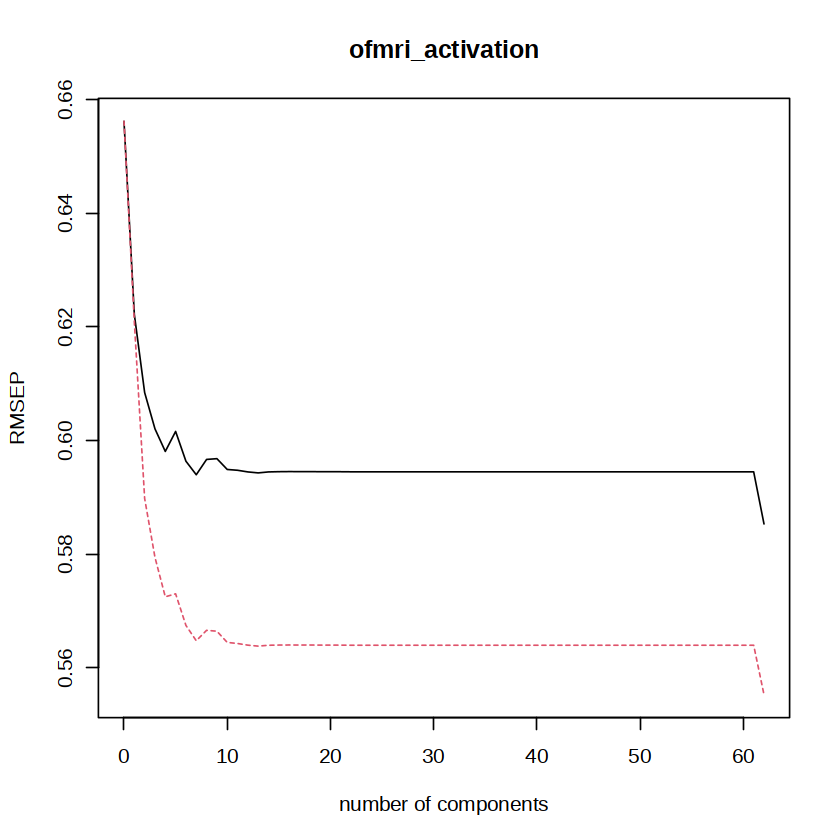

In [750]:
validationplot(model1)

In [751]:
summary(model1)

Data: 	X dimension: 70 16335 
	Y dimension: 70 1
Fit method: kernelpls
Number of components considered: 62

VALIDATION: RMSEP
Cross-validated using 10 random segments.
       (Intercept)  1 comps  2 comps  3 comps  4 comps  5 comps  6 comps
CV          0.6562   0.6222   0.6084   0.6021   0.5981   0.6016   0.5964
adjCV       0.6562   0.6209   0.5898   0.5794   0.5725   0.5730   0.5675
       7 comps  8 comps  9 comps  10 comps  11 comps  12 comps  13 comps
CV      0.5940   0.5967   0.5968    0.5949    0.5948    0.5945    0.5943
adjCV   0.5648   0.5666   0.5665    0.5645    0.5643    0.5640    0.5638
       14 comps  15 comps  16 comps  17 comps  18 comps  19 comps  20 comps
CV       0.5945    0.5945    0.5945    0.5945    0.5945    0.5945    0.5945
adjCV    0.5640    0.5640    0.5640    0.5640    0.5640    0.5640    0.5640
       21 comps  22 comps  23 comps  24 comps  25 comps  26 comps  27 comps
CV       0.5945    0.5945    0.5945    0.5945    0.5945    0.5945    0.5945
adjCV    0.564

In [449]:
library(mdatools)


Attaching package: ‘mdatools’


The following object is masked from ‘package:pls’:

    crossval




In [754]:
X_scores <- scores(model1)
Y_scores <- Yscores(model1)

In [778]:
X_scores <- as.matrix(X_scores)

In [786]:
write.csv(X_scores,'../PrL_model1_Xscores.csv')

In [787]:
X_scores <- read.csv('../PrL_model1_Xscores.csv',row.names=1)

In [789]:
write.csv(Y_scores,'../PrL_model1_Yscores.csv')

In [790]:
Y_scores <- read.csv('../PrL_model1_Yscores.csv',row.names=1)

In [791]:
Y_scores

,Comp.1,Comp.2,Comp.3,Comp.4,Comp.5,Comp.6,Comp.7,Comp.8,Comp.9,Comp.10,⋯,Comp.53,Comp.54,Comp.55,Comp.56,Comp.57,Comp.58,Comp.59,Comp.60,Comp.61,Comp.62
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ros_AD_lh,117.599223,17.838588,11.4218997,-21.464166,-41.5167257,-28.948042,10.696170020,23.5903402,17.88972770,-5.0674618,⋯,6.9843750,-0.8437500,-1.750000,2.62500,-5.125000,0.5000000,0.1875000,-11.5468750,2.91796875,19.9072266
ros_AD_rh,157.673366,19.787389,13.0212625,-2.054796,-23.1129269,-25.603216,-8.947769583,3.8650771,21.04142475,8.4438405,⋯,-2.3906250,1.8437500,-1.000000,-1.50000,-4.000000,9.5625000,-4.6562500,25.3750000,-11.92578125,19.4814453
ros_AM_lh,-10.528528,-7.319102,-3.5241218,2.432853,3.0393140,9.476783,7.875197988,-0.3034956,-0.75935830,-1.7378587,⋯,12.2001953,5.6992188,-4.109375,3.56250,-1.429688,-7.1367188,25.9013672,-28.6875000,-16.47961426,-28.7399902
ros_AM_rh,82.281873,15.387085,22.0695111,40.033078,30.4542252,35.971851,21.722612141,-0.1213913,-16.95666152,-21.6440878,⋯,4.9218750,-9.6562500,-2.000000,18.37500,2.250000,-36.1562500,21.7031250,60.5937500,-2.15527344,73.7197266
ros_AV_lh,-46.344515,-22.296725,-20.1421006,-34.816828,-32.8743484,-18.419029,6.088163920,12.7200228,16.05787373,7.6916868,⋯,9.2968750,0.4687500,-14.218750,15.68750,13.406250,-31.5468750,10.8750000,27.6718750,1.44189453,-152.3837891
ros_AV_rh,104.176033,15.736826,16.2482209,14.911311,0.8336491,-1.235627,-1.530149669,-6.3982221,-6.31537790,-5.2153935,⋯,11.0781250,6.3437500,-3.000000,6.62500,-11.000000,-12.8437500,48.0156250,-88.6250000,-32.83984375,173.6210938
ros_EPI_lh,196.597775,23.915325,-20.6462390,28.338821,27.5455327,-43.760201,-11.024895483,33.2426036,-22.58520063,5.7460013,⋯,-1.7187500,1.8125000,2.000000,2.75000,3.250000,1.1250000,-0.4375000,2.6250000,-1.90429688,-2.5996094
ros_EPI_rh,165.866051,25.552669,-26.3784321,13.402758,24.8762479,-24.067977,-13.510802803,18.5693611,-2.43275317,-5.0382520,⋯,0.3750000,0.0000000,-0.250000,0.50000,-0.375000,-0.2500000,-0.4531250,-3.5937500,0.44531250,10.5117188
ros_fiber_lh,46.311828,8.779583,11.4097521,17.928744,5.8934828,-11.305976,-21.357961709,-14.7441983,18.69912455,19.6967616,⋯,6.3125000,-0.3281250,0.875000,0.37500,-4.062500,4.4375000,-1.8203125,5.6640625,1.19384766,7.6943359


In [788]:
X_scores

,Comp.1,Comp.2,Comp.3,Comp.4,Comp.5,Comp.6,Comp.7,Comp.8,Comp.9,Comp.10,⋯,Comp.53,Comp.54,Comp.55,Comp.56,Comp.57,Comp.58,Comp.59,Comp.60,Comp.61,Comp.62
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ros_AD_lh,43.436404,9.6386315,22.0756285,19.2301223,-24.1164194,-38.7310080,-11.086300,11.1309930,22.239329,3.0393197,⋯,7.2584823,-0.22878326,-1.9932892,1.24267268,-0.131658896,-0.0001333649,0.0658637390,-0.355802861,-0.1240519810,0.633979776
ros_AD_rh,75.408530,10.4392254,14.0411594,20.6002691,-7.7231535,-17.4193775,-12.516643,-10.7892777,13.793745,16.8392510,⋯,-3.1037691,2.05842268,0.1849873,0.45011471,-0.524711826,0.1851905327,-0.1720705354,1.317403827,-0.2136113862,0.991249918
ros_AM_lh,19.900180,-4.7890805,-4.7316672,-0.5462530,-2.6570620,2.2739436,8.155435,0.2253615,0.732314,-1.1433122,⋯,9.9366501,6.56157980,-3.5439065,0.66554050,0.303961764,-0.6699247339,0.3257263279,1.422453442,0.1026123193,-0.609264204
ros_AM_rh,18.311026,-0.4569551,2.1991112,10.1821445,8.8319948,16.1038439,21.834701,11.6881196,1.621308,-9.6972866,⋯,8.5706490,-8.54062448,-8.5528191,1.87531143,1.741243425,-0.8004675823,-0.2029644218,0.588366873,-0.5403567322,2.310626867
ros_AV_lh,46.352729,-7.8364025,-2.8607842,-2.5937132,-21.8029001,-23.9874056,-5.657047,1.5364749,9.455797,5.9267326,⋯,9.0486681,4.38482753,-13.8683102,-0.37611420,1.748232402,-0.5071907275,-0.0864755883,0.032682927,1.0981865535,-3.655481549
ros_AV_rh,38.751161,4.0719792,8.8469983,14.0941767,1.5763692,0.1638833,4.377738,-1.9998608,-1.838801,-3.7164873,⋯,8.5835165,6.81248153,-4.1432141,2.68205785,0.384611027,-1.2395079787,0.8030552167,2.637629682,-1.4458370116,2.057181994
ros_EPI_lh,97.171303,38.7375767,-34.7121999,1.3389597,53.8492429,-33.6765746,-41.719918,48.9721252,-27.517219,9.2217104,⋯,-2.3604802,1.01841976,0.1462327,-0.23500682,0.016691172,0.0180118061,-0.0176044104,0.201931698,0.0066570679,-0.103116957
ros_EPI_rh,59.632423,44.4901502,-33.0308851,-10.9806964,39.3432083,-11.7106820,-30.657082,20.2636583,1.891776,-11.8529937,⋯,0.3657842,0.02407503,-0.6731399,0.24398125,0.003892363,0.0095227000,0.0170708432,-0.065915072,-0.0723446548,0.078689819
ros_fiber_lh,9.811261,0.5883466,2.5108280,12.1520101,12.6893636,8.2285137,-7.743700,-27.7672521,1.792621,29.7390526,⋯,6.3617451,-0.47949863,0.3108389,0.71872523,-0.284621541,0.0779846329,-0.0435116743,-0.080402068,-0.0475581773,-0.197195933


In [799]:
kmeans_result <- kmeans(X_scores,centers=3)

In [800]:
X_scores$cluster <- as.factor(kmeans_result$cluster)

In [804]:
length(model1$fitted.values)

[1] 4340

In [805]:
head(model1$loading.weights)

,Comp 1,Comp 2,Comp 3,Comp 4,Comp 5,Comp 6,Comp 7,Comp 8,Comp 9,Comp 10,⋯,Comp 53,Comp 54,Comp 55,Comp 56,Comp 57,Comp 58,Comp 59,Comp 60,Comp 61,Comp 62
Xkr4,-0.0033199452,-0.001693046,-0.001058838,0.005897736,0.0079543488,-0.011730854,0.007828181,-0.0167929823,-0.014951502,-0.003284148,⋯,-0.010945200,-0.012198058,-0.001123681,0.0037019227,4.281001e-05,0.001470299,0.0007911823,-0.006436173,-0.0040815057,-0.0068872978
Sox17,-0.0033814036,0.005947611,-0.011460391,0.010222796,-0.0037470114,0.005379378,-0.002505176,0.0002479572,-0.018677101,0.003188282,⋯,-0.010990516,-0.006018222,-0.005264872,0.0011112716,-3.927048e-03,-0.002750582,-0.0027729977,-0.006198757,0.0006808057,-0.0077633672
Mrpl15,-0.0136946477,-0.002779344,-0.004523785,-0.008664675,-0.0099949873,-0.007343662,-0.013168550,-0.0017751231,0.002518587,-0.012406537,⋯,0.010305934,0.002318746,-0.013306426,-0.0123625629,-1.385663e-02,-0.013210810,-0.0097820318,-0.008388397,-0.0036042367,-0.0043624417
Lypla1,-0.0077280583,0.004333612,-0.004862905,0.006607151,-0.0001551044,0.010762529,-0.012342788,0.0134722083,0.003585475,0.005902642,⋯,-0.007030622,-0.004212917,-0.007992344,-0.0113123013,-8.675894e-03,-0.010269653,-0.0104408102,-0.008846405,-0.0009113417,0.0022480823
Tcea1,-0.0092285793,0.007789228,0.001632366,0.004409087,0.0050462197,0.001610729,0.007317606,-0.0091521658,0.004167664,-0.003905821,⋯,-0.009496641,-0.001473712,-0.008821712,-0.0068696168,-8.866438e-03,-0.009748121,-0.0086504298,-0.007314922,-0.0004495025,0.0122099135
Rgs20,-0.0008536381,0.009820096,0.001115191,0.002513970,-0.0116031509,0.010631437,0.002050749,0.0116040673,-0.015304991,-0.003147713,⋯,0.008187689,-0.006971160,0.002737403,-0.0007111799,-3.804326e-03,-0.004572081,-0.0030310437,-0.002507891,-0.0017001024,0.0009643857


In [ ]:
X_loadings

In [888]:
length(model1$coefficients)

[1] 1012770

In [893]:
length(model1$Xmeans)

[1] 16335

In [894]:
model1$Ymeans

[1] 1.711704

In [889]:
dim(df1_pl)

[1]    70 16336

In [900]:
ofmri

,ofmri_activation
,<dbl>
ros_AD_lh,2.3477958
ros_AD_rh,2.5645561
ros_AM_lh,1.6547553
ros_AM_rh,2.1567650
ros_AV_lh,1.4610273
ros_AV_rh,2.2751901
ros_EPI_lh,2.7750975
ros_EPI_rh,2.6088702
ros_fiber_lh,1.9622037


In [901]:
cor(ofmri,X_scores[,'Comp 1'])

ofmri_activation,0.4788


In [ ]:
X_scores <- scores(model1,type='X')
Y_scores <- Yscores(model1)

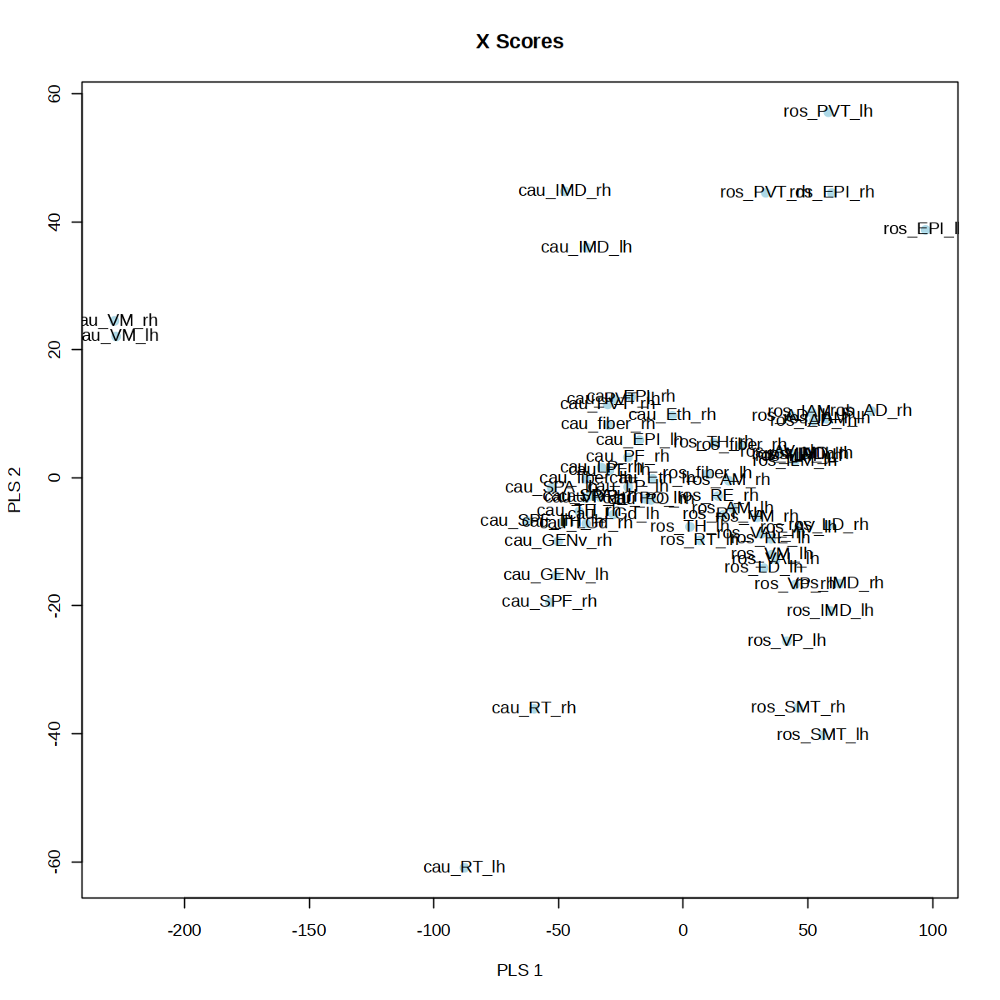

In [940]:
# Plot X Scores
options(repr.plot.width=10,repr.plot.height=10)
plot(X_scores[,1], X_scores[,2], xlab = "PLS 1", ylab = "PLS 2",
     main = "X Scores", pch = 19, col = "lightblue")
text(X_scores[,1], X_scores[,2], labels=rownames(X_scores), cex= 1)

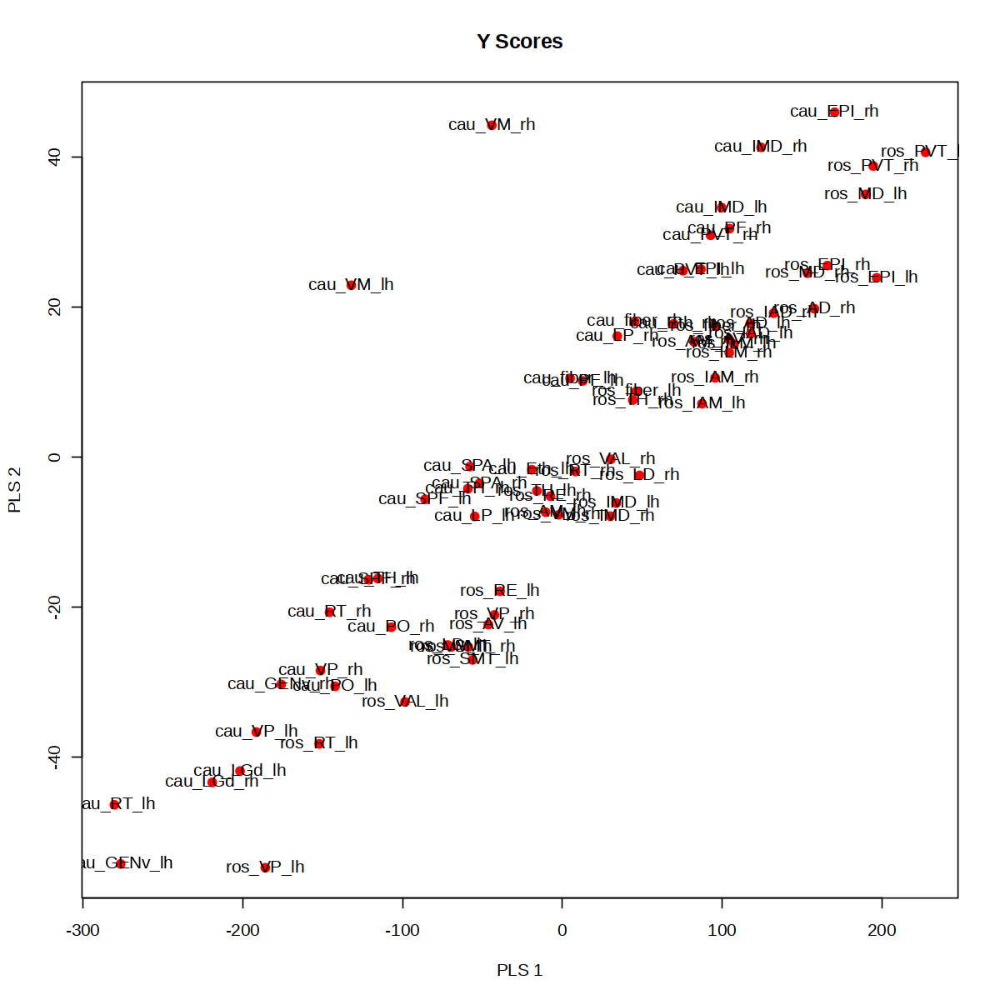

In [941]:
# Plot Y Scores
plot(Y_scores[,1], Y_scores[,2], xlab = "PLS 1", ylab = "PLS 2",
     main = "Y Scores", pch = 19, col = "red")
text(Y_scores[,1], Y_scores[,2], labels=rownames(Y_scores), cex= 1)

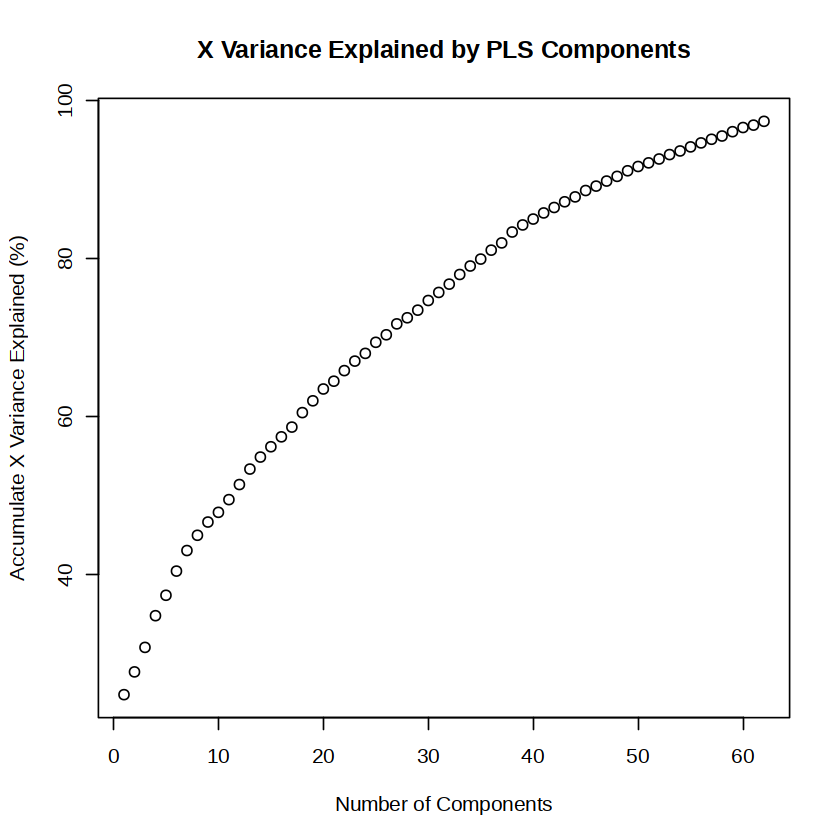

In [757]:
plot(cumsum(explvar(model1)), xlab = "Number of Components",
     ylab = "Accumulate X Variance Explained (%)", main = "X Variance Explained by PLS Components")

In [758]:
R2_values <- R2(model1, estimate = "train")

# The R2_values object contains the proportion of variance explained by each component
# We are interested in the cumulative variance explained
#cumulative_R2 <- cumsum(R2_values$val[1,])

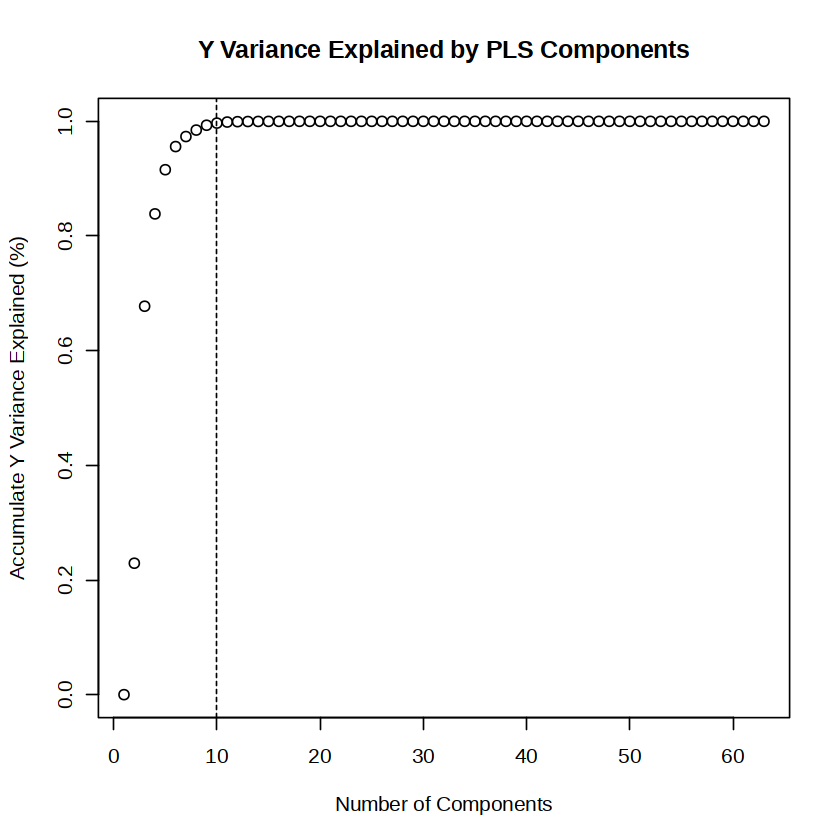

In [761]:
plot(R2_values$val, xlab = "Number of Components",
     ylab = "Accumulate Y Variance Explained (%)", main = "Y Variance Explained by PLS Components")
abline(v = 10, col = "black", lty = 2)

In [766]:
X_scores <- scores(model1)
Y_scores <- Yscores(model1)

In [902]:
PLS1 <- data.frame(x=ofmri$ofmri_activation,y=X_scores[,'Comp 1'])
PLS1$region <- rownames(PLS1)
cor.test(PLS1$x,PLS1$y)

`geom_smooth()` using formula = 'y ~ x'


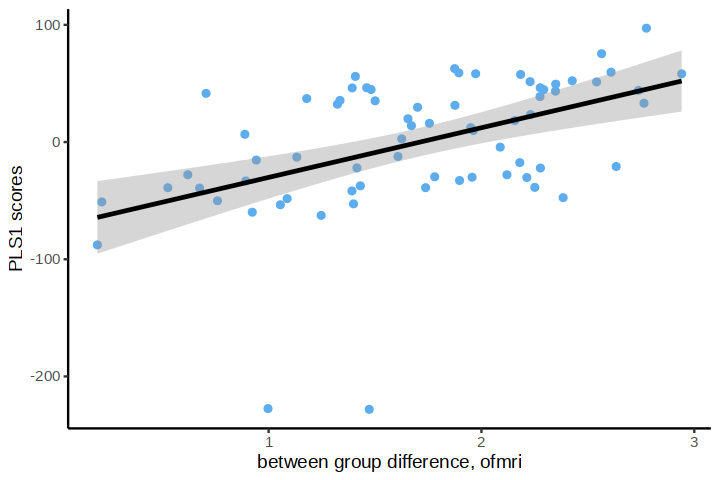

In [916]:
options(repr.plot.width=6,repr.plot.height=4)
ggplot(PLS1,aes(x=x,y=y))+geom_point(color='steelblue2')+
geom_smooth(color="black",method="lm",se=TRUE)+
xlab('between group difference, ofmri')+
ylab('PLS1 scores')+
theme_classic()

In [942]:
PLS2 <- data.frame(x=ofmri$ofmri_activation,y=X_scores[,'Comp 2'])
PLS2$region <- rownames(PLS2)

In [943]:
cor.test(PLS2$x,PLS2$y)


	Pearson's product-moment correlation

data:  PLS2$x and PLS2$y
t = 7.4327, df = 68, p-value = 2.345e-10
alternative hypothesis: true correlation is not equal to 0
95 percent confidence interval:
 0.5156666 0.7815395
sample estimates:
      cor 
0.6695165 


`geom_smooth()` using formula = 'y ~ x'


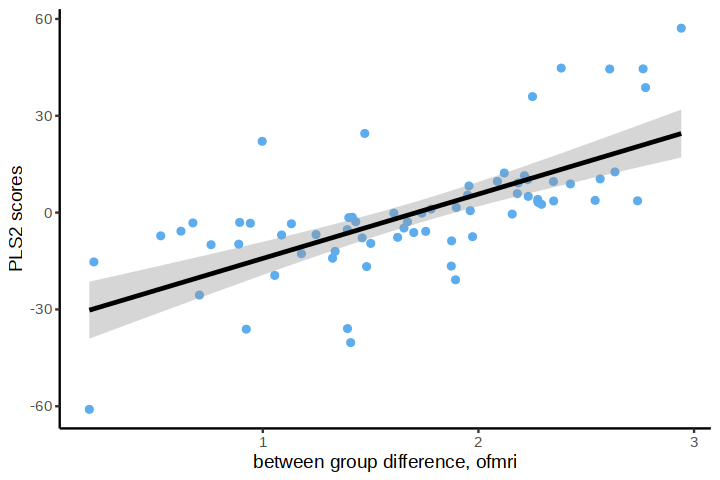

In [944]:
options(repr.plot.width=6,repr.plot.height=4)
ggplot(PLS2,aes(x=x,y=y))+geom_point(color='steelblue2')+
geom_smooth(color="black",method="lm",se=TRUE)+
xlab('between group difference, ofmri')+
ylab('PLS2 scores')+
theme_classic()

In [945]:
PLS3 <- data.frame(x=ofmri$ofmri_activation,y=X_scores[,'Comp 3'])
PLS3$region <- rownames(PLS3)

In [946]:
cor.test(PLS3$x,PLS3$y)


	Pearson's product-moment correlation

data:  PLS3$x and PLS3$y
t = 3.613, df = 68, p-value = 0.0005752
alternative hypothesis: true correlation is not equal to 0
95 percent confidence interval:
 0.1836510 0.5814523
sample estimates:
      cor 
0.4013074 


`geom_smooth()` using formula = 'y ~ x'


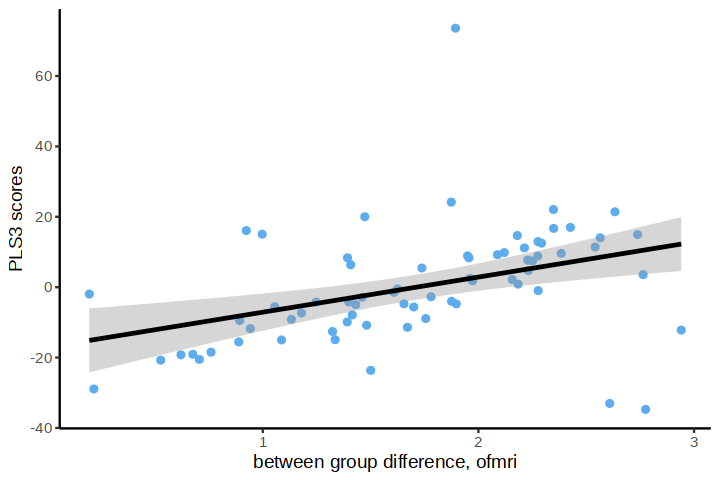

In [947]:
options(repr.plot.width=6,repr.plot.height=4)
ggplot(PLS3,aes(x=x,y=y))+geom_point(color='steelblue2')+
geom_smooth(color="black",method="lm",se=TRUE)+
xlab('between group difference, ofmri')+
ylab('PLS3 scores')+
theme_classic()

In [948]:
PLS4 <- data.frame(x=ofmri$ofmri_activation,y=X_scores[,'Comp 4'])
PLS4$region <- rownames(PLS4)

In [949]:
cor.test(PLS4$x,PLS4$y)


	Pearson's product-moment correlation

data:  PLS4$x and PLS4$y
t = 2.3828, df = 68, p-value = 0.01998
alternative hypothesis: true correlation is not equal to 0
95 percent confidence interval:
 0.04559833 0.48118516
sample estimates:
     cor 
0.277598 


`geom_smooth()` using formula = 'y ~ x'


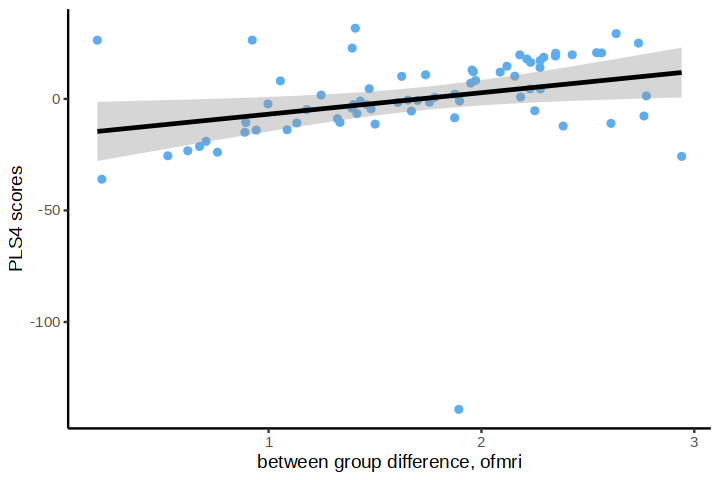

In [950]:
options(repr.plot.width=6,repr.plot.height=4)
ggplot(PLS4,aes(x=x,y=y))+geom_point(color='steelblue2')+
geom_smooth(color="black",method="lm",se=TRUE)+
xlab('between group difference, ofmri')+
ylab('PLS4 scores')+
theme_classic()

In [951]:
PLS5 <- data.frame(x=ofmri$ofmri_activation,y=X_scores[,'Comp 5'])
PLS5$region <- rownames(PLS5)

In [952]:
cor.test(PLS5$x,PLS5$y)


	Pearson's product-moment correlation

data:  PLS5$x and PLS5$y
t = 1.6911, df = 68, p-value = 0.09539
alternative hypothesis: true correlation is not equal to 0
95 percent confidence interval:
 -0.03576482  0.41622341
sample estimates:
      cor 
0.2008975 


`geom_smooth()` using formula = 'y ~ x'


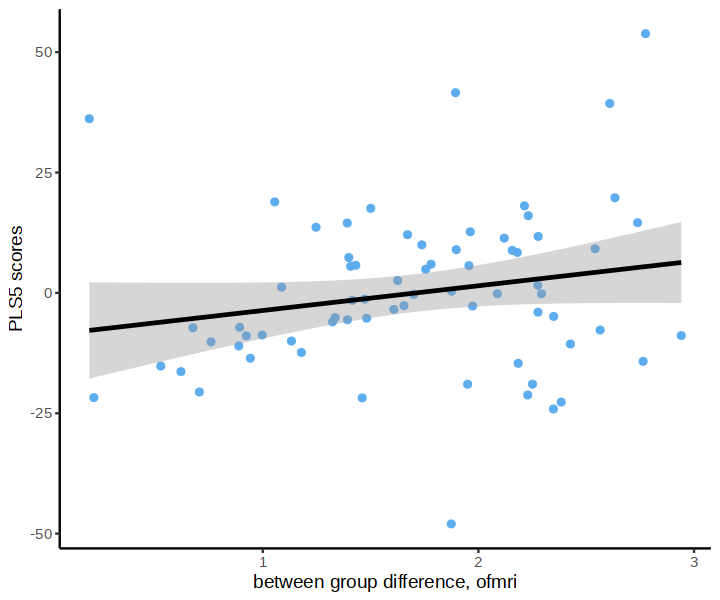

In [953]:
options(repr.plot.width=6,repr.plot.height=5)
ggplot(PLS5,aes(x=x,y=y))+geom_point(color='steelblue2')+
geom_smooth(color="black",method="lm",se=TRUE)+
xlab('between group difference, ofmri')+
ylab('PLS5 scores')+
theme_classic()

In [954]:
X_loading.weights <- model1$loading.weights

In [958]:
X_loading.weights[,'Comp 1'][order(X_loading.weights[,'Comp 1'])]

Nek7          Polr3d        Arhgap12   D430041D05Rik            Rpa1 
  -2.063951e-02   -1.930439e-02   -1.895182e-02   -1.887514e-02   -1.877124e-02 
          Birc2         Ccdc115         Plekhh1             Jup           Gstm7 
  -1.868647e-02   -1.863486e-02   -1.844716e-02   -1.823729e-02   -1.804992e-02 
        B4galt3           Wipi1          Parp10            Myrf          Polr3e 
  -1.793739e-02   -1.779467e-02   -1.771104e-02   -1.768327e-02   -1.767336e-02 
        Morf4l2            Mrs2          Zfp787         Gm26777           Kmt5a 
  -1.766058e-02   -1.762268e-02   -1.759170e-02   -1.755691e-02   -1.754007e-02 
          Fbln5        Slc25a38          Kcnip4          Shisa9          Lgals8 
  -1.748690e-02   -1.742364e-02   -1.741910e-02   -1.740485e-02   -1.740376e-02 
          Trnt1           Rad9a          Gm8773          Mgat4b           Olfm1 
  -1.733991e-02   -1.732153e-02   -1.724278e-02   -1.723476e-02   -1.720342e-02 
          Vamp3          Tspan2           Arpc5         Ccdc90b           Rsbn1 
  -1.717048e-02   -1.716834e-02   -1.715760e-02   -1.713513e-02   -1.709667e-02 
         Opalin           Med20            Ola1           Sumo1         B3galt6 
  -1.708692e-02   -1.700939e-02   -1.700032e-02   -1.693648e-02   -1.693233e-02 
         R3hdm1          Ints11        Rps19bp1          Capn10           Morn4 
  -1.691600e-02   -1.691366e-02   -1.686108e-02   -1.684440e-02   -1.682443e-02 
           Hey1            Fa2h           Frmd5          Usp6nl           Prr13 
  -1.678195e-02   -1.676763e-02   -1.675507e-02   -1.674884e-02   -1.674155e-02 
         Zbtb22         Smarcd1          Borcs5         Ube2d2a          Zfp141 
  -1.670804e-02   -1.669435e-02   -1.667791e-02   -1.667478e-02   -1.666490e-02 
          Lrtm2        Prickle2          Maneal  X1700001G11Rik            Pura 
  -1.665918e-02   -1.665875e-02   -1.662684e-02   -1.660200e-02   -1.656037e-02 
          Frmd8           Gng10          Trim23           Grwd1           Bcl7c 
  -1.654949e-02   -1.653994e-02   -1.652837e-02   -1.651768e-02   -1.650982e-02 
       Arhgef11           Cntn2           Sntb1          Tspan6           Klhl8 
  -1.647123e-02   -1.643675e-02   -1.642221e-02   -1.641485e-02   -1.641067e-02 
         Zfp706        Tmem184b          Mad2l2         Hcfc1r1          Kctd13 
  -1.640762e-02   -1.638227e-02   -1.637405e-02   -1.635629e-02   -1.633920e-02 
          Sirt4          Necab1          Pithd1         Dclre1b         Pak1ip1 
  -1.632389e-02   -1.630153e-02   -1.630083e-02   -1.629444e-02   -1.628986e-02 
            Taz            Nrn1          Cluap1           Srsf7          Zswim1 
  -1.627803e-02   -1.627099e-02   -1.624765e-02   -1.624181e-02   -1.623959e-02 
  D130058E05Rik           Ash2l           Copb2           Cryab         Mettl16 
  -1.623394e-02   -1.622600e-02   -1.621949e-02   -1.621083e-02   -1.619882e-02 
            Sri           Sash1            Maob           Atat1           Mrgbp 
  -1.619267e-02   -1.614844e-02   -1.613532e-02   -1.611279e-02   -1.611115e-02 
          Nrsn1           Pcsk6           Smap1         Gm14295  X1500012K07Rik 
  -1.610257e-02   -1.609406e-02   -1.609015e-02   -1.608554e-02   -1.607085e-02 
           Cyld            Stx8          Ppp2cb         Tmem186           Dclk2 
  -1.606750e-02   -1.605781e-02   -1.604352e-02   -1.600049e-02   -1.599908e-02 
         Dtnbp1           Rflnb           Csf1r           Adrm1            Cd82 
  -1.599597e-02   -1.599480e-02   -1.596957e-02   -1.595600e-02   -1.595548e-02 
         Snhg14            Rhou         Gal3st1   A430005L14Rik            Dtx3 
  -1.594495e-02   -1.594124e-02   -1.593983e-02   -1.593663e-02   -1.590060e-02 
         Tubb4a           Limd2        Tmem184c           Pde4b          Atf7ip 
  -1.589229e-02   -1.585908e-02   -1.585661e-02   -1.583993e-02   -1.579913e-02 
         Pik3cb         Tspan15          Gabra2            Mpp3         Dnajc12 
  -1.579614e-02   -1.579459e-02   -1.57719

In [962]:
pls1_w <- X_loadings[,'Comp 1'][rev(order(X_loadings[,'Comp 1']))]
pls1_w <- data.frame(pls1_w)
colnames(pls1_w) <- 'weight'
genes <- rownames(pls1_w)[pls1_w$weight > 0]

In [978]:
write.csv(genes,'../folder/PrLmodel1/PrL_model1_PLS1_positiveweightgenes.csv')

In [974]:
length(pls1_w[pls1_w$weight < 0,])

[1] 15485

In [979]:
pls2_w <- X_loadings[,'Comp 2'][rev(order(X_loadings[,'Comp 2']))]
pls2_w <- data.frame(pls2_w)
colnames(pls2_w) <- 'weight'
genes2 <- rownames(pls2_w)[pls2_w$weight > 0]

In [981]:
length(genes2)

[1] 10631

In [986]:
write.csv(genes2,'../folder/PrLmodel1/PrL_model1_PLS2_positiveweightgenes.csv')

In [982]:
pls3_w <- X_loadings[,'Comp 3'][rev(order(X_loadings[,'Comp 3']))]
pls3_w <- data.frame(pls3_w)
colnames(pls3_w) <- 'weight'
genes3 <- rownames(pls3_w)[pls3_w$weight > 0]

In [987]:
write.csv(genes3,'../folder/PrLmodel1/PrL_model1_PLS3_positiveweightgenes.csv')

In [988]:
length(genes3)

[1] 8636

In [985]:
length(intersect(genes,genes2))

[1] 562

In [990]:
genes12 <- intersect(genes,genes2)

In [991]:
write.csv(genes12,'../folder/PrLmodel1/PrL_model1_PLS1+2_positiveweightgenes.csv')

In [983]:
intersect(genes3,intersect(genes,genes2))

[1] "Plcb2"          "E130102H24Rik"  "Agpat2"         "Snx29"         
  [5] "Gm14410"        "Gm48780"        "X4833422C13Rik" "Fos"           
  [9] "Ceacam1"        "X9130019P16Rik" "Tbc1d2"         "Dusp4"         
 [13] "Cyp4x1os"       "Pcdhb21"        "Galm"           "Klf10"         
 [17] "Scgb3a1"        "Ehd2"           "Nradd"          "Npas4"         
 [21] "Gm9484"         "E2f7"           "Crb2"           "Maff"          
 [25] "Gm4189"         "Ncapg2"         "Cbr3"           "Mall"          
 [29] "Gpr3"           "Krt77"          "Gm7854"         "Tex11"         
 [33] "Tbr1"           "Bcl6b"          "X6030407O03Rik" "Rexo5"         
 [37] "Pqlc3"          "C77080"         "Rfx2"           "Traf3ip3"      
 [41] "Col27a1"        "Acot4"          "X9330185C12Rik" "Cxcr4"         
 [45] "Efhc2"          "Pgghg"          "Gpr160"         "H2.Eb1"        
 [49] "Crabp2"         "Sebox"          "Zfat"           "Pgm5"          
 [53] "Gm26532"        "X4930447N08Rik" "Gpr35"          "Aspdh"         
 [57] "Nr4a1"          "Socs3"          "Gm20559"        "Icam4"         
 [61] "Prtg"           "X5430427O19Rik" "Hvcn1"          "Rcvrn"         
 [65] "Slc13a4"        "Hspg2"          "Gm20743"        "Frmpd1os"      
 [69] "Slc25a21"       "Gm16168"        "Gm32568"        "Pla2r1"        
 [73] "D030068K23Rik"  "Wfdc2"          "Gm14051"        "Gm9017"        
 [77] "Nsl1"           "X9430038I01Rik" "Trib1"          "Itga5"         
 [81] "Lrrn4"          "Gm47113"        "Arr3"           "Tspan2os"      
 [85] "Slc6a12"        "Gm44777"        "X4930503L19Rik" "Gm42738"       
 [89] "Tdrd1"          "X1700010I14Rik" "Aox4"           "Kcnk5"         
 [93] "X4933412O06Rik" "Gm15441"        "Drc7"           "Adam4"         
 [97] "X2610507I01Rik" "X2810457G06Rik" "Ttc16"          "X2900040C04Rik"
[101] "Rad51b"         "Hpn"            "Gm28756"        "Gm16551"       
[105] "A230065N10Rik"  "Plb1"           "Aoc3"           "Ptger4"        
[109] "Gm2762"         "Haus5"          "Gm15587"        "Slc38a4"       
[113] "Nlrc3"          "Sema3g"         "Arhgef33"       "Birc3"         
[117] "Gm37640"        "Zmiz1os1"       "Gm28535"        "Gm9844"        
[121] "B130046B21Rik"  "Foxf1"          "Gm33228"        "Gucy2c"        
[125] "Hrc"            "Omd"            "X4933424G06Rik" "Fam227b"       
[129] "Nfatc2ip"       "Aldh1l2"        "D330041H03Rik"  "X1810041H14Rik"
[133] "Ulk4"           "H2.Q4"          "Lrrc6"          "Gm5086"        
[137] "Rhobtb1"        "Pilra"          "Prr19"          "Gm43154"       
[141] "Spata19"        "Rbp4"           "Col17a1"        "Itprid1"       
[145] "Cd74"           "Pln"            "Gpnmb"          "Rad54l"        
[149] "Itgb1bp2"       "Tcea3"          "Gm12992"        "Icam2"         
[153] "Lama5"          "Gm11730"        "Gm15396"        "Gm19744"       
[157] "Kif26a"         "Capn11"         "Maats1"         "Gm15559"       
[161] "Tead3"          "Milr1"          "Clec4n"         "Mgl2"          
[165] "Hba.a2"         "Calml4"         "Naip2"          "Fas"           
[169] "Stc2"           "Myct1"          "Thbs1"          "Gm20655"       
[173] "Ckap2l"         "Gm49463"        "Gm40518"        "Dynlt1c"       
[177] "Cacng6"         "X1700001C02Rik" "Ifi207"         "Themis2"       
[181] "Gm14322"        "Neu3"           "Hist1h4j"       "Cd72"          
[185] "Lmntd2"         "Pard6b"         "Fam90a1b.1"     "Gm30340"       
[189] "Cndp1"          "Stoml3"         "X2210409D07Rik" "Gm29367"       
[193] "Mfsd2b"         "Tead4"          "Hba.a1"         "Foxl2"         
[197] "Gabrb2"         "Upb1"           "Tgtp1"          "Des"           
[201] "Gm7967"         "E330011O21Rik"  "X5730414N17Rik" "Ddit4l"        
[205] "Col8a2"         "Ushbp1"         "Scarf1"         "Dcstamp"       
[209] "Spata3"         "Prss16"         "Gm44647"        "Gm35569"       
[213] "Tslp"           "Fat4"           "Gm35290"        "Wdr95"         
[217] 

In [992]:
mri <- cbind(ofmri,ofmri_10x)

In [994]:
library(pheatmap)

In [1004]:
rownames(mri)

[1] "ros_AD_lh"    "ros_AD_rh"    "ros_AM_lh"    "ros_AM_rh"    "ros_AV_lh"   
 [6] "ros_AV_rh"    "ros_EPI_lh"   "ros_EPI_rh"   "ros_fiber_lh" "ros_fiber_rh"
[11] "ros_IAD_lh"   "ros_IAD_rh"   "ros_IAM_lh"   "ros_IAM_rh"   "ros_ILM_lh"  
[16] "ros_ILM_rh"   "ros_IMD_lh"   "ros_IMD_rh"   "ros_LD_lh"    "ros_LD_rh"   
[21] "ros_MD_lh"    "ros_MD_rh"    "ros_PVT_lh"   "ros_PVT_rh"   "ros_RE_lh"   
[26] "ros_RE_rh"    "ros_RT_lh"    "ros_RT_rh"    "ros_SMT_lh"   "ros_SMT_rh"  
[31] "ros_TH_lh"    "ros_TH_rh"    "ros_VAL_lh"   "ros_VAL_rh"   "ros_VM_lh"   
[36] "ros_VM_rh"    "ros_VP_lh"    "ros_VP_rh"    "cau_EPI_lh"   "cau_EPI_rh"  
[41] "cau_Eth_lh"   "cau_Eth_rh"   "cau_fiber_lh" "cau_fiber_rh" "cau_GENv_lh" 
[46] "cau_GENv_rh"  "cau_IMD_lh"   "cau_IMD_rh"   "cau_LGd_lh"   "cau_LGd_rh"  
[51] "cau_LP_lh"    "cau_LP_rh"    "cau_PF_lh"    "cau_PF_rh"    "cau_PO_lh"   
[56] "cau_PO_rh"    "cau_PVT_lh"   "cau_PVT_rh"   "cau_RT_lh"    "cau_RT_rh"   
[61] "cau_SPA_lh"   "cau_SPA_rh"   "cau_SPF_lh"   "cau_SPF_rh"   "cau_TH_lh"   
[66] "cau_TH_rh"    "cau_VM_lh"    "cau_VM_rh"    "cau_VP_lh"    "cau_VP_rh"

In [1003]:
mri

,ofmri_activation,ofmri_10x_activation
,<dbl>,<dbl>
ros_AD_lh,2.3477958,2.5426690
ros_AD_rh,2.5645561,2.9128609
ros_AM_lh,1.6547553,1.2730995
ros_AM_rh,2.1567650,1.5515502
ros_AV_lh,1.4610273,1.6947222
ros_AV_rh,2.2751901,2.3642892
ros_EPI_lh,2.7750975,2.6541247
ros_EPI_rh,2.6088702,2.4379732
ros_fiber_lh,1.9622037,1.9975624


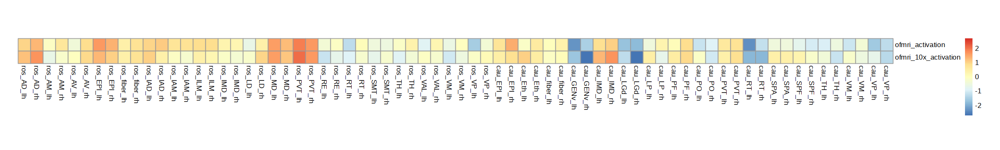

In [1008]:
mri <- cbind(ofmri,ofmri_10x)
options(repr.plot.width=20,repr.plot.height=3)
pheatmap(t(mri),cluster_rows = F,cluster_cols = F,cellwidth = 18,cellheight = 18,scale='row')

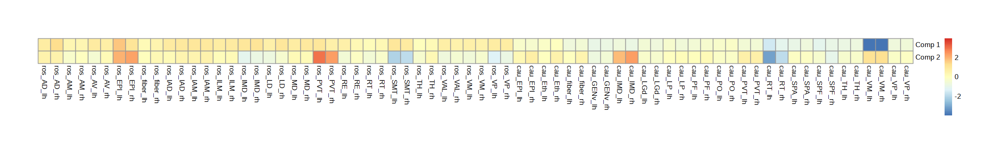

In [1015]:
options(repr.plot.width=20,repr.plot.height=3)
pheatmap(t(X_scores[,c('Comp 1','Comp 2')]),
         cluster_rows = F,cluster_cols = F,scale='row',cellwidth = 18,cellheight = 18)

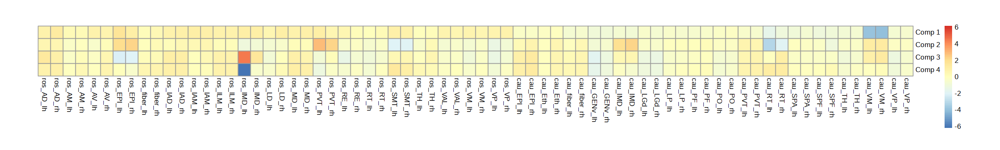

In [1017]:
options(repr.plot.width=20,repr.plot.height=3)
pheatmap(t(X_scores[,c('Comp 1','Comp 2','Comp 3','Comp 4')]),
         cluster_rows = F,cluster_cols = F,scale='row',cellwidth = 18,cellheight = 18)

In [1019]:
saveRDS(model1,'../folder/PrLmodel1/PrL_PLS_model_ofmri_activation.rds')

### model2 ofmri_10x_activation

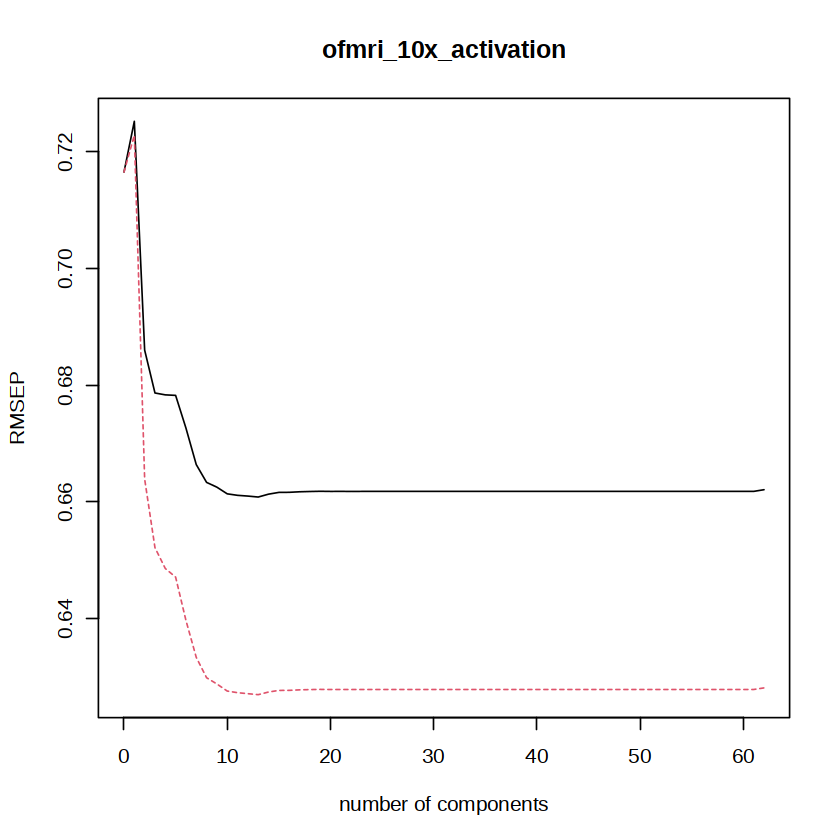

In [752]:
validationplot(model2)

In [753]:
summary(model2)

Data: 	X dimension: 70 16335 
	Y dimension: 70 1
Fit method: kernelpls
Number of components considered: 62

VALIDATION: RMSEP
Cross-validated using 10 random segments.
       (Intercept)  1 comps  2 comps  3 comps  4 comps  5 comps  6 comps
CV          0.7166   0.7253   0.6860   0.6787   0.6784   0.6783   0.6727
adjCV       0.7166   0.7229   0.6639   0.6522   0.6486   0.6471   0.6397
       7 comps  8 comps  9 comps  10 comps  11 comps  12 comps  13 comps
CV      0.6664   0.6634   0.6625    0.6614    0.6611    0.6610    0.6608
adjCV   0.6334   0.6299   0.6288    0.6276    0.6273    0.6271    0.6270
       14 comps  15 comps  16 comps  17 comps  18 comps  19 comps  20 comps
CV       0.6613    0.6616    0.6617    0.6617    0.6618    0.6618    0.6618
adjCV    0.6274    0.6277    0.6277    0.6278    0.6278    0.6279    0.6279
       21 comps  22 comps  23 comps  24 comps  25 comps  26 comps  27 comps
CV       0.6618    0.6618    0.6618    0.6618    0.6618    0.6618    0.6618
adjCV    0.627

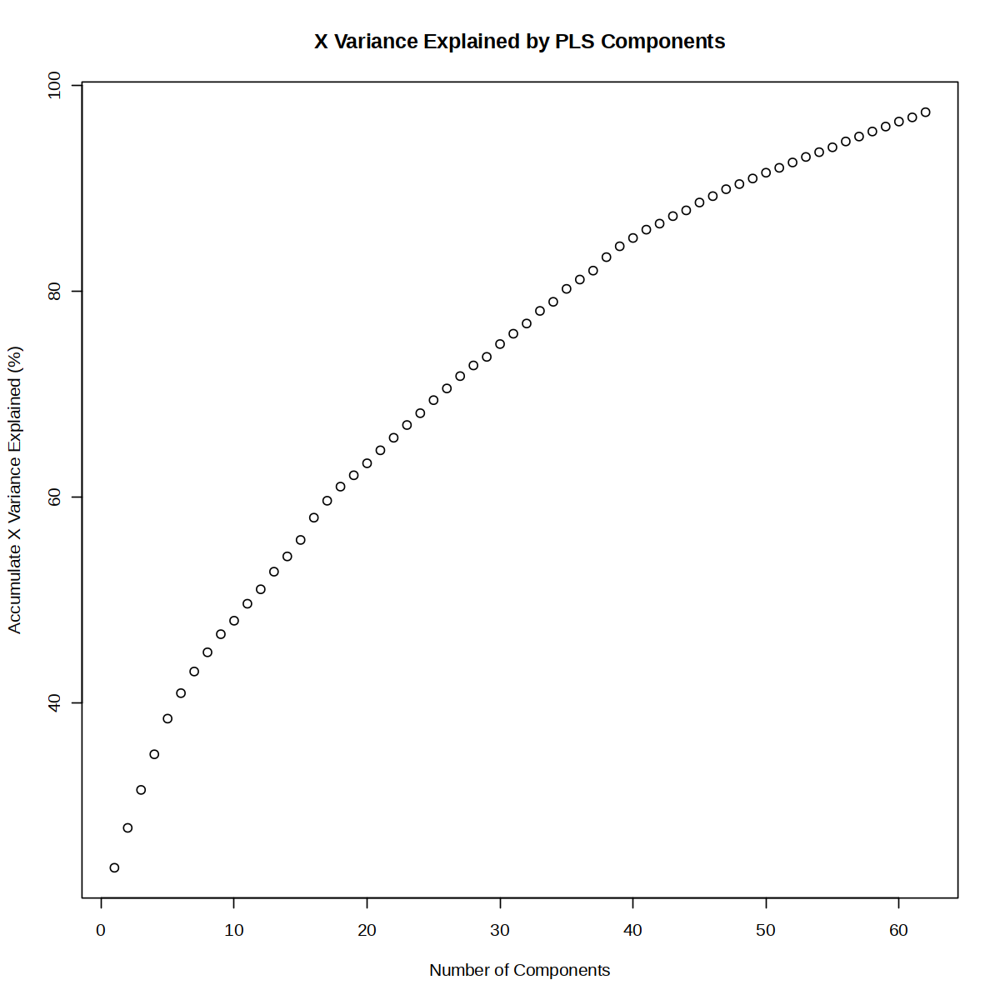

In [1023]:
plot(cumsum(explvar(model2)), xlab = "Number of Components",
     ylab = "Accumulate X Variance Explained (%)", main = "X Variance Explained by PLS Components")

In [1024]:
R2_values <- R2(model2, estimate = "train")

# The R2_values object contains the proportion of variance explained by each component
# We are interested in the cumulative variance explained
#cumulative_R2 <- cumsum(R2_values$val[1,])

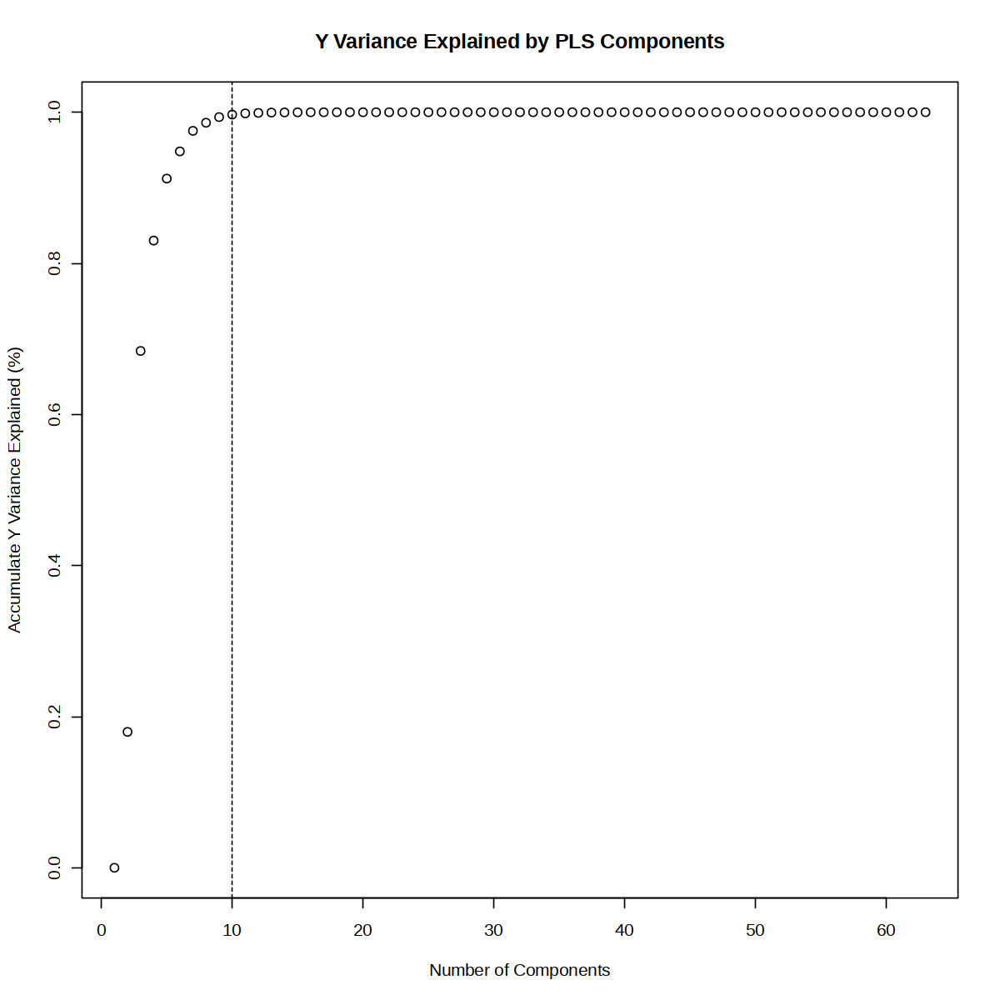

In [1025]:
plot(R2_values$val, xlab = "Number of Components",
     ylab = "Accumulate Y Variance Explained (%)", main = "Y Variance Explained by PLS Components")
abline(v = 10, col = "black", lty = 2)

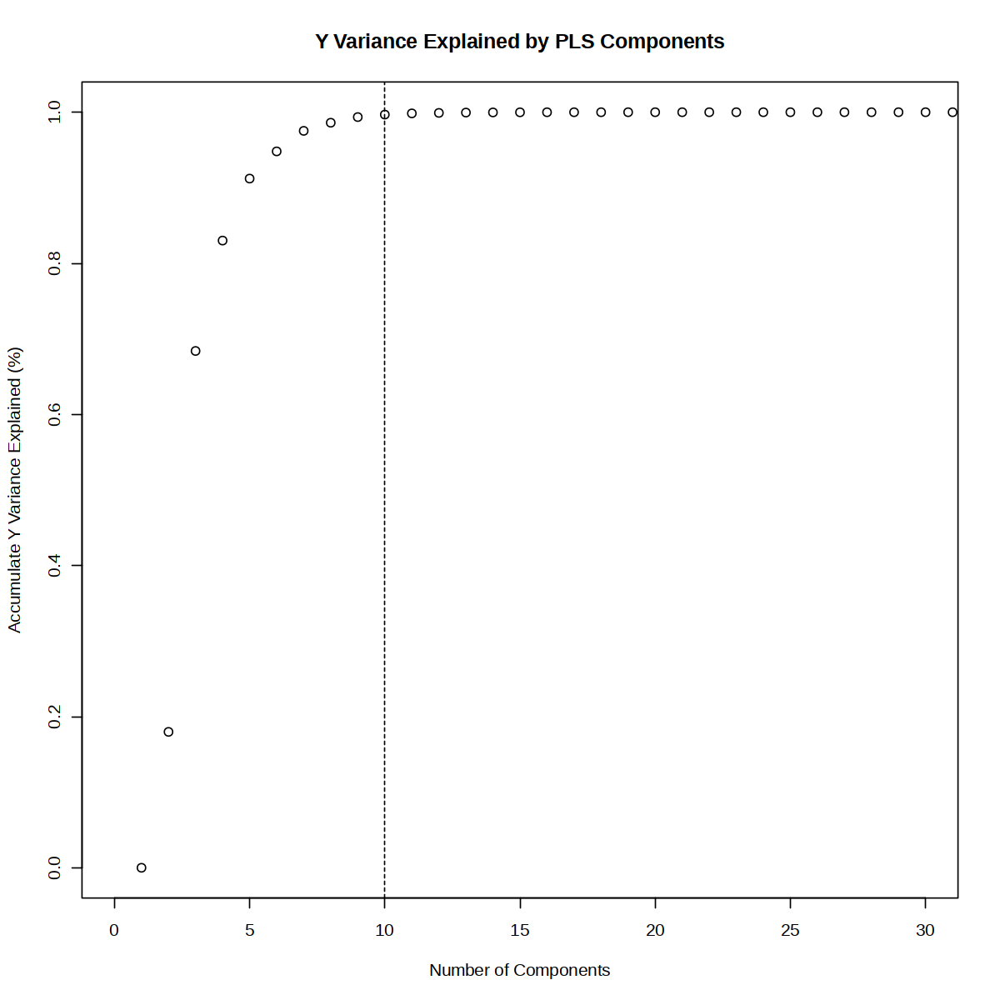

In [1026]:
plot(R2_values$val, xlab = "Number of Components",xlim=c(0,30),
     ylab = "Accumulate Y Variance Explained (%)", main = "Y Variance Explained by PLS Components")
abline(v = 10, col = "black", lty = 2)

In [1020]:
X_scores <- scores(model2,type='X')
Y_scores <- Yscores(model2)

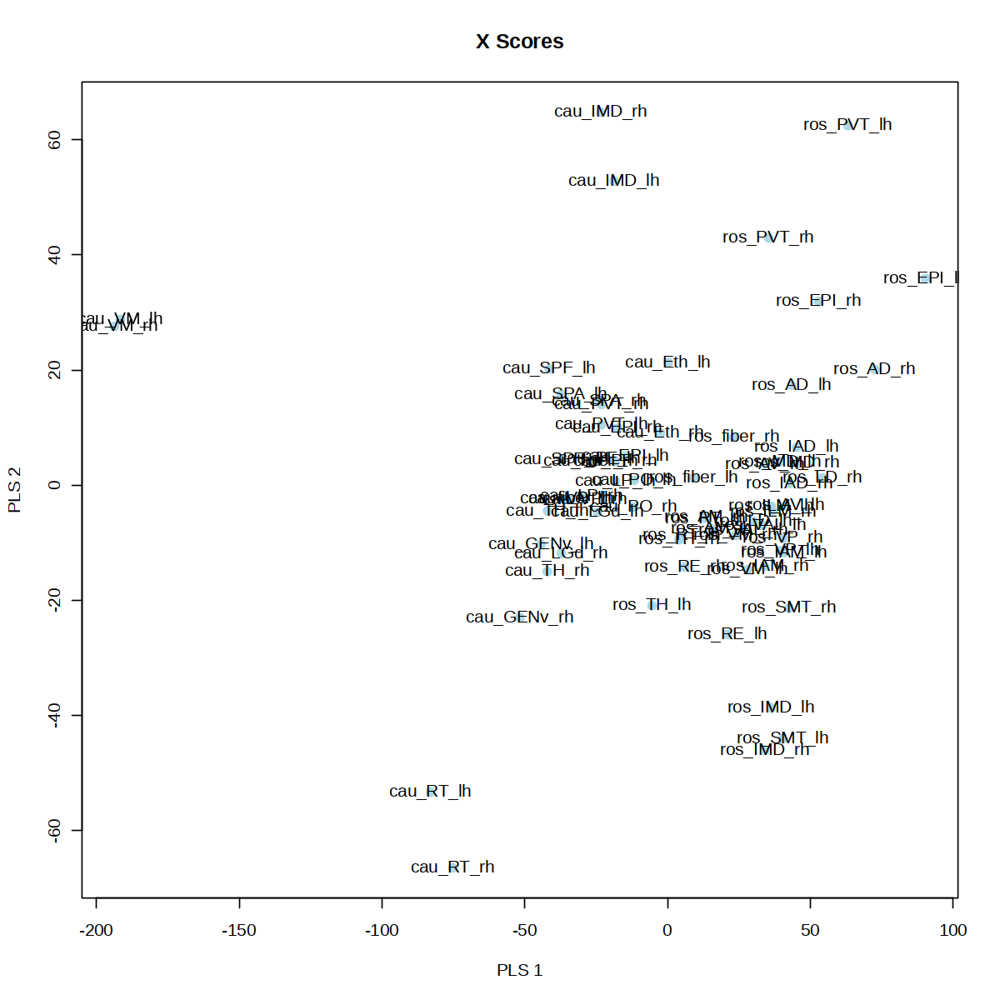

In [1027]:
# Plot X Scores
options(repr.plot.width=10,repr.plot.height=10)
plot(X_scores[,1], X_scores[,2], xlab = "PLS 1", ylab = "PLS 2",
     main = "X Scores", pch = 19, col = "lightblue")
text(X_scores[,1], X_scores[,2], labels=rownames(X_scores), cex= 1)

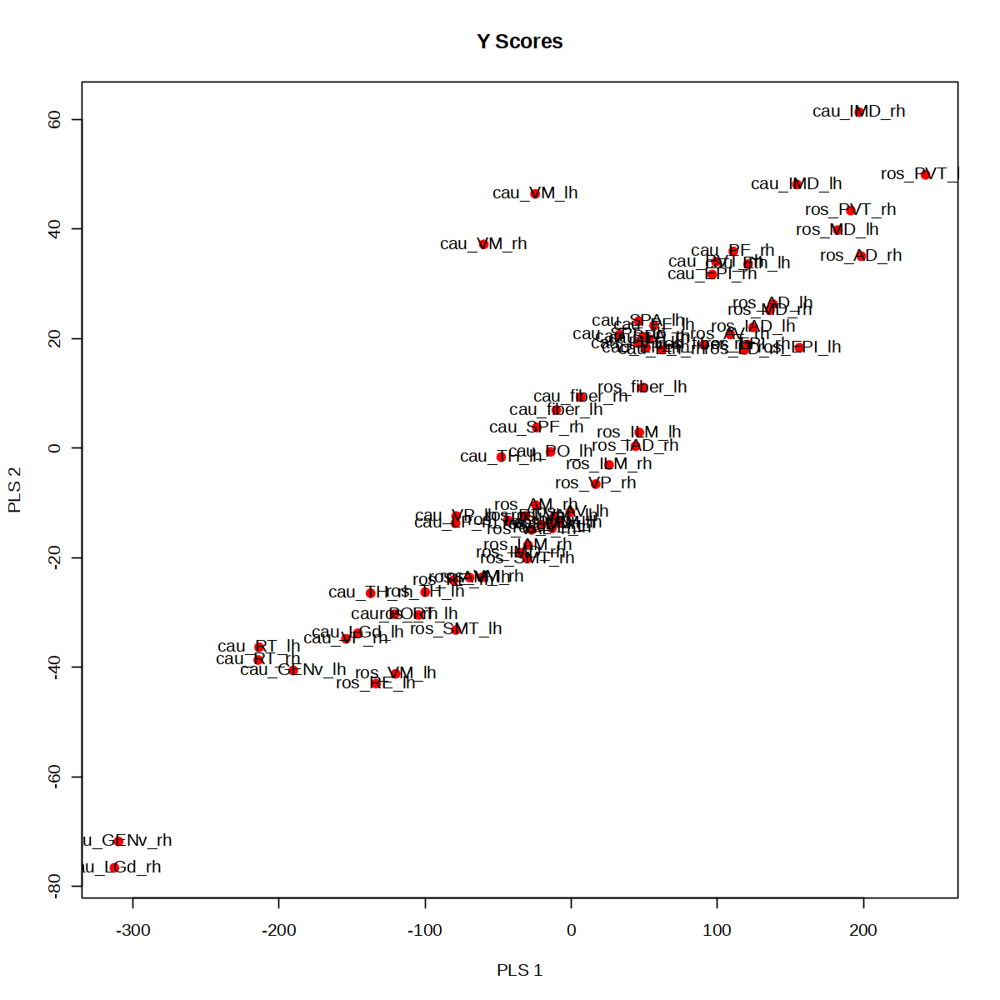

In [1028]:
# Plot Y Scores
plot(Y_scores[,1], Y_scores[,2], xlab = "PLS 1", ylab = "PLS 2",
     main = "Y Scores", pch = 19, col = "red")
text(Y_scores[,1], Y_scores[,2], labels=rownames(Y_scores), cex= 1)

In [1029]:
PLS1 <- data.frame(x=ofmri_10x$ofmri_10x_activation,y=X_scores[,'Comp 1'])
PLS1$region <- rownames(PLS1)

In [1030]:
cor.test(PLS1$x,PLS1$y)


	Pearson's product-moment correlation

data:  PLS1$x and PLS1$y
t = 3.8617, df = 68, p-value = 0.0002535
alternative hypothesis: true correlation is not equal to 0
95 percent confidence interval:
 0.2100544 0.5993446
sample estimates:
      cor 
0.4240962 


`geom_smooth()` using formula = 'y ~ x'


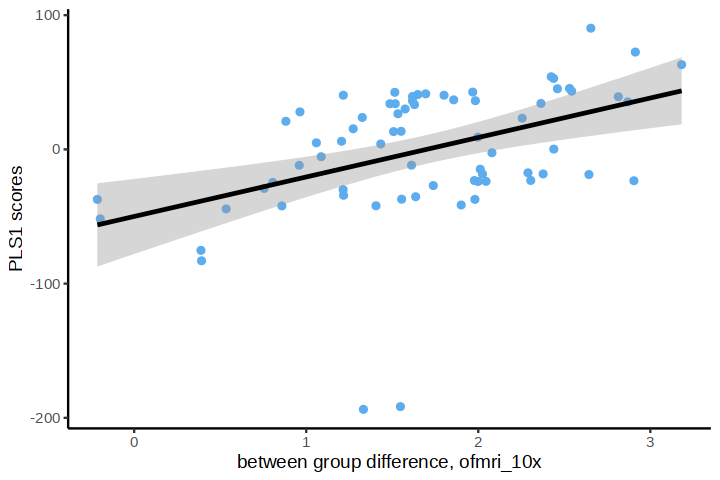

In [1032]:
options(repr.plot.width=6,repr.plot.height=4)
ggplot(PLS1,aes(x=x,y=y))+geom_point(color='steelblue2')+
geom_smooth(color="black",method="lm",se=TRUE)+
xlab('between group difference, ofmri_10x')+
ylab('PLS1 scores')+
theme_classic()

In [1033]:
PLS2 <- data.frame(x=ofmri_10x$ofmri_10x_activation,y=X_scores[,'Comp 2'])
PLS2$region <- rownames(PLS2)

In [1034]:
cor.test(PLS2$x,PLS2$y)


	Pearson's product-moment correlation

data:  PLS2$x and PLS2$y
t = 8.315, df = 68, p-value = 5.871e-12
alternative hypothesis: true correlation is not equal to 0
95 percent confidence interval:
 0.5701944 0.8098890
sample estimates:
     cor 
0.710037 


`geom_smooth()` using formula = 'y ~ x'


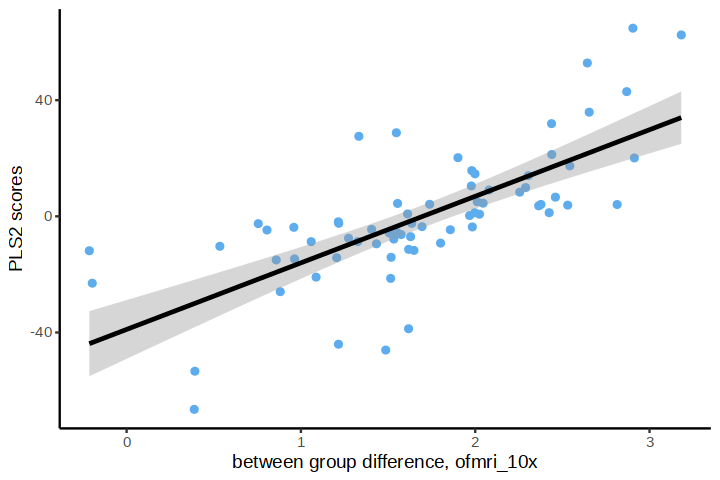

In [1035]:
options(repr.plot.width=6,repr.plot.height=4)
ggplot(PLS2,aes(x=x,y=y))+geom_point(color='steelblue2')+
geom_smooth(color="black",method="lm",se=TRUE)+
xlab('between group difference, ofmri_10x')+
ylab('PLS2 scores')+
theme_classic()

In [1036]:
PLS3 <- data.frame(x=ofmri_10x$ofmri_10x_activation,y=X_scores[,'Comp 3'])
PLS3$region <- rownames(PLS3)

In [1037]:
cor.test(PLS3$x,PLS3$y)


	Pearson's product-moment correlation

data:  PLS3$x and PLS3$y
t = 3.4112, df = 68, p-value = 0.001093
alternative hypothesis: true correlation is not equal to 0
95 percent confidence interval:
 0.1618099 0.5663550
sample estimates:
      cor 
0.3822503 


`geom_smooth()` using formula = 'y ~ x'


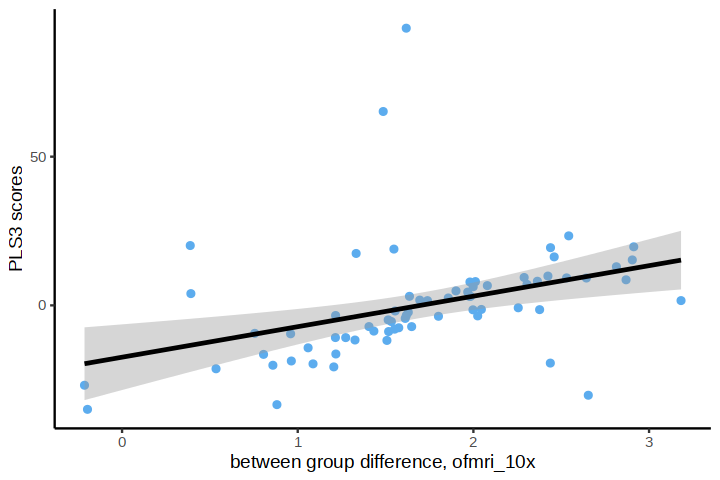

In [1038]:
options(repr.plot.width=6,repr.plot.height=4)
ggplot(PLS3,aes(x=x,y=y))+geom_point(color='steelblue2')+
geom_smooth(color="black",method="lm",se=TRUE)+
xlab('between group difference, ofmri_10x')+
ylab('PLS3 scores')+
theme_classic()

In [1039]:
PLS4 <- data.frame(x=ofmri_10x$ofmri_10x_activation,y=X_scores[,'Comp 4'])
PLS4$region <- rownames(PLS4)

In [1040]:
cor.test(PLS4$x,PLS4$y)


	Pearson's product-moment correlation

data:  PLS4$x and PLS4$y
t = 2.4651, df = 68, p-value = 0.01623
alternative hypothesis: true correlation is not equal to 0
95 percent confidence interval:
 0.05514878 0.48850908
sample estimates:
      cor 
0.2864113 


`geom_smooth()` using formula = 'y ~ x'


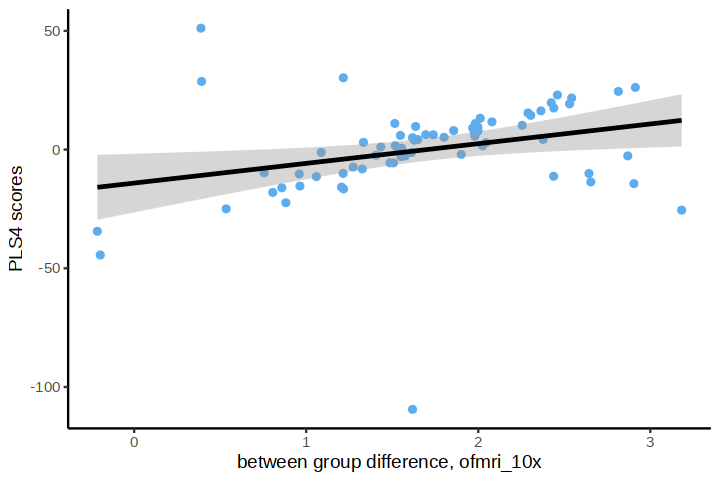

In [1041]:
options(repr.plot.width=6,repr.plot.height=4)
ggplot(PLS4,aes(x=x,y=y))+geom_point(color='steelblue2')+
geom_smooth(color="black",method="lm",se=TRUE)+
xlab('between group difference, ofmri_10x')+
ylab('PLS4 scores')+
theme_classic()

In [1042]:
X_loadings <- loadings(model2)

In [1043]:
pls1_w <- X_loadings[,'Comp 1'][rev(order(X_loadings[,'Comp 1']))]
pls1_w <- data.frame(pls1_w)
colnames(pls1_w) <- 'weight'
genes <- rownames(pls1_w)[pls1_w$weight > 0]

In [1052]:
write.csv(genes,'../folder/PrLmodel2/PrL_model2_PLS1_positiveweightgenes.csv')

In [1053]:
pls2_w <- X_loadings[,'Comp 2'][rev(order(X_loadings[,'Comp 2']))]
pls2_w <- data.frame(pls2_w)
colnames(pls2_w) <- 'weight'
genes2 <- rownames(pls2_w)[pls2_w$weight > 0]

In [1055]:
write.csv(genes2,'../folder/PrLmodel2/PrL_model2_PLS2_positiveweightgenes.csv')

In [1061]:
length(genes2)

[1] 11734

In [1060]:
length(genes)

[1] 829

In [1059]:
length(intersect(genes,genes2))

[1] 515

In [1048]:
X_scores

                   Comp 1      Comp 2     Comp 3       Comp 4      Comp 5
ros_AD_lh      43.4020934  17.3738627  23.371732   21.7202311 -21.0754702
ros_AD_rh      72.5071482  20.1093027  19.696141   26.2024066  -3.3112342
ros_AM_lh      15.3618528  -7.5375023 -10.850672   -7.3616324  -8.6041001
ros_AM_rh      13.4721354  -5.5377930  -8.005441   -2.9688085  -3.2949300
ros_AV_lh      41.3956864  -3.5443466   1.771705    6.2932964 -14.4353244
ros_AV_rh      34.2036653   3.6216042   8.115041   16.3362423   8.4289689
ros_EPI_lh     90.3004334  35.8769760 -30.225512  -13.6250086  31.0524327
ros_EPI_rh     52.8780624  31.9290210 -19.412887  -11.2392164  13.4040622
ros_fiber_lh    9.1468445   1.2557372  -1.498606    9.5176606  18.3817091
ros_fiber_rh   23.2410480   8.3205755  -0.816875   10.2291498  19.2321229
ros_IAD_lh     45.1930388   6.6124477  16.300882   23.0006935   1.9731989
ros_IAD_rh     42.7080806   0.2729382   4.466046    9.0756930  -8.9042038
ros_IAM_lh     40.8902632 -11.7238911 

In [1051]:
saveRDS(model2,'../folder/PrLmodel2/PrL_PLS_model_ofmri_10x_activation.rds')

In [1050]:
write.csv(X_scores,'../folder/PrLmodel2/PrL_model2_Xscores.csv')
write.csv(Y_scores,'../folder/PrLmodel2/PrL_model2_Yscores.csv')

In [1044]:
length(genes)

[1] 829

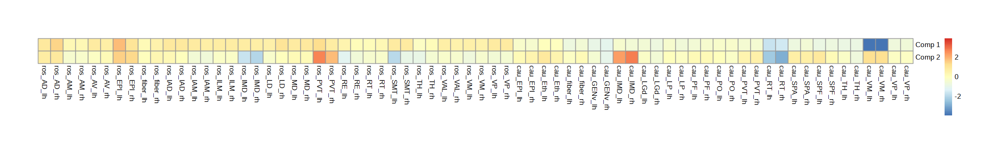

In [1062]:
options(repr.plot.width=20,repr.plot.height=3)
pheatmap(t(X_scores[,c('Comp 1','Comp 2')]),
         cluster_rows = F,cluster_cols = F,scale='row',cellwidth = 18,cellheight = 18)

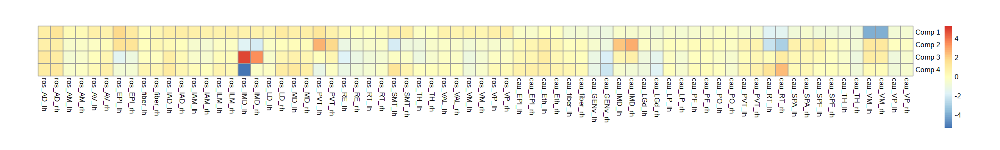

In [1063]:
options(repr.plot.width=20,repr.plot.height=3)
pheatmap(t(X_scores[,c('Comp 1','Comp 2','Comp 3','Comp 4')]),
         cluster_rows = F,cluster_cols = F,scale='row',cellwidth = 18,cellheight = 18)

## region PLS SUB

In [1070]:
Scr <- t(AverageExpression(SUB_con_rostral_th,group.by='nucleus0702',assay='SCT')$SCT)
Scr <- data.frame(Scr)
mri <- SUB_con_rostral_th@meta.data[,c('nucleus0702','ofmri_activation','ofmri_10x_activation')]
ofmri <- aggregate(mri$ofmri_activation, list(mri$nucleus0702), FUN=mean)
ofmri_10x <- aggregate(mri$ofmri_10x_activation, list(mri$nucleus0702), FUN=mean)
rownames(ofmri) <- ofmri$`Group.1`
ofmri$`Group.1` <- NULL
colnames(ofmri) <- 'ofmri_activation'
rownames(ofmri_10x) <- ofmri_10x$`Group.1`
ofmri_10x$`Group.1` <- NULL
colnames(ofmri_10x) <- 'ofmri_10x_activation'
Scr <- cbind(ofmri,ofmri_10x,Scr)

In [1071]:
Str <- t(AverageExpression(SUB_test_rostral_th,group.by='nucleus0702',assay='SCT')$SCT)
Str <- data.frame(Str)
mri <- SUB_test_rostral_th@meta.data[,c('nucleus0702','ofmri_activation','ofmri_10x_activation')]
ofmri <- aggregate(mri$ofmri_activation, list(mri$nucleus0702), FUN=mean)
ofmri_10x <- aggregate(mri$ofmri_10x_activation, list(mri$nucleus0702), FUN=mean)
rownames(ofmri) <- ofmri$`Group.1`
ofmri$`Group.1` <- NULL
colnames(ofmri) <- 'ofmri_activation'
rownames(ofmri_10x) <- ofmri_10x$`Group.1`
ofmri_10x$`Group.1` <- NULL
colnames(ofmri_10x) <- 'ofmri_10x_activation'
Str <- cbind(ofmri,ofmri_10x,Str)

In [1085]:
dim(Scr)

[1]    38 18578

In [1086]:
dim(Str)

[1]    38 18578

In [1082]:
nus <- rownames(Scr)

In [1083]:
Str <- Str[nus,]

In [1084]:
rownames(Str) <- nus
Str[is.na(Str)] <- 0

In [1075]:
setdiff(rownames(Scr),rownames(Str))

[1] "ros_SMT_lh" "ros_SMT_rh"

In [1087]:
length(overlap)

[1] 18578

In [1089]:
Sr <- Str-Scr

In [1072]:
overlap <- intersect(colnames(Scr),colnames(Str))

Scr <- Scr[,overlap]
Str <- Str[,overlap]

Sr <- Str-Scr

ERROR: Error in Ops.data.frame(Str, Scr): ‘-’ only defined for equally-sized data frames


In [1091]:
head(Sr)

,ofmri_activation,ofmri_10x_activation,Xkr4,Gm19938,Sox17,Mrpl15,Lypla1,Tcea1,Rgs20,Atp6v1h,⋯,E330013P04Rik,Was,Xpnpep2,Ercc6l,Tsix,Xist,Rtl3,Trap1a,Rbm41,Gm15241
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ros_AD_lh,0.6487197,0.5225526,-0.004054054,-0.01036036,-0.031081081,0.32477477,-0.08153153,0.123423423,0.11306306,0.9959459,⋯,0,0.01666667,0,0.01666667,0.000,-0.01216216,0,0,0,0.00000000
ros_AD_rh,2.6214706,3.0985169,0.017857143,0.00000000,-0.048992674,0.68727106,0.09798535,0.201007326,0.23901099,0.9326923,⋯,0,0.00000000,0,0.00000000,0.000,0.04258242,0,0,0,0.00000000
ros_AM_lh,0.8591179,0.2481121,-0.002831715,0.01941748,-0.043149946,0.05987055,0.19012945,-0.125404531,-0.03357605,0.5621629,⋯,0,0.00000000,0,0.00000000,0.000,-0.07416397,0,0,0,0.00000000
ros_AM_rh,1.5456331,1.0584396,-0.023676281,-0.00193715,0.055531640,0.18811881,0.34416703,0.289711580,-0.13581576,0.6207490,⋯,0,0.00000000,0,0.00000000,0.000,-0.14980628,0,0,0,0.00000000
ros_AV_lh,0.5423424,0.3148892,-0.019246032,-0.01587302,-0.007738095,0.15575397,-0.03750000,-0.144841270,-0.09920635,-0.2335317,⋯,0,0.01250000,0,0.00000000,0.000,-0.16984127,0,0,0,0.00000000
ros_AV_rh,2.1424255,2.2909270,0.048765432,0.02469136,-0.163271605,0.39660494,-0.18549383,-0.004938272,-0.06543210,1.0262346,⋯,0,0.00000000,0,0.00000000,-0.025,0.02283951,0,0,0,0.01234568


In [1092]:
Scc <- t(AverageExpression(SUB_con_caudal_th,group.by='nucleus0702',assay='SCT')$SCT)
Scc <- data.frame(Scc)
mri <- SUB_con_caudal_th@meta.data[,c('nucleus0702','ofmri_activation','ofmri_10x_activation')]
ofmri <- aggregate(mri$ofmri_activation, list(mri$nucleus0702), FUN=mean)
ofmri_10x <- aggregate(mri$ofmri_10x_activation, list(mri$nucleus0702), FUN=mean)
rownames(ofmri) <- ofmri$`Group.1`
ofmri$`Group.1` <- NULL
colnames(ofmri) <- 'ofmri_activation'
rownames(ofmri_10x) <- ofmri_10x$`Group.1`
ofmri_10x$`Group.1` <- NULL
colnames(ofmri_10x) <- 'ofmri_10x_activation'
Scc <- cbind(ofmri,ofmri_10x,Scc)

In [1093]:
Stc <- t(AverageExpression(SUB_test_caudal_th,group.by='nucleus0702',assay='SCT')$SCT)
Stc <- data.frame(Stc)
mri <- SUB_test_caudal_th@meta.data[,c('nucleus0702','ofmri_activation','ofmri_10x_activation')]
ofmri <- aggregate(mri$ofmri_activation, list(mri$nucleus0702), FUN=mean)
ofmri_10x <- aggregate(mri$ofmri_10x_activation, list(mri$nucleus0702), FUN=mean)
rownames(ofmri) <- ofmri$`Group.1`
ofmri$`Group.1` <- NULL
colnames(ofmri) <- 'ofmri_activation'
rownames(ofmri_10x) <- ofmri_10x$`Group.1`
ofmri_10x$`Group.1` <- NULL
colnames(ofmri_10x) <- 'ofmri_10x_activation'
Stc <- cbind(ofmri,ofmri_10x,Stc)

In [1095]:
overlap <- intersect(colnames(Scc),colnames(Stc))

Scc <- Scc[,overlap]
Stc <- Stc[,overlap]

Sc <- Stc-Scc

In [1096]:
overlap <- intersect(colnames(Sr),colnames(Sc))
Sr <- Sr[,overlap]
Sc <- Sc[,overlap]

In [1097]:
S <- rbind(Sr,Sc)

In [1098]:
S <- S[,colSums(P) != 0]

In [1100]:
length(columns)

[1] 16337

In [1101]:
head(columns)

[1] "ofmri_activation"     "ofmri_10x_activation" "Xkr4"                
[4] "Sox17"                "Mrpl15"               "Lypla1"

In [1099]:
dim(S)

[1]    70 18275

In [1102]:
df_sub <- S
df_sub <- df_sub[,columns]
df1_sub <- df_sub
df1_sub$ofmri_10x_activation <- NULL
df2_sub <- df_sub
df2_sub$ofmri_activation <- NULL

In [1103]:
head(df1_sub)

,ofmri_activation,Xkr4,Sox17,Mrpl15,Lypla1,Tcea1,Rgs20,Atp6v1h,Oprk1,Npbwr1,⋯,mt.Nd4l,mt.Nd4,mt.Nd5,mt.Nd6,mt.Cytb,CAAA01118383.1,Vamp7,Spry3,Tmlhe,AC149090.1
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ros_AD_lh,0.6487197,-0.004054054,-0.031081081,0.32477477,-0.08153153,0.123423423,0.11306306,0.9959459,-0.09954955,0.00000000,⋯,-0.4990991,7.685586,0.3837838,0.08603604,10.595045,-0.028828829,-0.10675676,0.02522523,0.033333333,0.2450450
ros_AD_rh,2.6214706,0.017857143,-0.048992674,0.68727106,0.09798535,0.201007326,0.23901099,0.9326923,-0.01877289,0.00000000,⋯,-0.8901099,22.760989,0.9391026,0.07738095,34.642399,0.165293040,0.21291209,0.04807692,0.017857143,0.5306777
ros_AM_lh,0.8591179,-0.002831715,-0.043149946,0.05987055,0.19012945,-0.125404531,-0.03357605,0.5621629,-0.04584682,-0.02777778,⋯,0.1343042,5.627157,1.4270496,0.14091154,6.723975,-0.008495146,-0.02022654,-0.06121899,0.029126214,0.4960895
ros_AM_rh,1.5456331,-0.023676281,0.055531640,0.18811881,0.34416703,0.289711580,-0.13581576,0.6207490,0.00796384,0.00000000,⋯,0.6708997,28.294447,2.7249247,0.13366337,35.137968,0.089324150,-0.40981489,-0.01356005,-0.011838140,0.3278089
ros_AV_lh,0.5423424,-0.019246032,-0.007738095,0.15575397,-0.03750000,-0.144841270,-0.09920635,-0.2335317,-0.06448413,0.00000000,⋯,0.5085317,9.583532,1.9214286,0.10793651,18.274206,-0.012103175,-0.02103175,0.01388889,-0.003373016,0.1859127
ros_AV_rh,2.1424255,0.048765432,-0.163271605,0.39660494,-0.18549383,-0.004938272,-0.06543210,1.0262346,-0.01419753,0.00000000,⋯,-0.8907407,18.259568,1.6074074,-0.05493827,20.169753,0.060185185,-0.25895062,-0.10216049,0.024691358,0.4672840


In [1104]:
head(df2_sub)

,ofmri_10x_activation,Xkr4,Sox17,Mrpl15,Lypla1,Tcea1,Rgs20,Atp6v1h,Oprk1,Npbwr1,⋯,mt.Nd4l,mt.Nd4,mt.Nd5,mt.Nd6,mt.Cytb,CAAA01118383.1,Vamp7,Spry3,Tmlhe,AC149090.1
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ros_AD_lh,0.5225526,-0.004054054,-0.031081081,0.32477477,-0.08153153,0.123423423,0.11306306,0.9959459,-0.09954955,0.00000000,⋯,-0.4990991,7.685586,0.3837838,0.08603604,10.595045,-0.028828829,-0.10675676,0.02522523,0.033333333,0.2450450
ros_AD_rh,3.0985169,0.017857143,-0.048992674,0.68727106,0.09798535,0.201007326,0.23901099,0.9326923,-0.01877289,0.00000000,⋯,-0.8901099,22.760989,0.9391026,0.07738095,34.642399,0.165293040,0.21291209,0.04807692,0.017857143,0.5306777
ros_AM_lh,0.2481121,-0.002831715,-0.043149946,0.05987055,0.19012945,-0.125404531,-0.03357605,0.5621629,-0.04584682,-0.02777778,⋯,0.1343042,5.627157,1.4270496,0.14091154,6.723975,-0.008495146,-0.02022654,-0.06121899,0.029126214,0.4960895
ros_AM_rh,1.0584396,-0.023676281,0.055531640,0.18811881,0.34416703,0.289711580,-0.13581576,0.6207490,0.00796384,0.00000000,⋯,0.6708997,28.294447,2.7249247,0.13366337,35.137968,0.089324150,-0.40981489,-0.01356005,-0.011838140,0.3278089
ros_AV_lh,0.3148892,-0.019246032,-0.007738095,0.15575397,-0.03750000,-0.144841270,-0.09920635,-0.2335317,-0.06448413,0.00000000,⋯,0.5085317,9.583532,1.9214286,0.10793651,18.274206,-0.012103175,-0.02103175,0.01388889,-0.003373016,0.1859127
ros_AV_rh,2.2909270,0.048765432,-0.163271605,0.39660494,-0.18549383,-0.004938272,-0.06543210,1.0262346,-0.01419753,0.00000000,⋯,-0.8907407,18.259568,1.6074074,-0.05493827,20.169753,0.060185185,-0.25895062,-0.10216049,0.024691358,0.4672840


In [1105]:
dir.create('../folder/SUBmodel1')
dir.create('../folder/SUBmodel2')

In [1106]:
write.csv(df1_sub,'../folder/SUBmodel1/SUB_PLS_model1data.csv')
write.csv(df2_sub,'../folder/SUBmodel2/SUB_PLS_model2data.csv')

In [1107]:
model1 <- plsr(ofmri_activation~., data=df1_sub, scale=TRUE,validation='CV')
model2 <- plsr(ofmri_10x_activation~., data=df2_sub, scale=TRUE,validation='CV')

In [1119]:
ofmri <- data.frame(S$ofmri_activation)
ofmri_10x <- data.frame(S$ofmri_10x_activation)

In [1121]:
rownames(ofmri) <- rownames(S)
rownames(ofmri_10x) <- rownames(S)
colnames(ofmri) <- 'ofmri_activation'
colnames(ofmri_10x) <- 'ofmri_10x_activation'

In [1127]:
saveRDS(model1,'../folder/SUBmodel1/SUB_PLS_model_ofmri_activation.rds')
saveRDS(model2,'../folder/SUBmodel2/SUB_PLS_model_ofmri_10x_activation.rds')

In [1111]:
dim(df1_sub)

[1]    70 16336

### model1 ofmri_activation

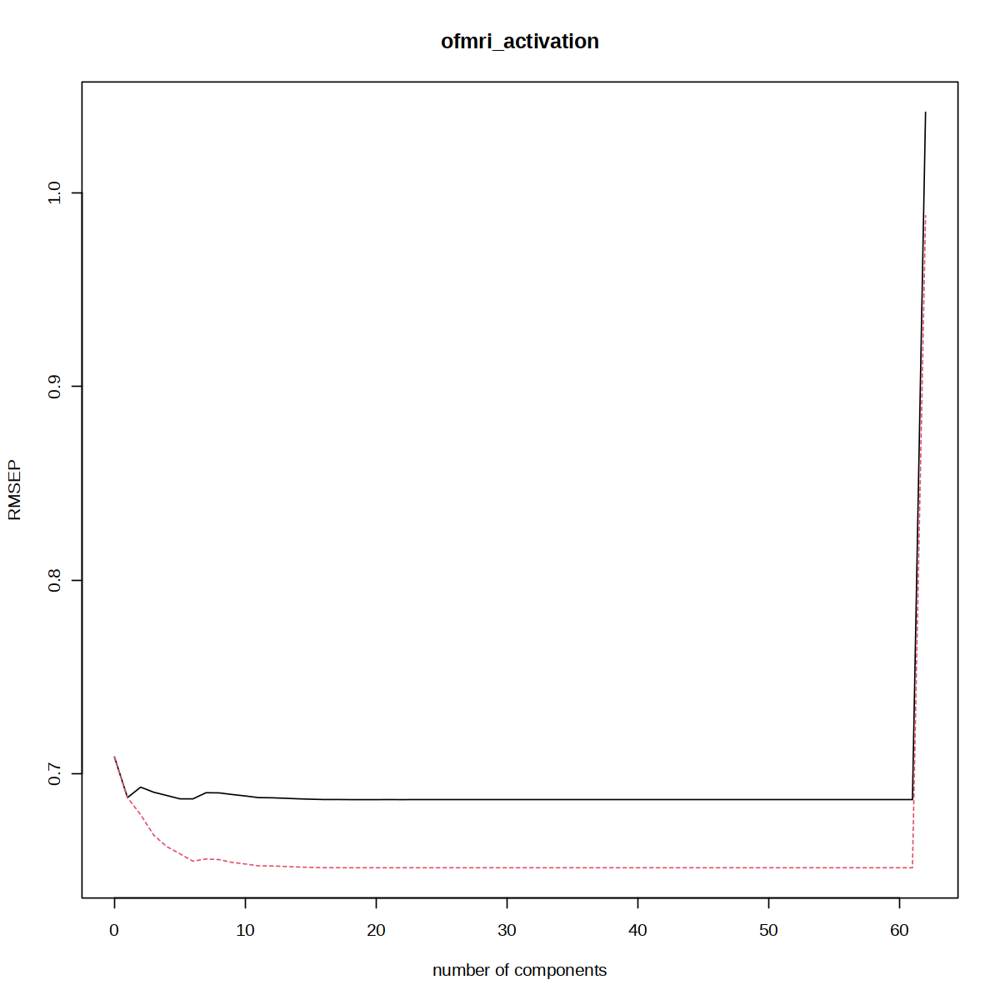

In [1129]:
options(repr.plot.width=10,repr.plot.height=10)
validationplot(model1)

In [1116]:
summary(model1)

Data: 	X dimension: 70 16335 
	Y dimension: 70 1
Fit method: kernelpls
Number of components considered: 62

VALIDATION: RMSEP
Cross-validated using 10 random segments.
       (Intercept)  1 comps  2 comps  3 comps  4 comps  5 comps  6 comps
CV          0.7086   0.6876   0.6930   0.6904   0.6887   0.6869   0.6869
adjCV       0.7086   0.6875   0.6788   0.6682   0.6623   0.6585   0.6547
       7 comps  8 comps  9 comps  10 comps  11 comps  12 comps  13 comps
CV      0.6901   0.6900   0.6892    0.6884    0.6876    0.6875    0.6872
adjCV   0.6559   0.6555   0.6541    0.6533    0.6523    0.6522    0.6520
       14 comps  15 comps  16 comps  17 comps  18 comps  19 comps  20 comps
CV       0.6870    0.6867    0.6866    0.6866    0.6865    0.6865    0.6865
adjCV    0.6517    0.6515    0.6513    0.6513    0.6513    0.6513    0.6513
       21 comps  22 comps  23 comps  24 comps  25 comps  26 comps  27 comps
CV       0.6865    0.6865    0.6865    0.6865    0.6865    0.6865    0.6865
adjCV    0.651

In [1117]:
X_scores <- scores(model1)
Y_scores <- Yscores(model1)

In [1118]:
write.csv(X_scores,'../folder/SUBmodel1/SUB_model1_Xscores.csv')
write.csv(Y_scores,'../folder/SUBmodel1/SUB_model1_Yscores.csv')

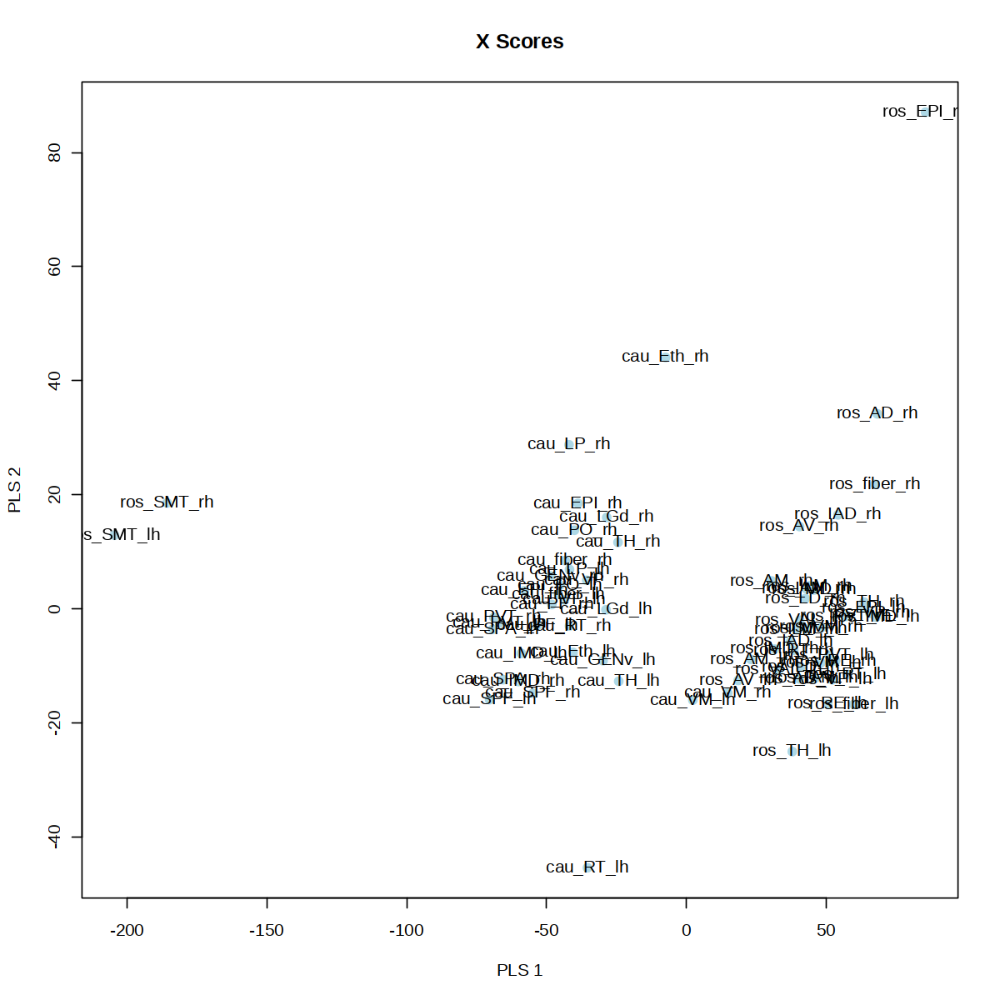

In [1122]:
# Plot X Scores
options(repr.plot.width=10,repr.plot.height=10)
plot(X_scores[,1], X_scores[,2], xlab = "PLS 1", ylab = "PLS 2",
     main = "X Scores", pch = 19, col = "lightblue")
text(X_scores[,1], X_scores[,2], labels=rownames(X_scores), cex= 1)

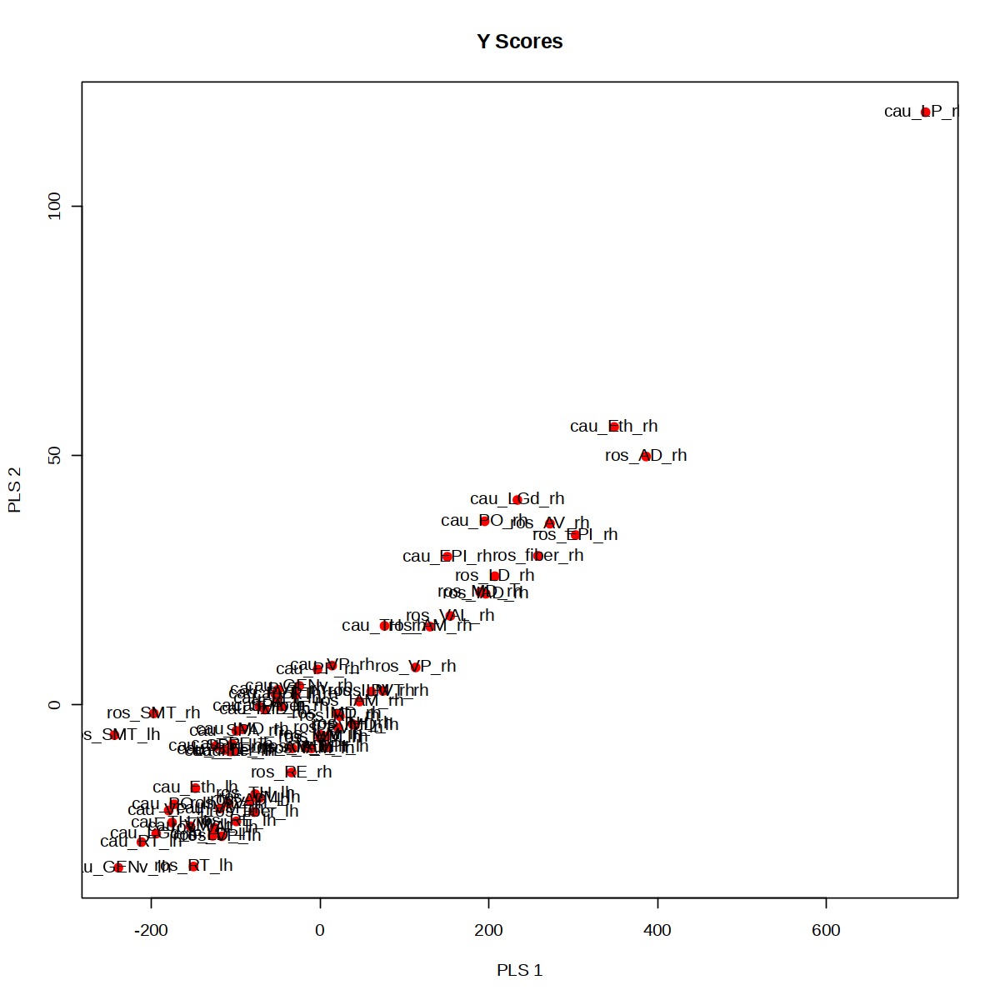

In [1123]:
# Plot Y Scores
plot(Y_scores[,1], Y_scores[,2], xlab = "PLS 1", ylab = "PLS 2",
     main = "Y Scores", pch = 19, col = "red")
text(Y_scores[,1], Y_scores[,2], labels=rownames(Y_scores), cex= 1)

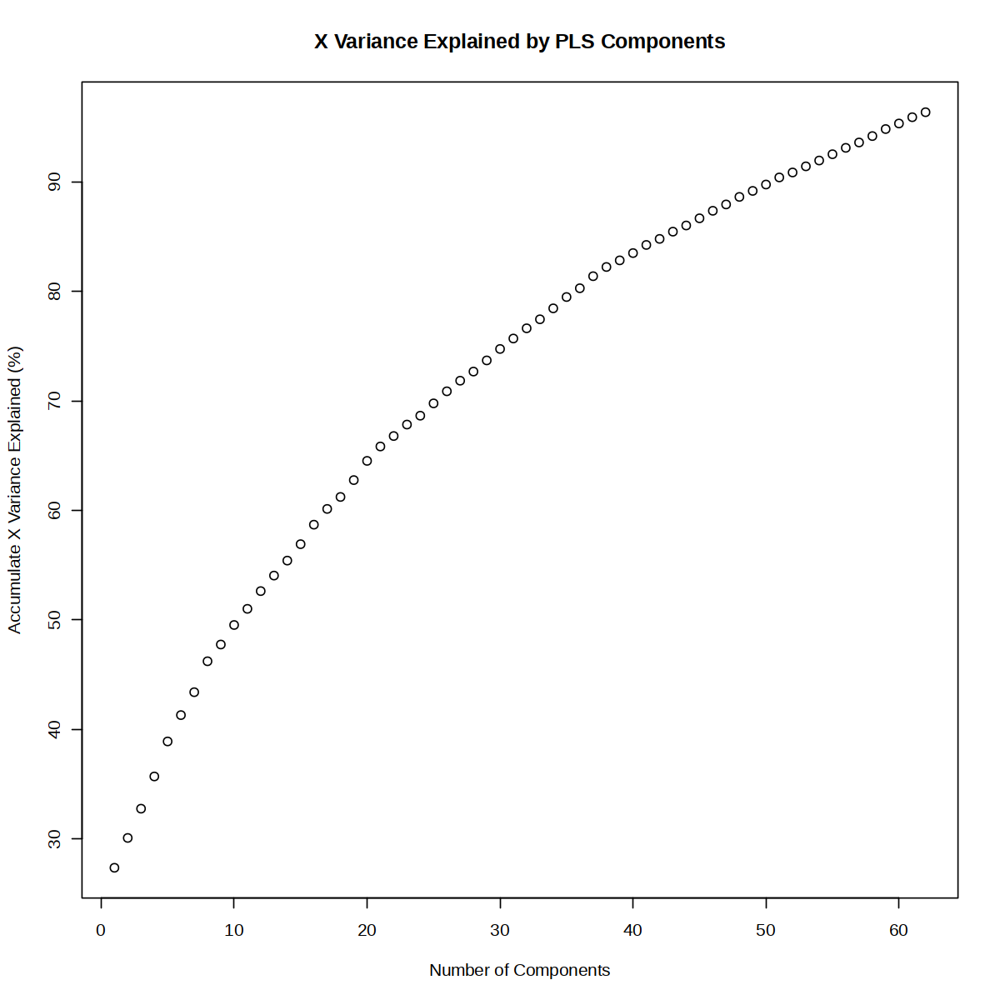

In [1124]:
plot(cumsum(explvar(model1)), xlab = "Number of Components",
     ylab = "Accumulate X Variance Explained (%)", main = "X Variance Explained by PLS Components")

In [1125]:
R2_values <- R2(model1, estimate = "train")

# The R2_values object contains the proportion of variance explained by each component
# We are interested in the cumulative variance explained
#cumulative_R2 <- cumsum(R2_values$val[1,])

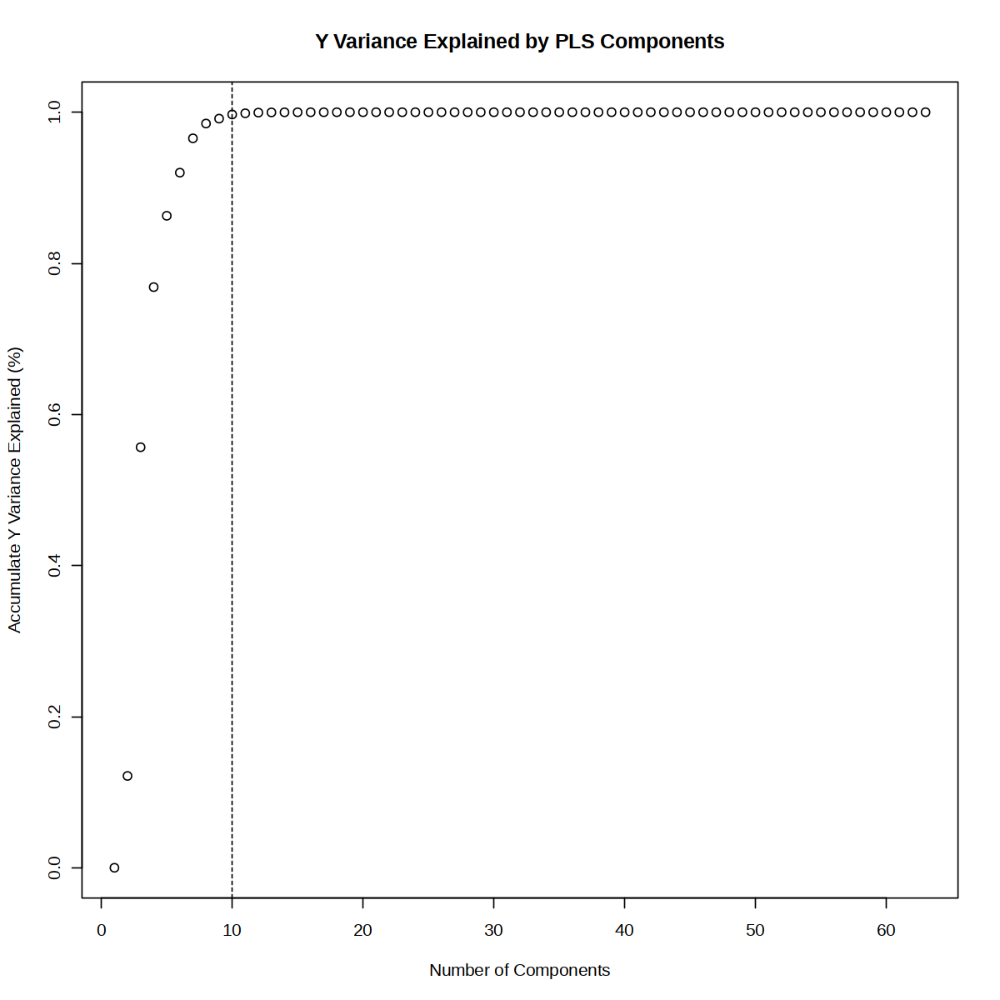

In [1126]:
plot(R2_values$val, xlab = "Number of Components",
     ylab = "Accumulate Y Variance Explained (%)", main = "Y Variance Explained by PLS Components")
abline(v = 10, col = "black", lty = 2)

In [1130]:
X_scores <- scores(model1)
Y_scores <- Yscores(model1)

In [1131]:
PLS1 <- data.frame(x=ofmri$ofmri_activation,y=X_scores[,'Comp 1'])
PLS1$region <- rownames(PLS1)

In [1132]:
cor.test(PLS1$x,PLS1$y)


	Pearson's product-moment correlation

data:  PLS1$x and PLS1$y
t = 3.0673, df = 68, p-value = 0.003099
alternative hypothesis: true correlation is not equal to 0
95 percent confidence interval:
 0.1237963 0.5394149
sample estimates:
      cor 
0.3486291 


`geom_smooth()` using formula = 'y ~ x'


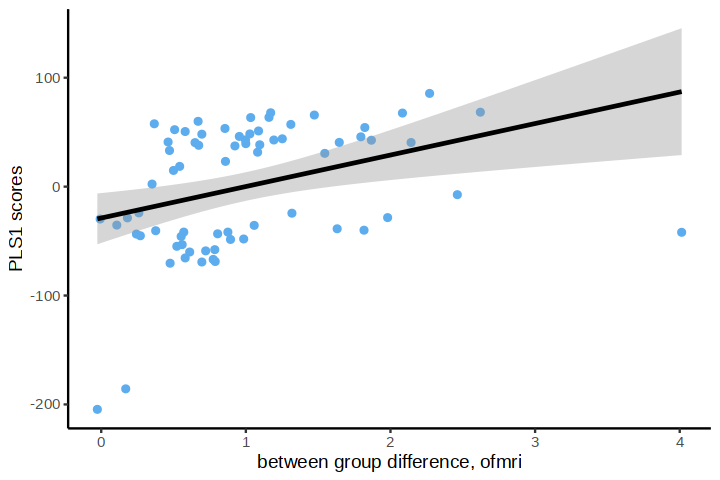

In [1133]:
options(repr.plot.width=6,repr.plot.height=4)
ggplot(PLS1,aes(x=x,y=y))+geom_point(color='steelblue2')+
geom_smooth(color="black",method="lm",se=TRUE)+
xlab('between group difference, ofmri')+
ylab('PLS1 scores')+
theme_classic()

In [1134]:
PLS2 <- data.frame(x=ofmri$ofmri_activation,y=X_scores[,'Comp 2'])
PLS2$region <- rownames(PLS2)

In [1135]:
cor.test(PLS2$x,PLS2$y)


	Pearson's product-moment correlation

data:  PLS2$x and PLS2$y
t = 7.2364, df = 68, p-value = 5.312e-10
alternative hypothesis: true correlation is not equal to 0
95 percent confidence interval:
 0.5024932 0.7745218
sample estimates:
      cor 
0.6595878 


`geom_smooth()` using formula = 'y ~ x'


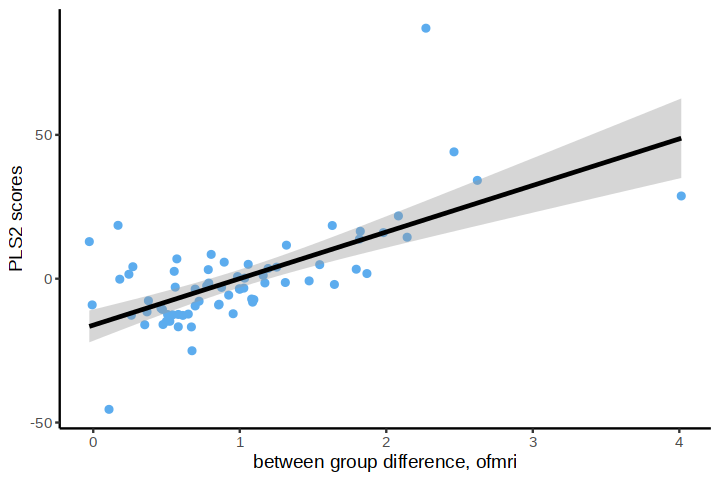

In [1136]:
options(repr.plot.width=6,repr.plot.height=4)
ggplot(PLS2,aes(x=x,y=y))+geom_point(color='steelblue2')+
geom_smooth(color="black",method="lm",se=TRUE)+
xlab('between group difference, ofmri')+
ylab('PLS2 scores')+
theme_classic()

In [1137]:
PLS3 <- data.frame(x=ofmri$ofmri_activation,y=X_scores[,'Comp 3'])
PLS3$region <- rownames(PLS3)
cor.test(PLS3$x,PLS3$y)


	Pearson's product-moment correlation

data:  PLS3$x and PLS3$y
t = 4.2762, df = 68, p-value = 6.077e-05
alternative hypothesis: true correlation is not equal to 0
95 percent confidence interval:
 0.2527133 0.6274532
sample estimates:
      cor 
0.4603512 


`geom_smooth()` using formula = 'y ~ x'


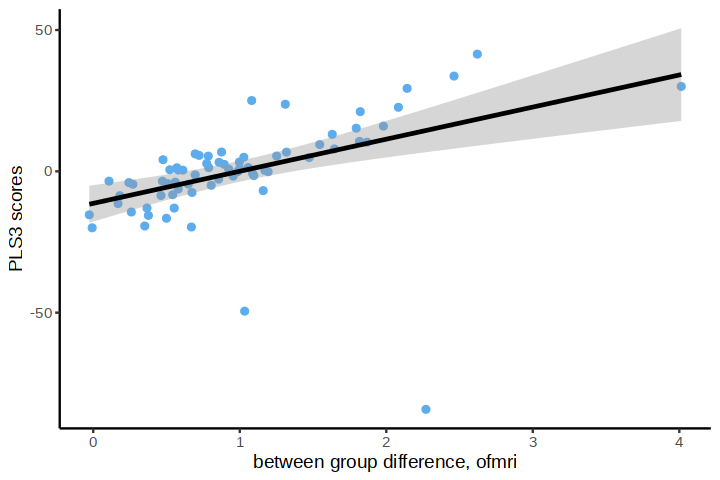

In [1138]:
options(repr.plot.width=6,repr.plot.height=4)
ggplot(PLS3,aes(x=x,y=y))+geom_point(color='steelblue2')+
geom_smooth(color="black",method="lm",se=TRUE)+
xlab('between group difference, ofmri')+
ylab('PLS3 scores')+
theme_classic()

In [1139]:
PLS4 <- data.frame(x=ofmri$ofmri_activation,y=X_scores[,'Comp 4'])
PLS4$region <- rownames(PLS4)
cor.test(PLS4$x,PLS4$y)


	Pearson's product-moment correlation

data:  PLS4$x and PLS4$y
t = 2.6623, df = 68, p-value = 0.009677
alternative hypothesis: true correlation is not equal to 0
95 percent confidence interval:
 0.07788901 0.50570538
sample estimates:
    cor 
0.30724 


`geom_smooth()` using formula = 'y ~ x'


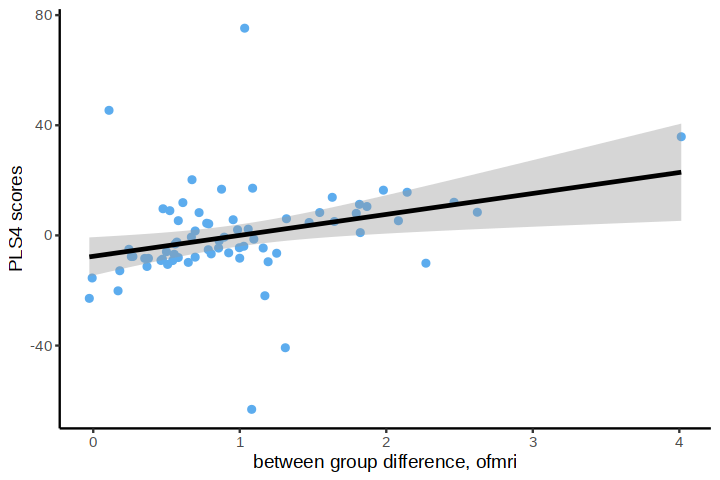

In [1140]:
options(repr.plot.width=6,repr.plot.height=4)
ggplot(PLS4,aes(x=x,y=y))+geom_point(color='steelblue2')+
geom_smooth(color="black",method="lm",se=TRUE)+
xlab('between group difference, ofmri')+
ylab('PLS4 scores')+
theme_classic()

In [1141]:
PLS5 <- data.frame(x=ofmri$ofmri_activation,y=X_scores[,'Comp 5'])
PLS5$region <- rownames(PLS5)
cor.test(PLS5$x,PLS5$y)


	Pearson's product-moment correlation

data:  PLS5$x and PLS5$y
t = 2.0289, df = 68, p-value = 0.04639
alternative hypothesis: true correlation is not equal to 0
95 percent confidence interval:
 0.0041755 0.4486997
sample estimates:
      cor 
0.2389151 


`geom_smooth()` using formula = 'y ~ x'


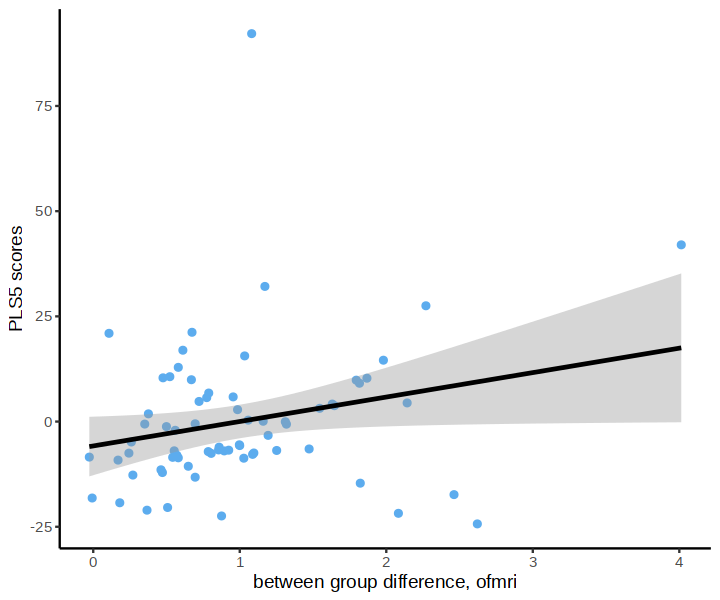

In [1142]:
options(repr.plot.width=6,repr.plot.height=5)
ggplot(PLS5,aes(x=x,y=y))+geom_point(color='steelblue2')+
geom_smooth(color="black",method="lm",se=TRUE)+
xlab('between group difference, ofmri')+
ylab('PLS5 scores')+
theme_classic()

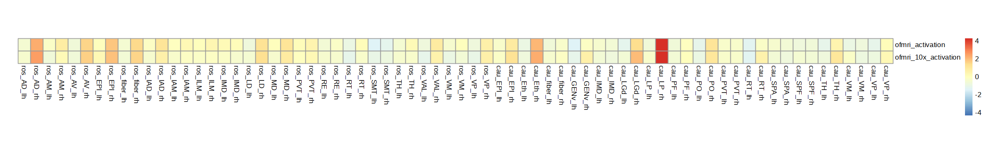

In [1143]:
mri <- cbind(ofmri,ofmri_10x)
options(repr.plot.width=20,repr.plot.height=3)
pheatmap(t(mri),cluster_rows = F,cluster_cols = F,cellwidth = 18,cellheight = 18,scale='row')

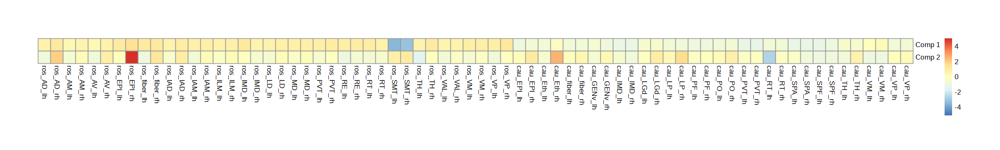

In [1144]:
options(repr.plot.width=20,repr.plot.height=3)
pheatmap(t(X_scores[,c('Comp 1','Comp 2')]),
         cluster_rows = F,cluster_cols = F,scale='row',cellwidth = 18,cellheight = 18)

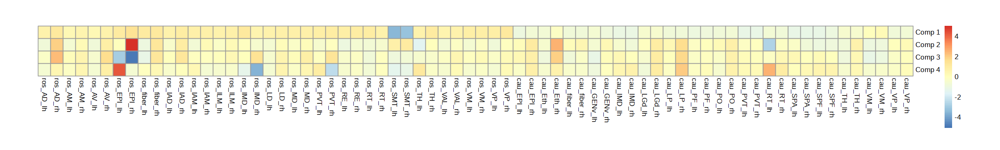

In [1145]:
options(repr.plot.width=20,repr.plot.height=3)
pheatmap(t(X_scores[,c('Comp 1','Comp 2','Comp 3','Comp 4')]),
         cluster_rows = F,cluster_cols = F,scale='row',cellwidth = 18,cellheight = 18)

### model2 ofmri_10x_activation

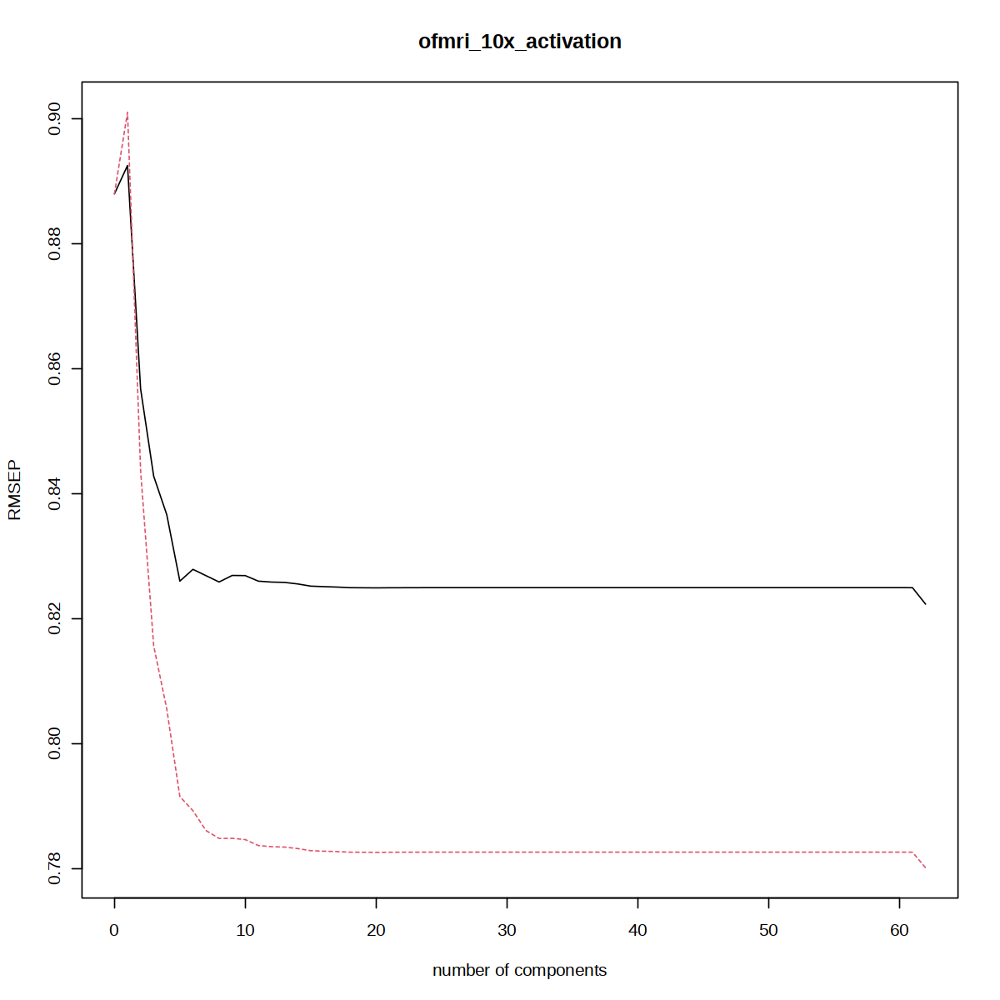

In [1146]:
options(repr.plot.width=10,repr.plot.height=10)
validationplot(model2)

In [1147]:
summary(model2)

Data: 	X dimension: 70 16335 
	Y dimension: 70 1
Fit method: kernelpls
Number of components considered: 62

VALIDATION: RMSEP
Cross-validated using 10 random segments.
       (Intercept)  1 comps  2 comps  3 comps  4 comps  5 comps  6 comps
CV           0.888   0.8925   0.8567   0.8428   0.8366   0.8260   0.8279
adjCV        0.888   0.9010   0.8437   0.8156   0.8055   0.7915   0.7892
       7 comps  8 comps  9 comps  10 comps  11 comps  12 comps  13 comps
CV      0.8269   0.8258   0.8269    0.8269    0.8260    0.8258    0.8258
adjCV   0.7861   0.7848   0.7848    0.7846    0.7837    0.7835    0.7834
       14 comps  15 comps  16 comps  17 comps  18 comps  19 comps  20 comps
CV       0.8255    0.8252    0.8251    0.8250    0.8249    0.8249    0.8249
adjCV    0.7832    0.7828    0.7828    0.7827    0.7826    0.7826    0.7826
       21 comps  22 comps  23 comps  24 comps  25 comps  26 comps  27 comps
CV       0.8249    0.8249    0.8249    0.8249    0.8249    0.8249    0.8249
adjCV    0.782

In [1148]:
X_scores <- scores(model2)
Y_scores <- Yscores(model2)

In [1149]:
write.csv(X_scores,'../folder/SUBmodel2/SUB_model2_Xscores.csv')
write.csv(Y_scores,'../folder/SUBmodel2/SUB_model2_Yscores.csv')

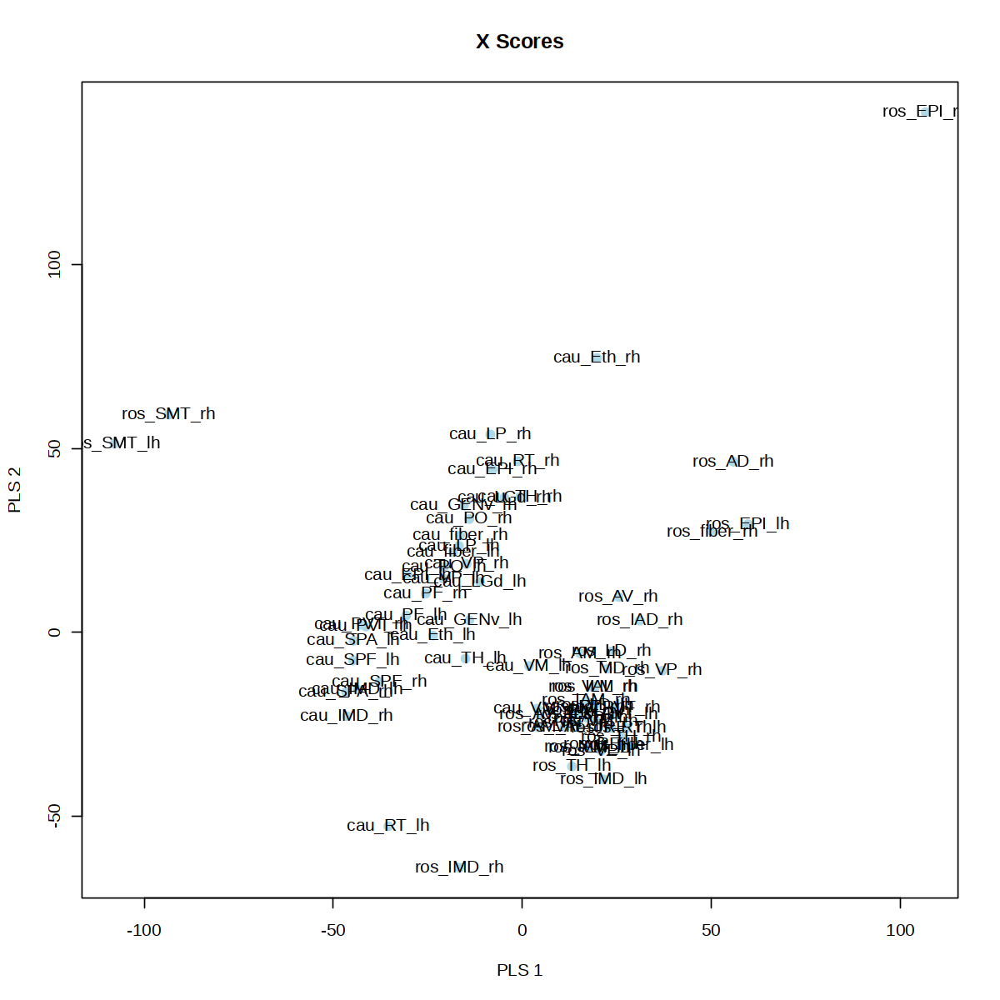

In [1150]:
# Plot X Scores
options(repr.plot.width=10,repr.plot.height=10)
plot(X_scores[,1], X_scores[,2], xlab = "PLS 1", ylab = "PLS 2",
     main = "X Scores", pch = 19, col = "lightblue")
text(X_scores[,1], X_scores[,2], labels=rownames(X_scores), cex= 1)

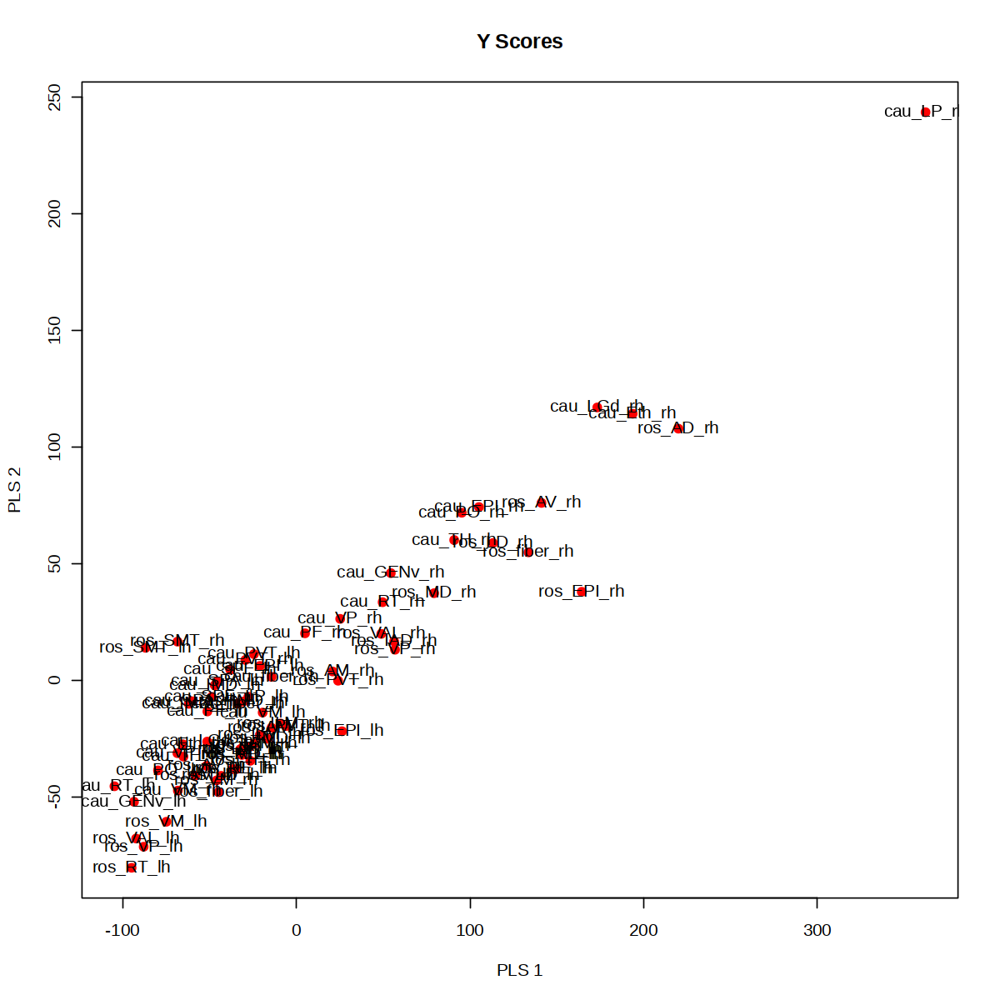

In [1151]:
# Plot Y Scores
plot(Y_scores[,1], Y_scores[,2], xlab = "PLS 1", ylab = "PLS 2",
     main = "Y Scores", pch = 19, col = "red")
text(Y_scores[,1], Y_scores[,2], labels=rownames(Y_scores), cex= 1)

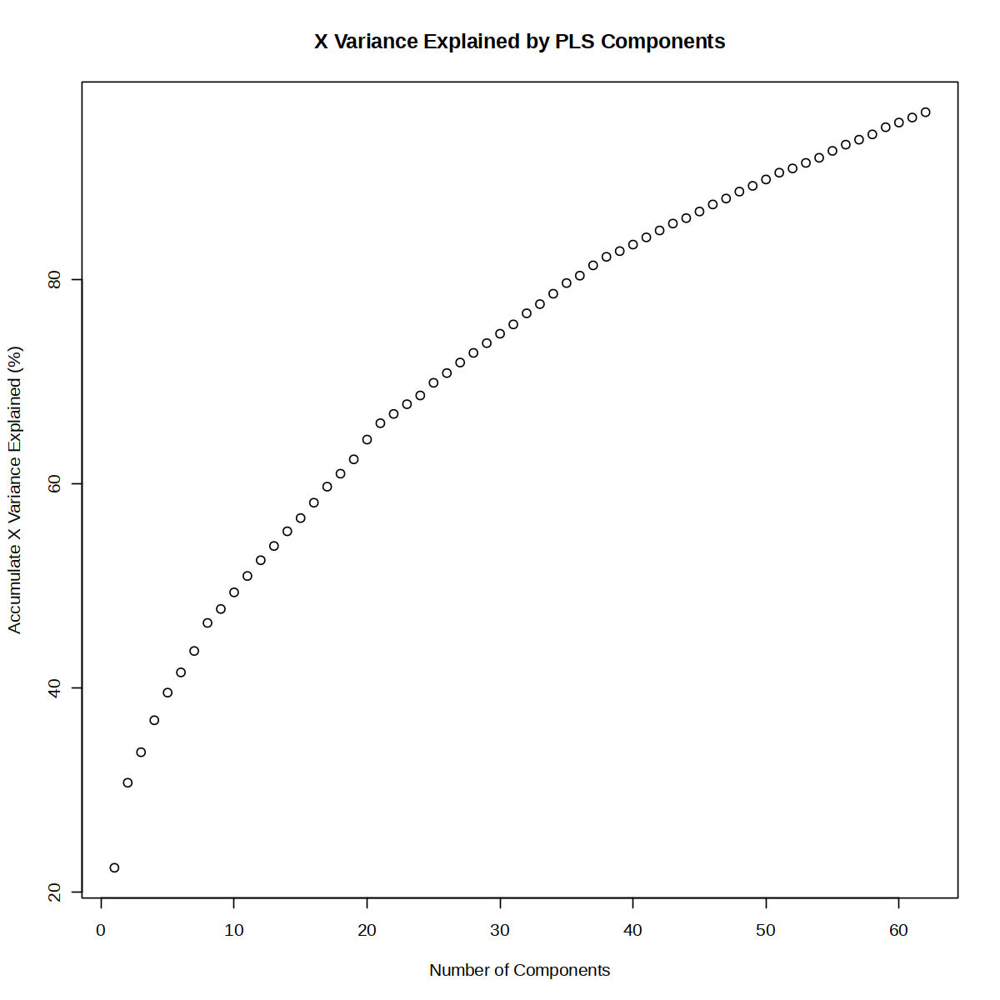

In [1152]:
plot(cumsum(explvar(model2)), xlab = "Number of Components",
     ylab = "Accumulate X Variance Explained (%)", main = "X Variance Explained by PLS Components")

In [1153]:
R2_values <- R2(model2, estimate = "train")

# The R2_values object contains the proportion of variance explained by each component
# We are interested in the cumulative variance explained
#cumulative_R2 <- cumsum(R2_values$val[1,])

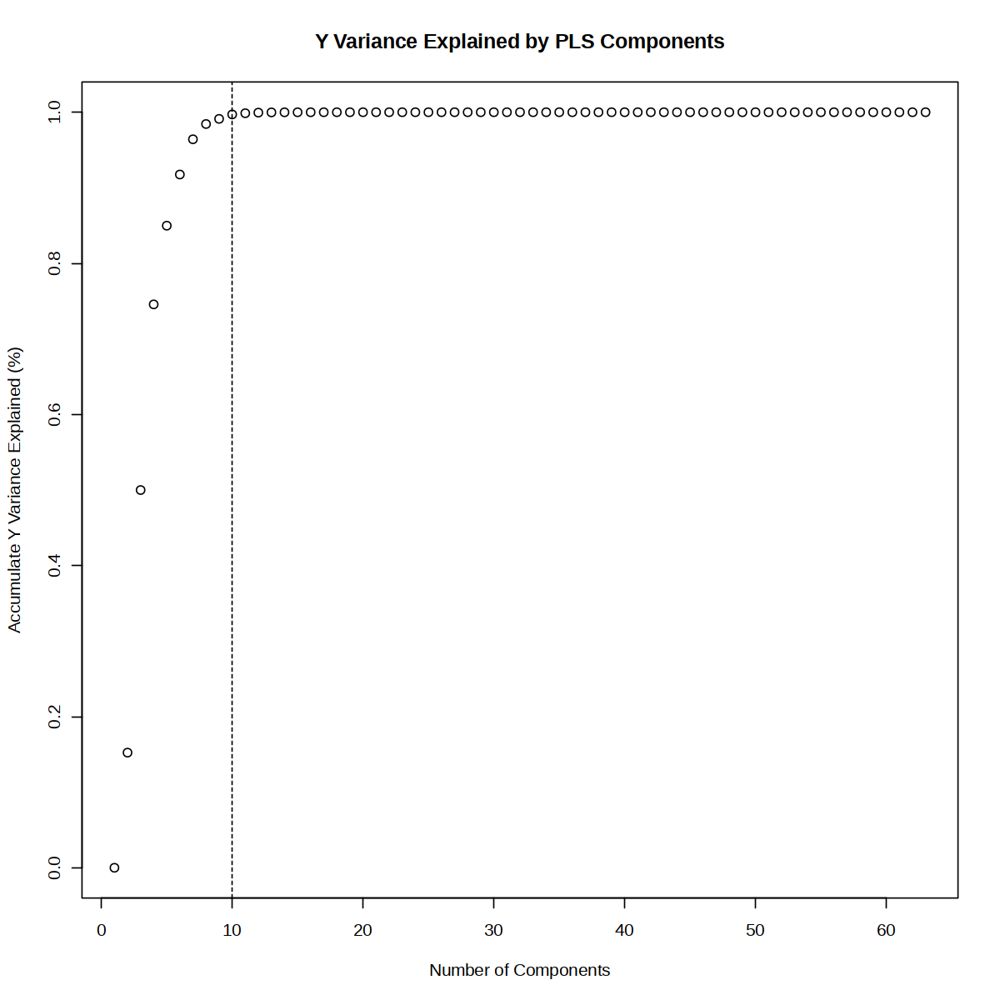

In [1154]:
plot(R2_values$val, xlab = "Number of Components",
     ylab = "Accumulate Y Variance Explained (%)", main = "Y Variance Explained by PLS Components")
abline(v = 10, col = "black", lty = 2)

In [1155]:
X_scores <- scores(model2)
Y_scores <- Yscores(model2)

In [1170]:
PLS1 <- data.frame(x=ofmri_10x$ofmri_10x_activation,y=X_scores[,'Comp 1'])
PLS1$region <- rownames(PLS1)

In [1171]:
cor.test(PLS1$x,PLS1$y)


	Pearson's product-moment correlation

data:  PLS1$x and PLS1$y
t = 3.4965, df = 68, p-value = 0.0008352
alternative hypothesis: true correlation is not equal to 0
95 percent confidence interval:
 0.1710895 0.5728027
sample estimates:
    cor 
0.39037 


`geom_smooth()` using formula = 'y ~ x'


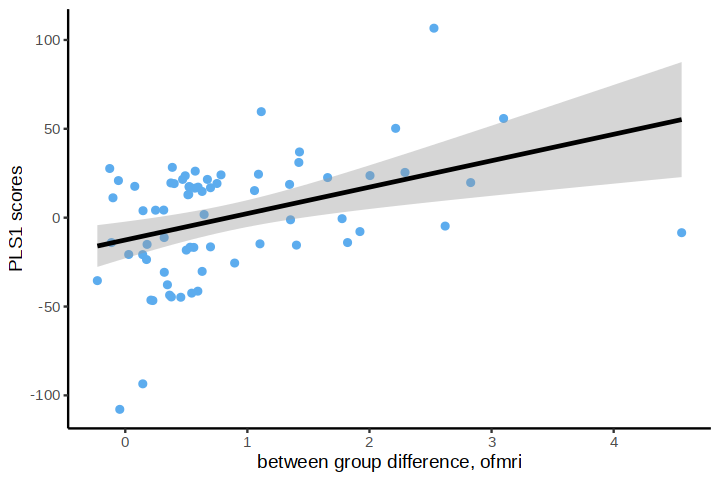

In [1172]:
options(repr.plot.width=6,repr.plot.height=4)
ggplot(PLS1,aes(x=x,y=y))+geom_point(color='steelblue2')+
geom_smooth(color="black",method="lm",se=TRUE)+
xlab('between group difference, ofmri')+
ylab('PLS1 scores')+
theme_classic()

In [1173]:
PLS2 <- data.frame(x=ofmri_10x$ofmri_10x_activation,y=X_scores[,'Comp 2'])
PLS2$region <- rownames(PLS2)

In [1174]:
cor.test(PLS2$x,PLS2$y)


	Pearson's product-moment correlation

data:  PLS2$x and PLS2$y
t = 6.0184, df = 68, p-value = 7.897e-08
alternative hypothesis: true correlation is not equal to 0
95 percent confidence interval:
 0.4115615 0.7241828
sample estimates:
      cor 
0.5895248 


`geom_smooth()` using formula = 'y ~ x'


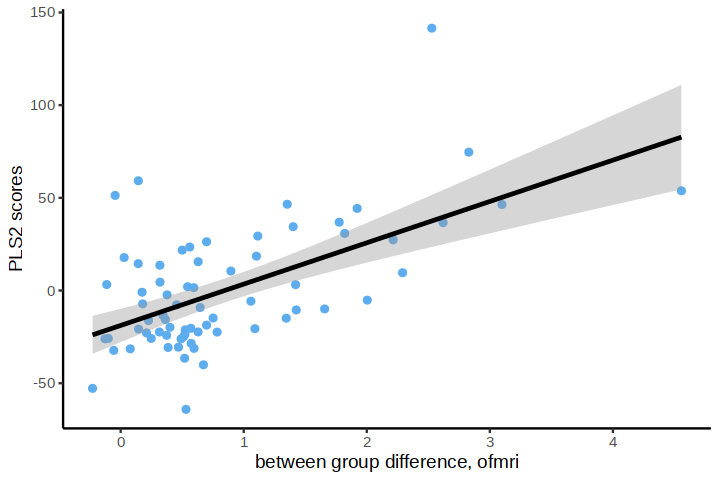

In [1175]:
options(repr.plot.width=6,repr.plot.height=4)
ggplot(PLS2,aes(x=x,y=y))+geom_point(color='steelblue2')+
geom_smooth(color="black",method="lm",se=TRUE)+
xlab('between group difference, ofmri')+
ylab('PLS2 scores')+
theme_classic()

In [1176]:
PLS3 <- data.frame(x=ofmri_10x$ofmri_10x_activation,y=X_scores[,'Comp 3'])
PLS3$region <- rownames(PLS3)
cor.test(PLS3$x,PLS3$y)


	Pearson's product-moment correlation

data:  PLS3$x and PLS3$y
t = 4.7069, df = 68, p-value = 1.28e-05
alternative hypothesis: true correlation is not equal to 0
95 percent confidence interval:
 0.2951251 0.6544633
sample estimates:
      cor 
0.4957224 


`geom_smooth()` using formula = 'y ~ x'


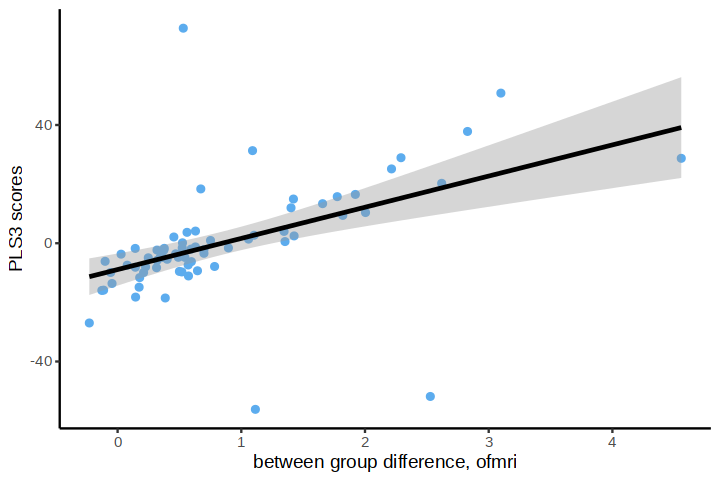

In [1177]:
options(repr.plot.width=6,repr.plot.height=4)
ggplot(PLS3,aes(x=x,y=y))+geom_point(color='steelblue2')+
geom_smooth(color="black",method="lm",se=TRUE)+
xlab('between group difference, ofmri')+
ylab('PLS3 scores')+
theme_classic()

In [1178]:
PLS4 <- data.frame(x=ofmri_10x$ofmri_10x_activation,y=X_scores[,'Comp 4'])
PLS4$region <- rownames(PLS4)
cor.test(PLS4$x,PLS4$y)


	Pearson's product-moment correlation

data:  PLS4$x and PLS4$y
t = 2.8117, df = 68, p-value = 0.006433
alternative hypothesis: true correlation is not equal to 0
95 percent confidence interval:
 0.09495351 0.51839020
sample estimates:
     cor 
0.322727 


`geom_smooth()` using formula = 'y ~ x'


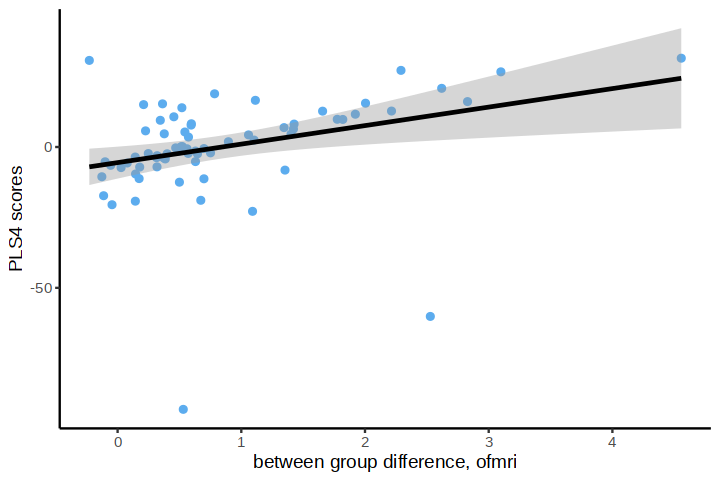

In [1179]:
options(repr.plot.width=6,repr.plot.height=4)
ggplot(PLS4,aes(x=x,y=y))+geom_point(color='steelblue2')+
geom_smooth(color="black",method="lm",se=TRUE)+
xlab('between group difference, ofmri')+
ylab('PLS4 scores')+
theme_classic()

In [1141]:
PLS5 <- data.frame(x=ofmri$ofmri_activation,y=X_scores[,'Comp 5'])
PLS5$region <- rownames(PLS5)
cor.test(PLS5$x,PLS5$y)


	Pearson's product-moment correlation

data:  PLS5$x and PLS5$y
t = 2.0289, df = 68, p-value = 0.04639
alternative hypothesis: true correlation is not equal to 0
95 percent confidence interval:
 0.0041755 0.4486997
sample estimates:
      cor 
0.2389151 


`geom_smooth()` using formula = 'y ~ x'


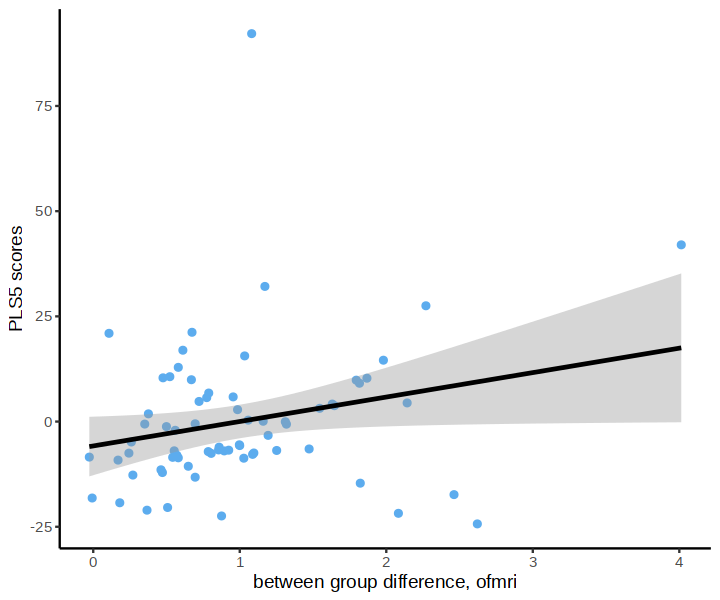

In [1142]:
options(repr.plot.width=6,repr.plot.height=5)
ggplot(PLS5,aes(x=x,y=y))+geom_point(color='steelblue2')+
geom_smooth(color="black",method="lm",se=TRUE)+
xlab('between group difference, ofmri')+
ylab('PLS5 scores')+
theme_classic()

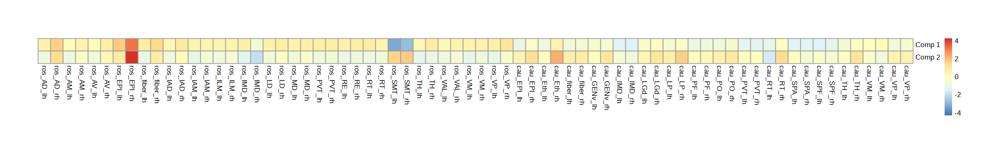

In [1168]:
options(repr.plot.width=20,repr.plot.height=3)
pheatmap(t(X_scores[,c('Comp 1','Comp 2')]),
         cluster_rows = F,cluster_cols = F,scale='row',cellwidth = 18,cellheight = 18)

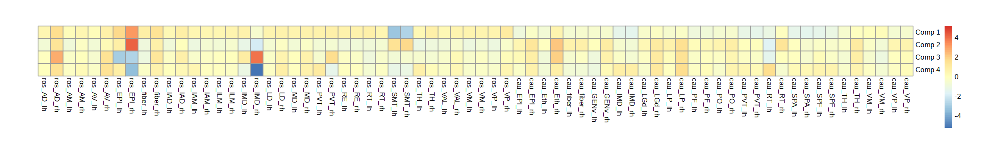

In [1169]:
options(repr.plot.width=20,repr.plot.height=3)
pheatmap(t(X_scores[,c('Comp 1','Comp 2','Comp 3','Comp 4')]),
         cluster_rows = F,cluster_cols = F,scale='row',cellwidth = 18,cellheight = 18)

# END